# Corruption Prediction using the World Bank Indicators

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import os
import xgboost as xgb
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression 
from sklearn.ensemble import RandomForestRegressor 
from matplotlib import gridspec
from matplotlib import style
from prophet import Prophet
import statsmodels
from tqdm import tqdm
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from sklearn.model_selection import train_test_split, KFold
from xgboost import XGBRegressor 
from statsmodels.nonparametric.smoothers_lowess import lowess
import pycountry
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
from statsmodels.tsa.arima.model import ARIMA
from xgboost import plot_tree
from keras.models import Sequential
from keras.layers import Dense
import tensorflow_decision_forests as tfdf
from tensorflow.keras.utils import plot_model
import pydotplus as pydot
import graphviz
import networkx as nx
import visualkeras
from xgboost import plot_importance

# Model 1

In [276]:
df = pd.read_csv('WDI_data.csv')
df = df.drop(columns=['CPI_EST'])
# Make corruption more intuitive with higher values indicating more corruption
df['CC_EST'] = (-1)*df['CC_EST']
df['CC_EST'] = (df['CC_EST'] + 2.5) * 20
# Drop years 1960-2011 if column 'year' is less than 2012
df_dr = df[df['year'] >= 2012]

In [277]:
# Create a new dataframe with only iso2c, country, and CC_EST
df_corr = df_dr[['iso2c', 'country','year', 'CC_EST']]

In [278]:
df_corr

,iso2c,country,year,CC_EST
52,AD,Andorra,2012,24.789383
53,AD,Andorra,2013,24.929030
54,AD,Andorra,2014,25.585828
55,AD,Andorra,2015,26.963785
56,AD,Andorra,2016,26.808882
...,...,...,...,...
13729,ZW,Zimbabwe,2018,74.920013
13730,ZW,Zimbabwe,2019,75.423806
13731,ZW,Zimbabwe,2020,75.759847
13732,ZW,Zimbabwe,2021,75.071001


In [279]:
# Filter the data for the years 2012 and 2022
df_filtered = df_corr[df_corr['year'].isin([2012, 2022])]

# Calculate the linear differences over time for each given country
change_by_country = df_filtered.pivot_table(index='iso2c', columns='year', values='CC_EST', aggfunc='first')

# Calculate the change for each country
change_by_country['avg_change'] = (change_by_country[2022] - change_by_country[2012]) / 10

# Calculate the mean and median CC_EST values across all years for each country
mean_cc_est_by_country = df_filtered.groupby('iso2c')['CC_EST'].mean()
median_cc_est_by_country = df_filtered.groupby('iso2c')['CC_EST'].median()

# Merge with the original DataFrame to get the country names
df_trend = pd.merge(change_by_country['avg_change'], mean_cc_est_by_country, left_index=True, right_index=True, how='left')
df_trend = pd.merge(df_trend, median_cc_est_by_country, left_index=True, right_index=True, how='left')

# Reset index and rename columns
df_trend.reset_index(inplace=True)
df_trend.rename(columns={'CC_EST_x': 'mean_CC_EST', 'CC_EST_y': 'median_CC_EST'}, inplace=True)

# Include country names
df_trend = pd.merge(df_trend, df_filtered[['iso2c', 'country']].drop_duplicates(), on='iso2c', how='left')

print(df_trend)


    iso2c  avg_change  mean_CC_EST  median_CC_EST  \
0      AD   -0.019346    24.692656      24.692656   
1      AE    0.000799    26.889273      26.889273   
2      AF   -0.493193    76.141493      76.141493   
3      AG    1.899853    34.288647      34.288647   
4      AL   -0.741708    61.866050      61.866050   
5      AM   -1.232073    55.599663      55.599663   
6      AO   -1.400920    69.043427      69.043427   
7      AR    0.002243    58.929397      58.929397   
8      AS   -1.941585    34.303853      34.303853   
9      AT    0.337270    23.141261      23.141261   
10     AU    0.426035    12.580032      12.580032   
11     AW    0.676902    31.479793      31.479793   
12     AZ   -0.204244    71.832664      71.832664   
13     BA    0.748942    59.931993      59.931993   
14     BB    0.727429    20.671388      20.671388   
15     BD    0.437816    69.321464      69.321464   
16     BE    0.128124    19.458410      19.458410   
17     BF   -0.797672    55.660575      55.660

In [280]:
# Max and min values
# Find the index of the maximum and minimum mean_CC_EST values
most_corrupt_idx = df_trend['mean_CC_EST'].idxmax()
least_corrupt_idx = df_trend['mean_CC_EST'].idxmin()

most_corrupt_country = df_trend.loc[most_corrupt_idx, 'country']
least_corrupt_country = df_trend.loc[least_corrupt_idx, 'country']

print("The most corrupt country (on average between 2012 and 2022) is", most_corrupt_country)
print("The least corrupt country (on average between 2012 and 2022) is", least_corrupt_country)
print("The country that became more corrupt (rose the most) on average between 2012 and 2022 is", df_trend.loc[df_trend['avg_change'].idxmax(), 'country'])
print("The country that became less corrupt (fell the most) on average between 2012 and 2022 is", df_trend.loc[df_trend['avg_change'].idxmin(), 'country'])

The most corrupt country (on average between 2012 and 2022) is Somalia
The least corrupt country (on average between 2012 and 2022) is Denmark
The country that became more corrupt (rose the most) on average between 2012 and 2022 is Antigua and Barbuda
The country that became less corrupt (fell the most) on average between 2012 and 2022 is Seychelles


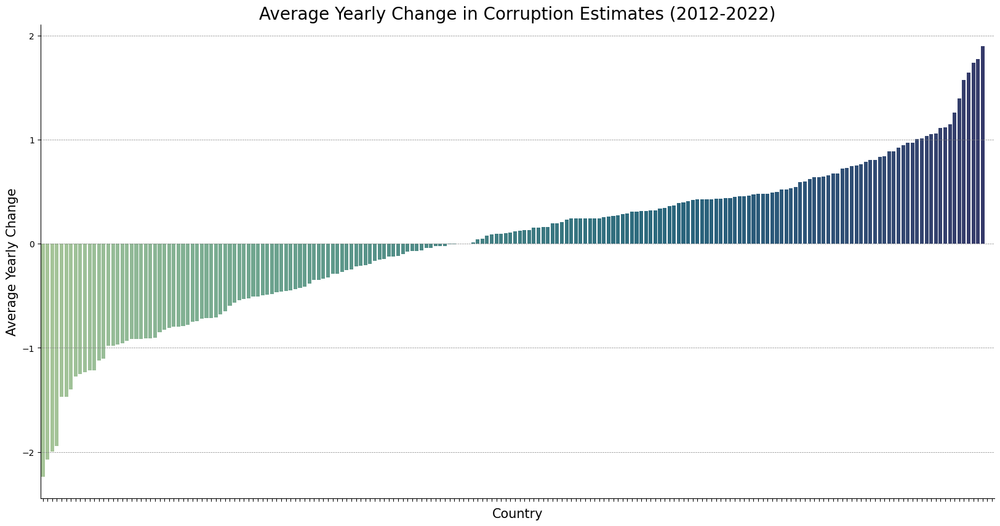

In [281]:
style.use('default')
df_trend = df_trend.sort_values('avg_change', ascending=True)
fig, ax = plt.subplots(figsize=(20, 10))

sns.barplot(x='country', y='avg_change', data=df_trend, ax=ax, palette = 'crest')

ax.set_title('Average Yearly Change in Corruption Estimates (2012-2022)', fontsize=20)
ax.set_xlabel('Country', fontsize=15)
ax.set_ylabel('Average Yearly Change', fontsize=15)

ax.set_xticklabels([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.grid(color='gray', linestyle='--', linewidth=0.5, axis='y')

plt.show()

In [282]:
# Mean and standard deviation of the average yearly change in corruption estimates between 2012 and 2022
mean_change = df_trend['avg_change'].mean()
std_change = df_trend['avg_change'].std()

print("The mean average yearly change in corruption estimates between 2012 and 2022 is", mean_change)
print("The standard deviation of the average yearly change in corruption estimates between 2012 and 2022 is", std_change)

The mean average yearly change in corruption estimates between 2012 and 2022 is 0.01970628684158408
The standard deviation of the average yearly change in corruption estimates between 2012 and 2022 is 0.7312920855366155


In [283]:
# List the top 10 countries that became more corrupt on average between 2012 and 2022
print("Top 10 countries that became more corrupt on average between 2012 and 2022:")
print(df_trend[['country', 'avg_change']].sort_values('avg_change', ascending=False).head(10))

# List the top 10 countries that became less corrupt on average between 2012 and 2022
print("Top 10 countries that became less corrupt on average between 2012 and 2022:")
print(df_trend[['country', 'avg_change']].sort_values('avg_change', ascending=True).head(10))

Top 10 countries that became more corrupt on average between 2012 and 2022:
                   country  avg_change
3      Antigua and Barbuda    1.899853
101         Cayman Islands    1.777005
97     St. Kitts and Nevis    1.741485
44                  Cyprus    1.643386
195  Virgin Islands (U.S.)    1.571842
126                  Malta    1.393783
184                Turkiye    1.257980
37                   Chile    1.150622
171            South Sudan    1.119872
174   Syrian Arab Republic    1.113265
Top 10 countries that became less corrupt on average between 2012 and 2022:
               country  avg_change
160         Seychelles   -2.236412
151              Palau   -2.070680
186             Tuvalu   -1.993962
8       American Samoa   -1.941585
102         Kazakhstan   -1.471929
21               Benin   -1.467326
6               Angola   -1.400920
23   Brunei Darussalam   -1.272374
139              Nauru   -1.252146
5              Armenia   -1.232073


<Axes: xlabel='mean_CC_EST', ylabel='avg_change'>

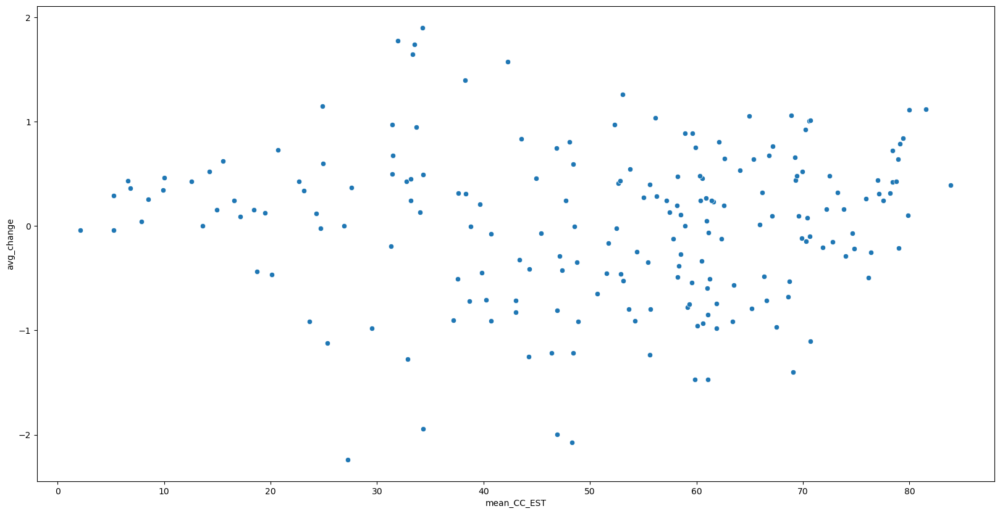

In [284]:
# Plot average yearly change against mean CC_EST
fig, ax = plt.subplots(figsize=(20, 10))
sns.scatterplot(x='mean_CC_EST', y='avg_change', data=df_trend, ax=ax)

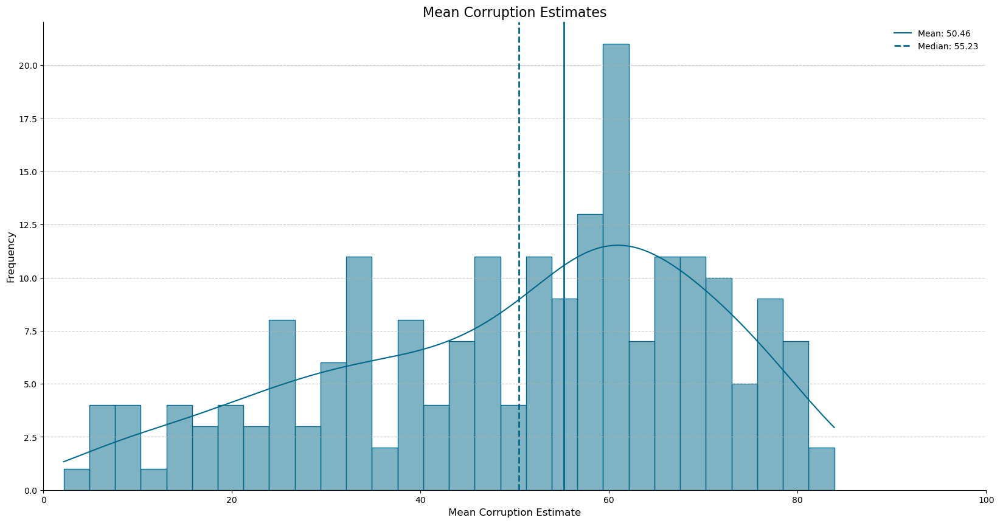

In [285]:
# Plot the mean corruption estimates
plt.figure(figsize=(20, 10))

# Use seaborn's histplot function to plot the histogram
# Set the color, edgecolor and linewidth for the bars
sns.histplot(df_trend['mean_CC_EST'], bins=30, kde=True, color='#00688B', 
             edgecolor='#00688B', linewidth=1)

# Calculate the mean and median of the mean corruption estimates
mean_est = df_trend['mean_CC_EST'].mean()
median_est = df_trend['mean_CC_EST'].median()

# Add a vertical line at the mean
plt.axvline(mean_est, color='#00688B', linestyle='--', linewidth=2)

# Add a vertical line at the median
plt.axvline(median_est, color='#00688B', linestyle='-', linewidth=2)

# Set the labels and title with larger fonts
plt.xlabel('Mean Corruption Estimate', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Mean Corruption Estimates', fontsize=16)

plt.xlim(0,100)

# Set the grid style
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend for mean and median
plt.legend([f'Mean: {mean_est:.2f}', f'Median: {median_est:.2f}'], frameon=False)

# Remove top and right spines
sns.despine()

# Show the plot
plt.show()

In [286]:
df_correl = pd.read_csv('correlations.csv')
# Rank in order of correlation with CC_EST
df_correl = df_correl.sort_values('correlation', ascending=False)
df_correl

,variable,correlation
942,DT_NFL_UNWT_CD,0.907982
557,SE_LPV_PRIM,0.714894
810,SE_LPV_PRIM_MA,0.714519
727,SE_LPV_PRIM_FE,0.714091
96,SE_LPV_PRIM_LD,0.703578
...,...,...
1091,LP_LPI_CUST_XQ,-0.812534
537,NY_ADJ_NNTY_PC_KD,-0.813347
460,SI_SPR_PCAP,-0.841848
463,SI_SPR_PC40,-0.846424


In [287]:
# Remove rows in df_dr that have missing values in CC_EST column
df_dr = df_dr.dropna(subset=['CC_EST'])

# Filter to only show correlations greater than or equal to +- 0.5
df_correl_5 = df_correl[abs(df_correl['correlation']) >= 0.5]
# Filter to only show correlations greater than or equal to +- 0.6
df_correl_6 = df_correl[abs(df_correl['correlation']) >= 0.6]
# Filter to only show correlations greater than or equal to +- 0.7
df_correl_7 = df_correl[abs(df_correl['correlation']) >= 0.7]
# Filter to only show correlations greater than or equal to +- 0.8
df_correl_8 = df_correl[abs(df_correl['correlation']) >= 0.8]
# Filter to only show correlations greater than or equal to +- 0.9
df_correl_9 = df_correl[abs(df_correl['correlation']) >= 0.9]

print(f"The number of correlations with an absolute value greater than or equal to 0.5 is", len(df_correl_5))
print(f"The number of correlations with an absolute value greater than or equal to 0.6 is", len(df_correl_6))
print(f"The number of correlations with an absolute value greater than or equal to 0.7 is", len(df_correl_7))
print(f"The number of correlations with an absolute value greater than or equal to 0.8 is", len(df_correl_8))
print(f"The number of correlations with an absolute value greater than or equal to 0.9 is", len(df_correl_9))

The number of correlations with an absolute value greater than or equal to 0.5 is 253
The number of correlations with an absolute value greater than or equal to 0.6 is 128
The number of correlations with an absolute value greater than or equal to 0.7 is 54
The number of correlations with an absolute value greater than or equal to 0.8 is 7
The number of correlations with an absolute value greater than or equal to 0.9 is 1


I can then use these difffering correlationary values to build a predictive model of corruption whilst optimising for computational efficiency simultaneously.

In [288]:
# Merge together corruption values and the largest correlators
# Create variables that are a list of the variables that are highly correlated with CC_EST
vars_5 = list(df_correl_5['variable'])
vars_6 = list(df_correl_6['variable'])
vars_7 = list(df_correl_7['variable'])
vars_8 = list(df_correl_8['variable'])
vars_9 = list(df_correl_9['variable'])

# Merge the corruption values with the variables that are highly correlated with CC_EST
df_5 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_5]
df_6 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_6]
df_7 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_7]
df_8 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_8]
df_9 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_9]

In [289]:
# Build random forest model to predict corruption from highly correlated variables
# Simplify notation:
x5 = df_5.iloc[:,4:].values
x6 = df_6.iloc[:,4:].values
x7 = df_7.iloc[:,4:].values
x8 = df_8.iloc[:,4:].values
x9 = df_9.iloc[:,4:].values

y = df_dr['CC_EST'].values

Feature ranking:
1. feature 199 (0.3441309630870819)
2. feature 210 (0.23138484358787537)
3. feature 252 (0.11535115540027618)
4. feature 186 (0.01702813431620598)
5. feature 237 (0.013964777812361717)
6. feature 142 (0.013950027525424957)
7. feature 203 (0.011279524303972721)
8. feature 136 (0.010657941922545433)
9. feature 183 (0.01058618538081646)
10. feature 246 (0.00918436236679554)
11. feature 58 (0.008346294984221458)
12. feature 59 (0.007700021378695965)
13. feature 189 (0.007487301714718342)
14. feature 129 (0.00732423085719347)
15. feature 141 (0.006930687930434942)
16. feature 179 (0.005710081662982702)
17. feature 48 (0.005422129761427641)
18. feature 15 (0.005320514086633921)
19. feature 200 (0.005264010746032)
20. feature 150 (0.005106520839035511)
21. feature 98 (0.005003555212169886)
22. feature 122 (0.004956114571541548)
23. feature 174 (0.004833898041397333)
24. feature 20 (0.00476043438538909)
25. feature 31 (0.004652796313166618)
26. feature 219 (0.00463709700852632

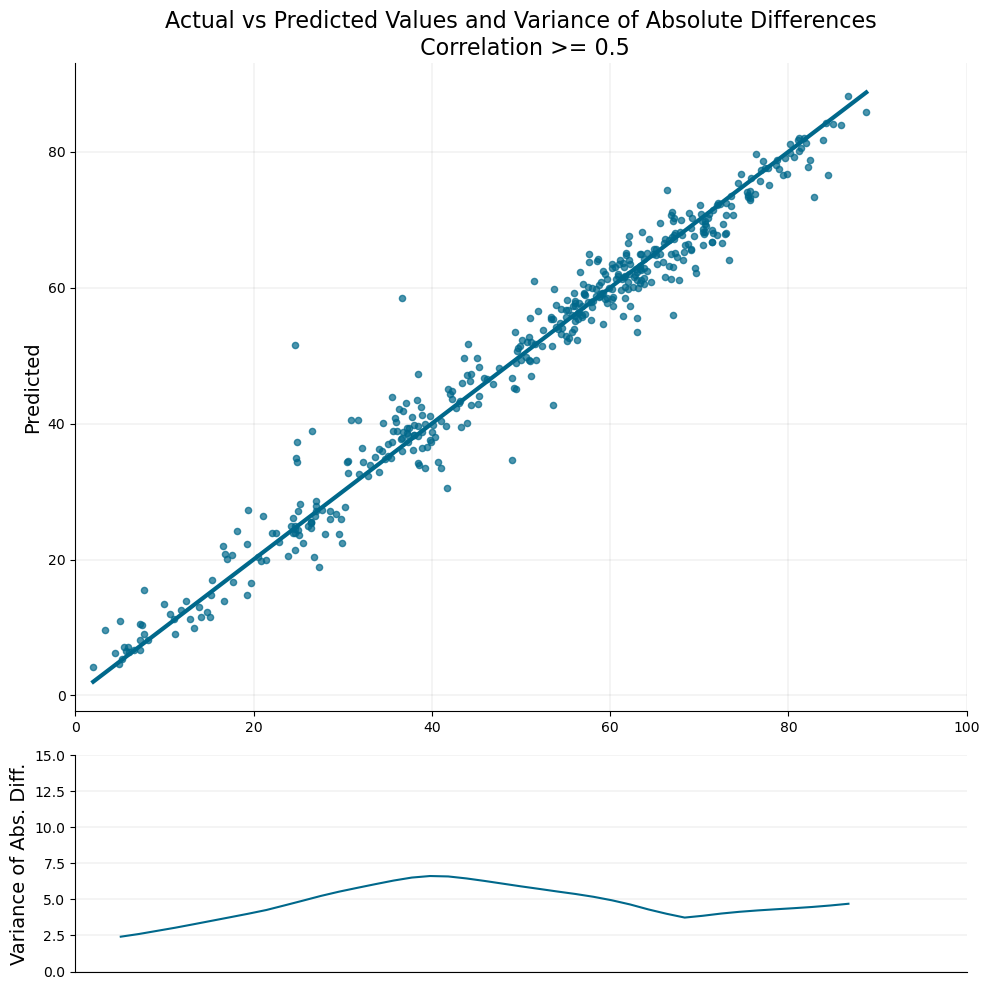

Feature ranking:
1. feature 74 (0.31771016120910645)
2. feature 85 (0.18727819621562958)
3. feature 127 (0.1559630185365677)
4. feature 32 (0.026648659259080887)
5. feature 112 (0.025778453797101974)
6. feature 20 (0.021845590323209763)
7. feature 94 (0.01952669583261013)
8. feature 64 (0.017185378819704056)
9. feature 70 (0.011316444724798203)
10. feature 78 (0.01081069465726614)
11. feature 57 (0.010012955404818058)
12. feature 31 (0.008948569186031818)
13. feature 54 (0.008236341178417206)
14. feature 49 (0.007733013480901718)
15. feature 50 (0.007290168199688196)
16. feature 122 (0.006851824000477791)
17. feature 69 (0.005982161499559879)
18. feature 81 (0.005447397939860821)
19. feature 29 (0.005414977204054594)
20. feature 73 (0.005399579647928476)
21. feature 63 (0.005092828534543514)
22. feature 44 (0.004977512173354626)
23. feature 106 (0.004775524139404297)
24. feature 24 (0.00475804228335619)
25. feature 66 (0.004689306020736694)
26. feature 25 (0.0044582500122487545)
27. fe

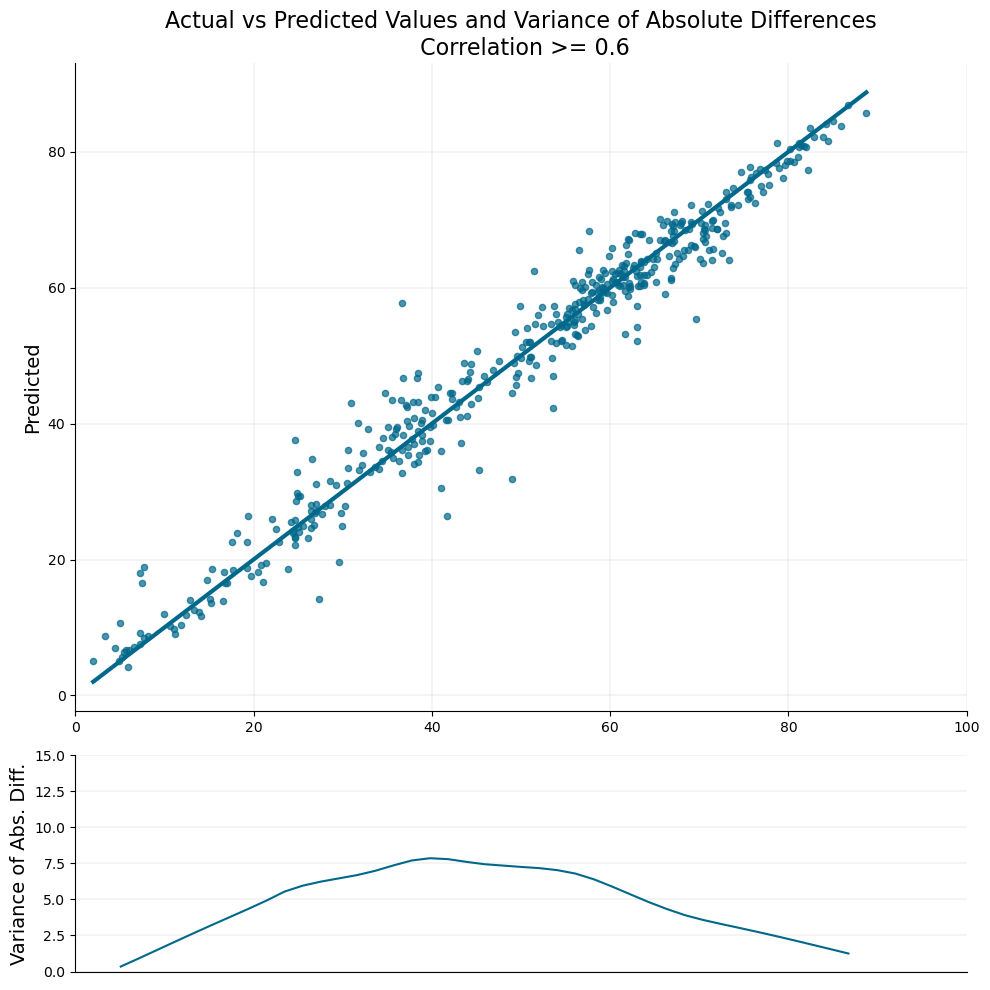

Feature ranking:
1. feature 11 (0.3659200966358185)
2. feature 53 (0.28489449620246887)
3. feature 38 (0.11513756960630417)
4. feature 20 (0.02071014791727066)
5. feature 28 (0.014015117660164833)
6. feature 31 (0.013600725680589676)
7. feature 48 (0.013204297982156277)
8. feature 13 (0.010585211217403412)
9. feature 47 (0.009999927133321762)
10. feature 32 (0.009939268231391907)
11. feature 49 (0.009131794795393944)
12. feature 12 (0.008918261155486107)
13. feature 41 (0.008812271058559418)
14. feature 40 (0.007948868907988071)
15. feature 34 (0.007729346863925457)
16. feature 8 (0.007671836297959089)
17. feature 50 (0.007223219610750675)
18. feature 45 (0.006975828669965267)
19. feature 44 (0.006220669951289892)
20. feature 42 (0.006059700157493353)
21. feature 7 (0.00591591140255332)
22. feature 19 (0.005635147448629141)
23. feature 33 (0.004717874340713024)
24. feature 37 (0.0038628443144261837)
25. feature 30 (0.00358963874168694)
26. feature 43 (0.003124205395579338)
27. feature 

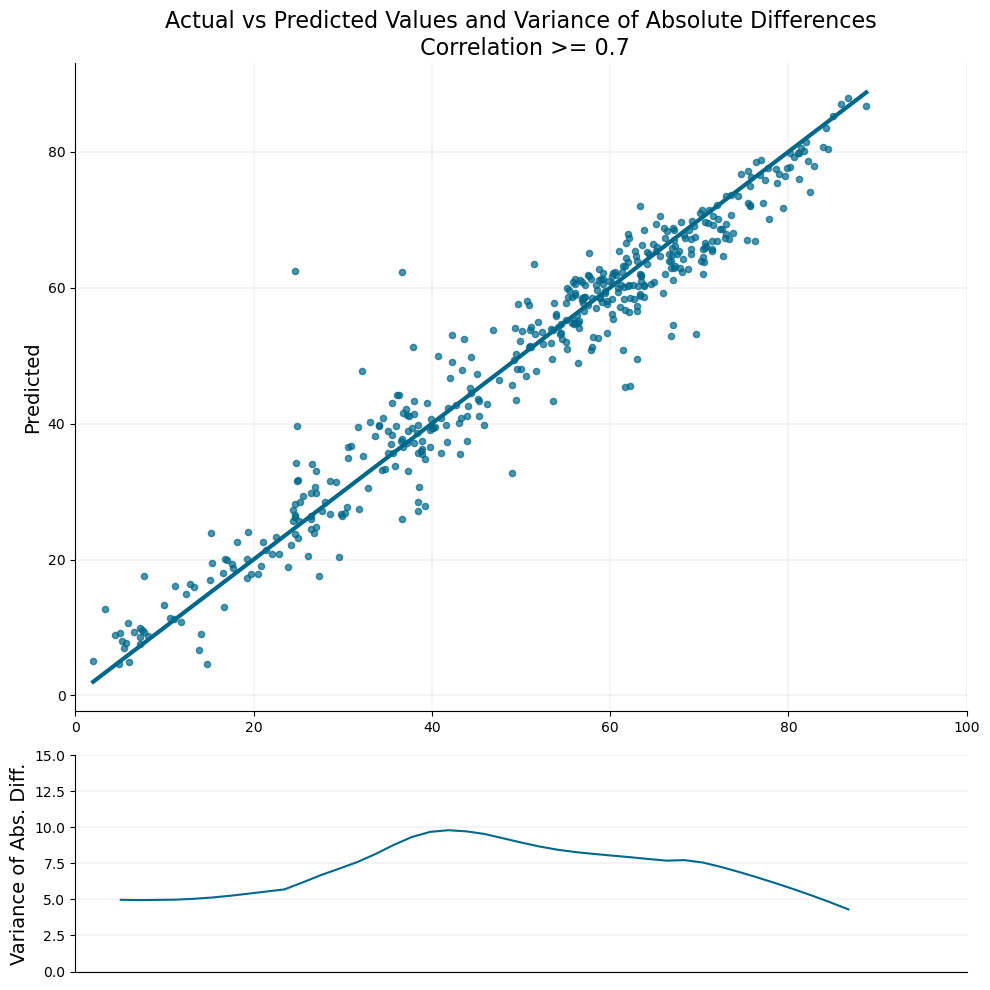

Feature ranking:
1. feature 6 (0.4924904704093933)
2. feature 1 (0.3603402078151703)
3. feature 2 (0.05750051885843277)
4. feature 3 (0.041945330798625946)
5. feature 5 (0.0327630490064621)
6. feature 4 (0.01222801674157381)
7. feature 0 (0.002732437802478671)
Model with correlation >= 0.8:
Training+Validation R^2: 0.81193, RMSE: 8.64535
Testing R^2: 0.79896, RMSE: 9.04992
Mean cross-validation score: 0.75062



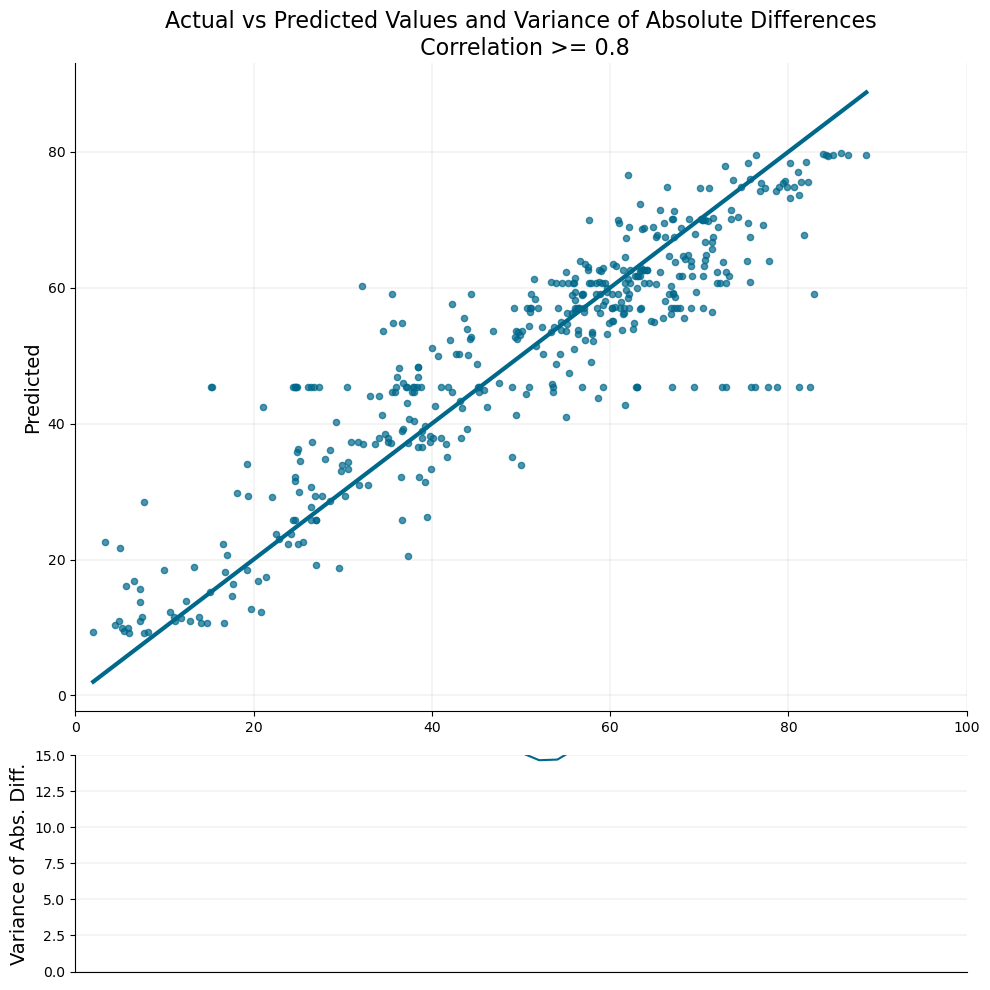

Feature ranking:
1. feature 0 (1.0)
Model with correlation >= 0.9:
Training+Validation R^2: 0.00111, RMSE: 19.92421
Testing R^2: -0.00041, RMSE: 20.18809
Mean cross-validation score: -0.00175



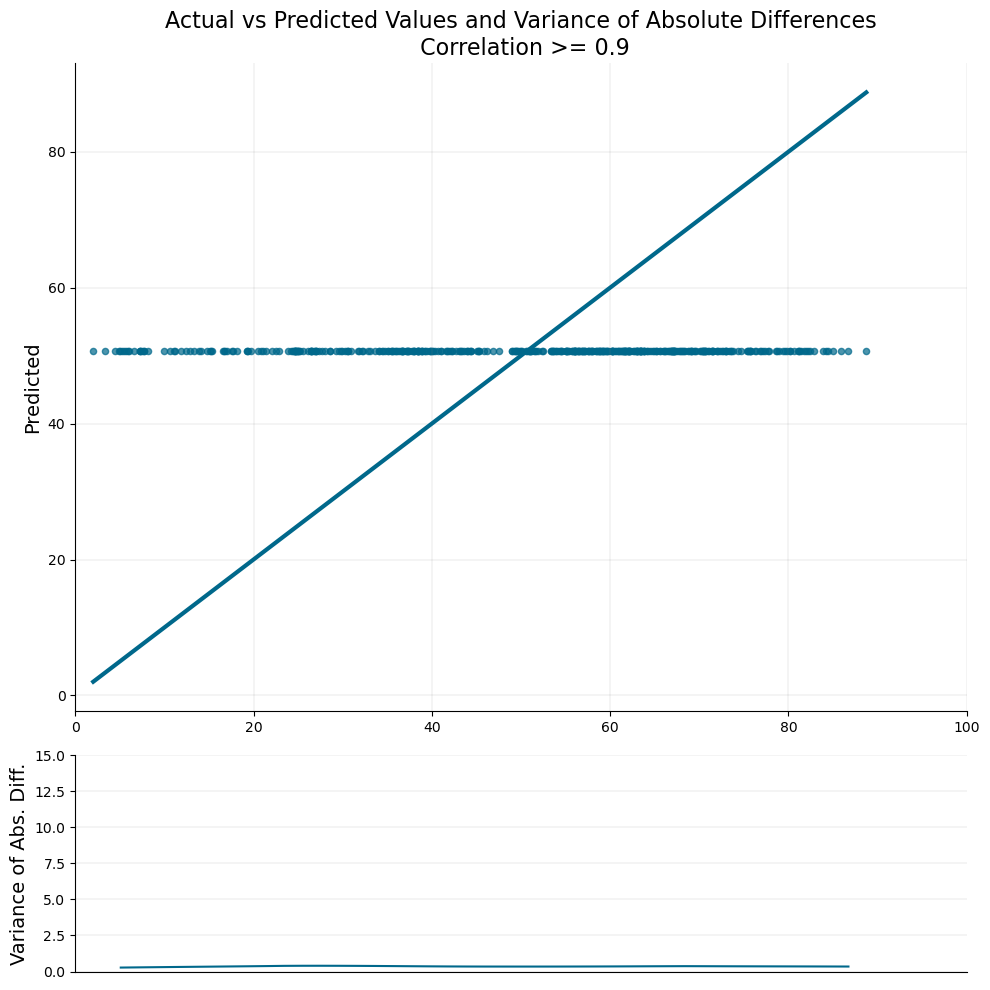

In [290]:
style.use('default')

def custom_cross_val_score(model, X, y, cv):
    kf = KFold(n_splits=cv, shuffle=True, random_state=0)
    scores = []
    
    for train_index, val_index in kf.split(X):
        x_train, x_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        model.fit(x_train, y_train, eval_set=[(x_val, y_val)], verbose=False)
        y_pred = model.predict(x_val)
        scores.append(r2_score(y_val, y_pred))
    
    return np.array(scores)

datasets = [(x5, y), (x6, y), (x7, y), (x8, y), (x9, y)]

r2_train_vals = []
r2_tests = []
rmse_train_vals = []
rmse_tests = []
mean_cv_scores = []

# Loop over the datasets
for i, (x, y) in enumerate(datasets, start=5):
    # Split the data into training+validation and testing sets
    x_train_val, x_test, y_train_val, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

    # Initialize the model with L1 regularization (alpha is the regularization parameter)
    model = XGBRegressor(objective='reg:squarederror', random_state=0, alpha=0.1, early_stopping_rounds=10)

    # After fitting the model
    # After fitting the model
    model.fit(x_train_val, y_train_val, eval_set=[(x_test, y_test)], verbose=False)

    # Get feature importances
    importances = model.feature_importances_

    # Sort features by importance
    indices = np.argsort(importances)[::-1]

    # Print the feature ranking
    print("Feature ranking:")

    for f in range(x.shape[1]):
        print(f"{f + 1}. feature {indices[f]} ({importances[indices[f]]})")

    # You can limit the number of features printed by replacing `x.shape[1]` with the desired number

    # Make predictions
    y_train_val_pred = model.predict(x_train_val)
    y_test_pred = model.predict(x_test)

    # Calculate R^2 scores and round to 5 decimal places
    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    # Calculate RMSE and round to 5 decimal places
    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    # Perform cross-validation and calculate mean score
    cv_scores = custom_cross_val_score(model, x_train_val, y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)
    
    r2_train_vals.append(r2_train_val)
    r2_tests.append(r2_test)
    rmse_train_vals.append(rmse_train_val)
    rmse_tests.append(rmse_test)
    mean_cv_scores.append(mean_cv_score)

    print(f"Model with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {r2_train_val}, RMSE: {rmse_train_val}")
    print(f"Testing R^2: {r2_test}, RMSE: {rmse_test}")
    print(f"Mean cross-validation score: {mean_cv_score}\n")

    # Create a scatter plot for the actual vs predicted values
    abs_diffs = np.abs(y_test - y_test_pred)

    # Create a DataFrame with the actual values and absolute differences
    df = pd.DataFrame({'Actual': y_test, 'AbsDifference': abs_diffs})

    # Define the bins for the actual values
    bins = np.linspace(0, 100, 50)

    # Calculate the mid-points of the bins
    bin_midpoints = bins[:-1] + np.diff(bins) / 2

    # Create a new column for the binned actual values
    df['ActualBin'] = pd.cut(df['Actual'], bins, labels=bin_midpoints)

    # Group by the binned actual values and calculate the variance of the absolute differences for each group
    var_abs_diffs = df.groupby('ActualBin')['AbsDifference'].var()

    # Create a scatter plot for the actual vs predicted values
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
    ax0 = plt.subplot(gs[0])
    ax0.scatter(y_test, y_test_pred, alpha=0.7, color='#00688B', s=20)
    ax0.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='#00688B', lw=3)
    ax0.set_xlim([0, 100])
    ax0.set_ylabel('Predicted', fontsize=14)
    ax0.set_title(f'Actual vs Predicted Values and Variance of Absolute Differences\n Correlation >= 0.{i}', fontsize=16)
    ax0.grid(True, color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

    # Hide the right and top spines
    ax0.spines['right'].set_visible(False)
    ax0.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax0.yaxis.set_ticks_position('left')
    ax0.xaxis.set_ticks_position('bottom')

    # Create a line plot for the binned actual values vs variance of the absolute differences
    ax1 = plt.subplot(gs[1])

    # Apply LOESS to smooth the variance curve
    smoothed = lowess(var_abs_diffs, var_abs_diffs.index, frac=0.5)
    index, data = zip(*smoothed)
    ax1.plot(index, data, color='#00688B')

    ax1.set_ylim([0, 15])
    ax1.set_xlim([0, 100])
    ax1.set_ylabel('Variance of Abs. Diff.', fontsize=14)
    ax1.set_xticks([])

    # Hide the right and top spines
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax1.yaxis.set_ticks_position('left')
    ax1.xaxis.set_ticks_position('bottom')

    ax1.grid(axis='y', color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

    plt.tight_layout()
    plt.show()
    

Feature ranking:
1. feature NY_GDP_PCAP_CD (0.3441309630870819)
2. feature NY_GDP_PCAP_KD (0.23138484358787537)
3. feature IQ_CPA_TRAN_XQ (0.11535115540027618)
4. feature SL_EMP_WORK_MA_ZS (0.01702813431620598)
5. feature IQ_CPA_PROP_XQ (0.013964777812361717)
6. feature SP_POP_5054_FE_5Y (0.013950027525424957)
7. feature SL_GDP_PCAP_EM_KD (0.011279524303972721)
8. feature FD_AST_PRVT_GD_ZS (0.010657941922545433)
9. feature SL_SRV_EMPL_ZS (0.01058618538081646)
10. feature NY_GNP_PCAP_KD (0.00918436236679554)
11. feature SH_XPD_OOPC_CH_ZS (0.008346294984221458)
12. feature SH_STA_STNT_ME_ZS (0.007700021378695965)
13. feature IT_NET_BBND_P2 (0.007487301714718342)
14. feature SH_STA_BASS_RU_ZS (0.00732423085719347)
15. feature FS_AST_PRVT_GD_ZS (0.006930687930434942)
16. feature SH_XPD_GHED_GD_ZS (0.005710081662982702)
17. feature SL_AGR_EMPL_FE_ZS (0.005422129761427641)
18. feature SL_EMP_VULN_FE_ZS (0.005320514086633921)
19. feature SH_XPD_OOPC_PC_CD (0.005264010746032)
20. feature IQ_CP

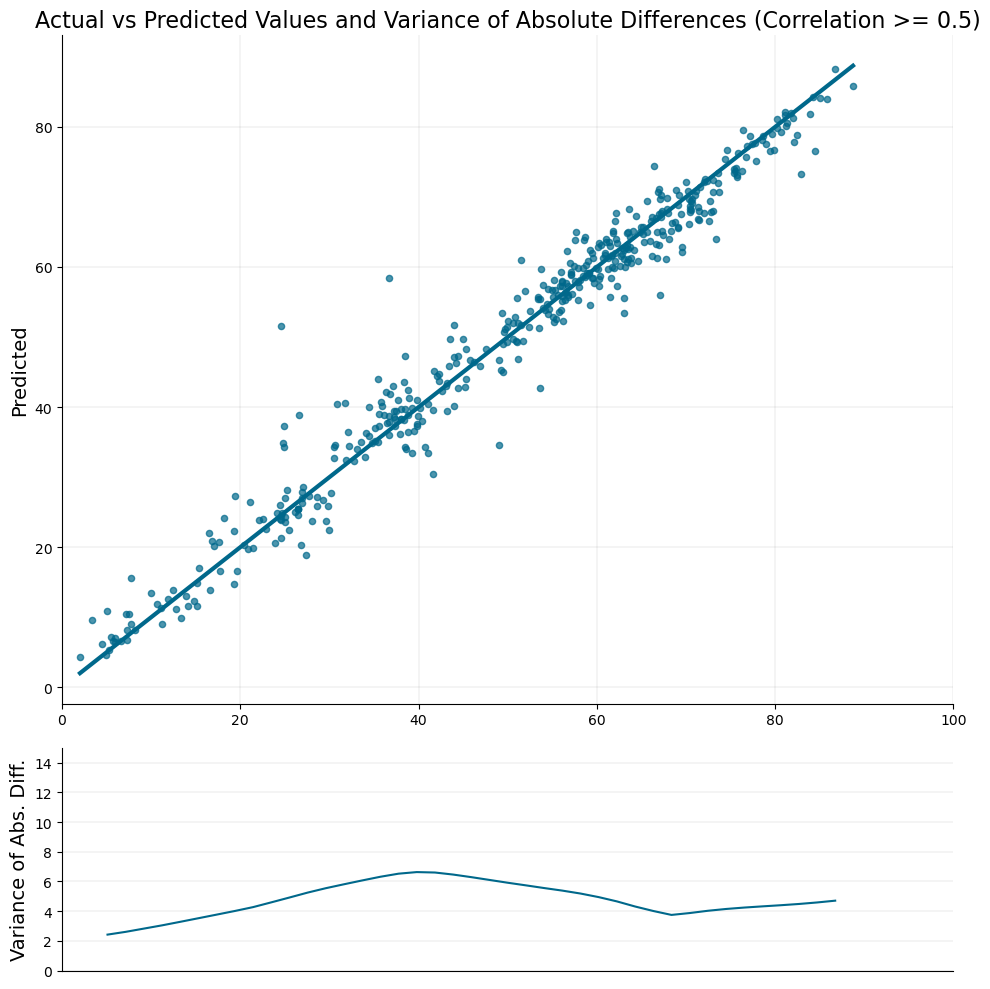

Feature ranking:
1. feature NY_GDP_PCAP_CD (0.31771016120910645)
2. feature NY_GDP_PCAP_KD (0.18727819621562958)
3. feature IQ_CPA_TRAN_XQ (0.1559630185365677)
4. feature SL_AGR_EMPL_ZS (0.026648659259080887)
5. feature IQ_CPA_PROP_XQ (0.025778453797101974)
6. feature SL_EMP_SELF_MA_ZS (0.021845590323209763)
7. feature NY_GNP_PCAP_CD (0.01952669583261013)
8. feature IT_NET_BBND_P2 (0.017185378819704056)
9. feature FB_CBK_BRWR_P3 (0.011316444724798203)
10. feature SL_GDP_PCAP_EM_KD (0.01081069465726614)
11. feature SP_DYN_LE00_IN (0.010012955404818058)
12. feature SL_UEM_NEET_FE_ZS (0.008948569186031818)
13. feature SH_XPD_GHED_GD_ZS (0.008236341178417206)
14. feature SL_SRV_EMPL_FE_ZS (0.007733013480901718)
15. feature SP_POP_80UP_FE_5Y (0.007290168199688196)
16. feature NE_CON_PRVT_PC_KD (0.006851824000477791)
17. feature SL_EMP_WORK_ZS (0.005982161499559879)
18. feature IC_BUS_DFRN_XQ (0.005447397939860821)
19. feature SP_POP_0004_MA_5Y (0.005414977204054594)
20. feature SH_H2O_SMDW_

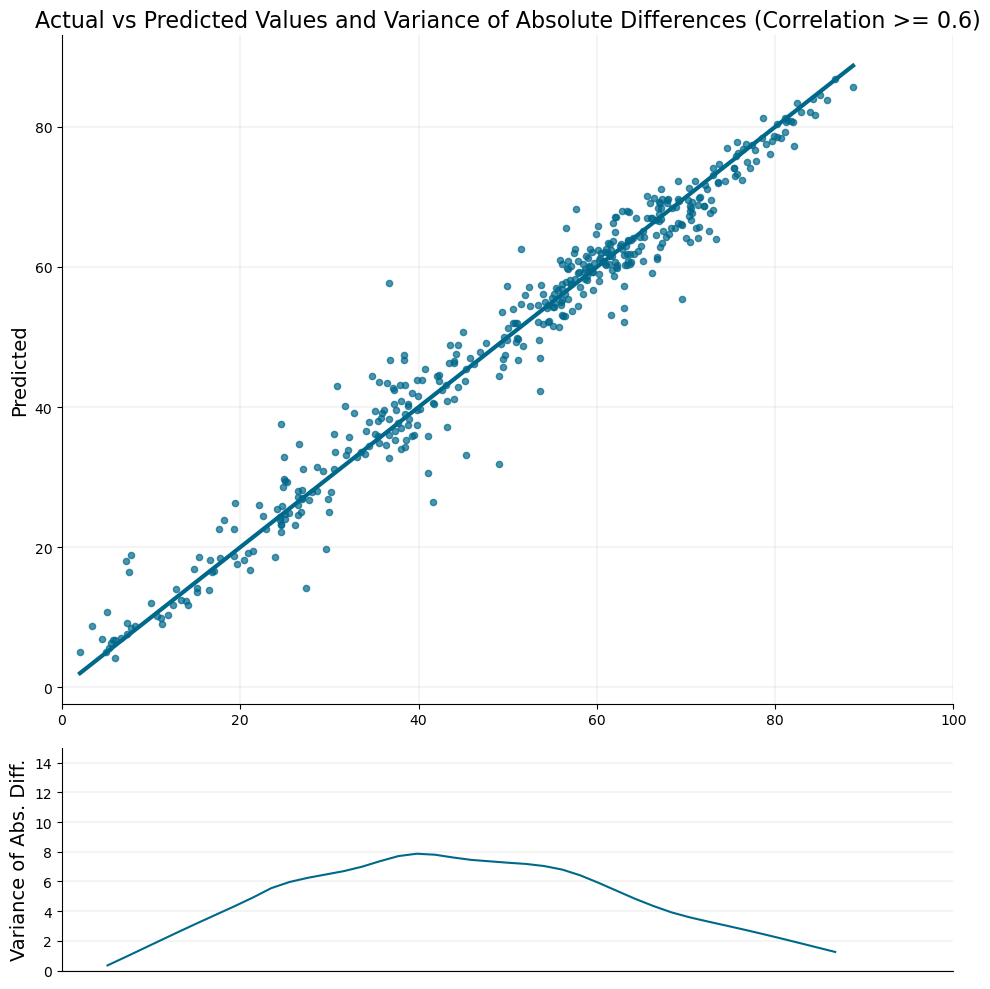

Feature ranking:
1. feature NY_GDP_PCAP_KD (0.3659200966358185)
2. feature IQ_CPA_TRAN_XQ (0.28489449620246887)
3. feature IQ_CPA_PROP_XQ (0.11513756960630417)
4. feature NY_GNP_PCAP_CD (0.02071014791727066)
5. feature PA_NUS_PPPC_RF (0.014015117660164833)
6. feature SH_XPD_GHED_PP_CD (0.013600725680589676)
7. feature NE_CON_PRVT_PC_KD (0.013204297982156277)
8. feature FS_AST_DOMO_GD_ZS (0.010585211217403412)
9. feature NY_GNP_PCAP_KD (0.009999927133321762)
10. feature IQ_CPA_PUBS_XQ (0.009939268231391907)
11. feature LP_LPI_CUST_XQ (0.009131794795393944)
12. feature IT_MLT_MAIN_P2 (0.008918261155486107)
13. feature SP_POP_SCIE_RD_P6 (0.008812271058559418)
14. feature NY_ADJ_NNTY_PC_CD (0.007948868907988071)
15. feature FX_OWN_TOTL_ZS (0.007729346863925457)
16. feature NY_GDP_PCAP_PP_KD (0.007671836297959089)
17. feature NY_ADJ_NNTY_PC_KD (0.007223219610750675)
18. feature LP_LPI_OVRL_XQ (0.006975828669965267)
19. feature NY_GNP_PCAP_PP_KD (0.006220669951289892)
20. feature NV_SRV_EMPL

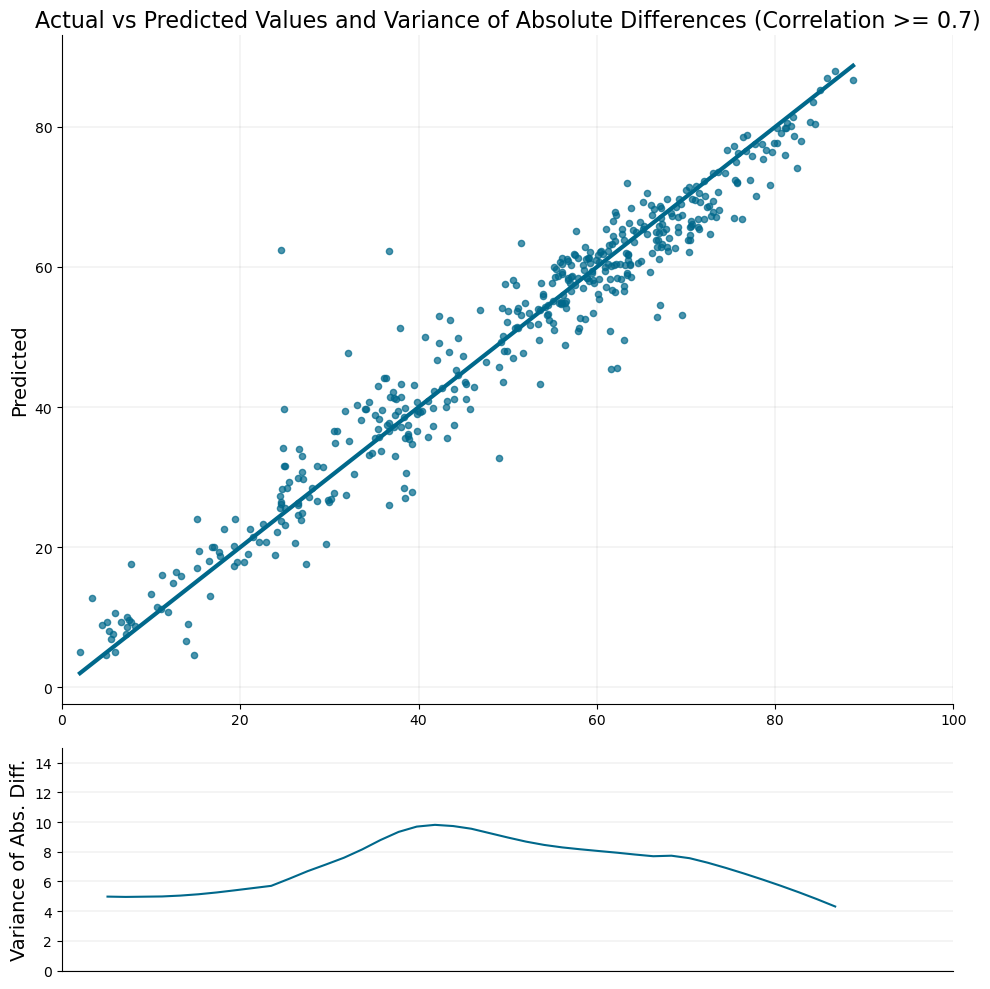

Feature ranking:
1. feature IQ_CPA_TRAN_XQ (0.4924904704093933)
2. feature NE_CON_PRVT_PC_KD (0.3603402078151703)
3. feature LP_LPI_CUST_XQ (0.05750051885843277)
4. feature NY_ADJ_NNTY_PC_KD (0.041945330798625946)
5. feature SI_SPR_PC40 (0.0327630490064621)
6. feature SI_SPR_PCAP (0.01222801674157381)
7. feature DT_NFL_UNWT_CD (0.002732437802478671)
Model with correlation >= 0.8:
Training+Validation R^2: 0.81193, RMSE: 8.64535
Testing R^2: 0.79896, RMSE: 9.04992
Mean cross-validation score: 0.75062



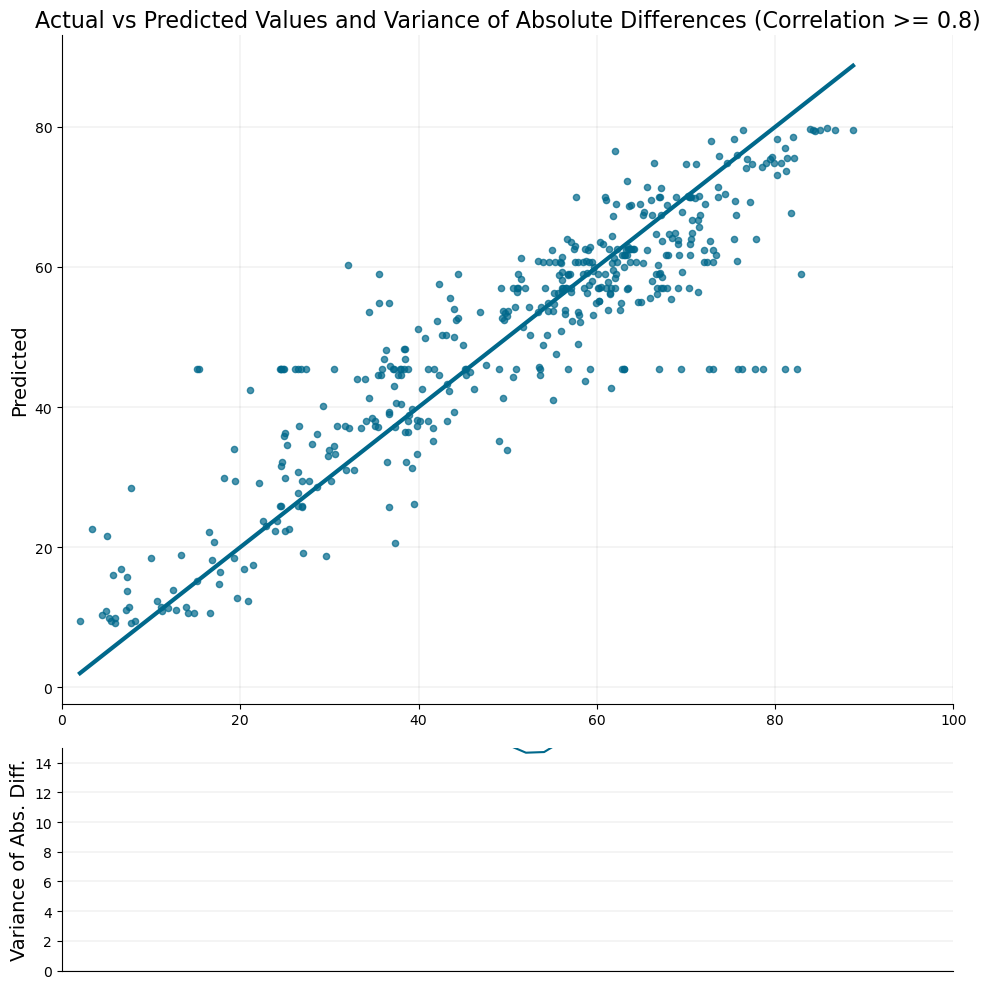

Feature ranking:
1. feature DT_NFL_UNWT_CD (1.0)
Model with correlation >= 0.9:
Training+Validation R^2: 0.00111, RMSE: 19.92421
Testing R^2: -0.00041, RMSE: 20.18809
Mean cross-validation score: -0.00175



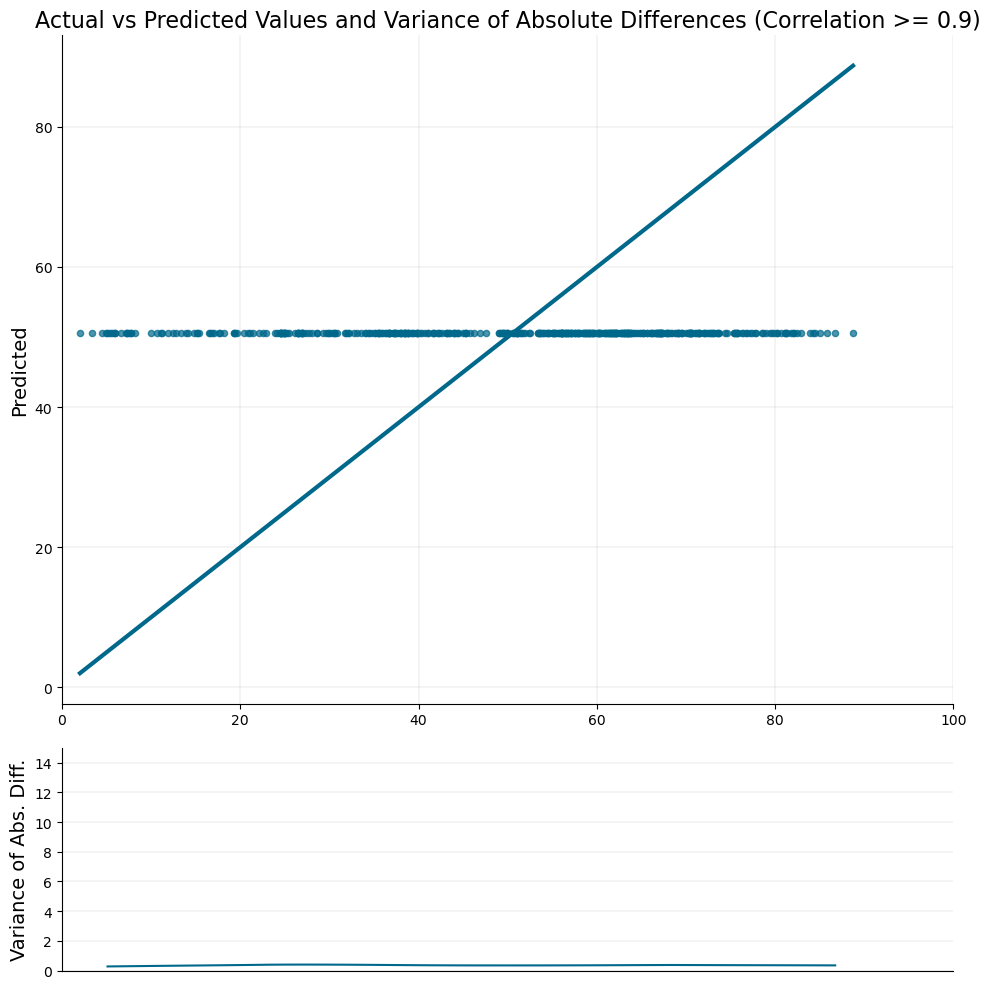

In [117]:
# Assuming you have lists of feature names for each dataset
feature_names_list = [vars_5, vars_6, vars_7, vars_8, vars_9]

# Loop over the datasets
for i, ((x, y), feature_names) in enumerate(zip(datasets, feature_names_list), start=5):
    # The rest of your code...
    # Split the data into training+validation and testing sets
    x_train_val, x_test, y_train_val, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

    # Initialize the model with L1 regularization (alpha is the regularization parameter)
    model = XGBRegressor(objective='reg:squarederror', random_state=0, alpha=0.1, early_stopping_rounds=10)

    # Fit the model
    model.fit(x_train_val, y_train_val, eval_set=[(x_test, y_test)], verbose=False)

    # Get feature importances
    importances = model.feature_importances_

    # Sort features by importance
    indices = np.argsort(importances)[::-1]

    # Print the feature ranking
    print("Feature ranking:")

    for f in range(x.shape[1]):
        print(f"{f + 1}. feature {feature_names[indices[f]]} ({importances[indices[f]]})")
        
    # You can limit the number of features printed by replacing `x.shape[1]` with the desired number

    # Make predictions
    y_train_val_pred = model.predict(x_train_val)
    y_test_pred = model.predict(x_test)

    # Calculate R^2 scores and round to 5 decimal places
    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    # Calculate RMSE and round to 5 decimal places
    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    # Perform cross-validation and calculate mean score
    cv_scores = custom_cross_val_score(model, x_train_val, y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)
    
    r2_train_vals.append(r2_train_val)
    r2_tests.append(r2_test)
    rmse_train_vals.append(rmse_train_val)
    rmse_tests.append(rmse_test)
    mean_cv_scores.append(mean_cv_score)

    print(f"Model with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {r2_train_val}, RMSE: {rmse_train_val}")
    print(f"Testing R^2: {r2_test}, RMSE: {rmse_test}")
    print(f"Mean cross-validation score: {mean_cv_score}\n")

    # Create a scatter plot for the actual vs predicted values
    abs_diffs = np.abs(y_test - y_test_pred)

    # Create a DataFrame with the actual values and absolute differences
    df = pd.DataFrame({'Actual': y_test, 'AbsDifference': abs_diffs})

    # Define the bins for the actual values
    bins = np.linspace(0, 100, 50)

    # Calculate the mid-points of the bins
    bin_midpoints = bins[:-1] + np.diff(bins) / 2

    # Create a new column for the binned actual values
    df['ActualBin'] = pd.cut(df['Actual'], bins, labels=bin_midpoints)

    # Group by the binned actual values and calculate the variance of the absolute differences for each group
    var_abs_diffs = df.groupby('ActualBin')['AbsDifference'].var()

    # Create a scatter plot for the actual vs predicted values
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
    ax0 = plt.subplot(gs[0])
    ax0.scatter(y_test, y_test_pred, alpha=0.7, color='#00688B', s=20)
    ax0.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='#00688B', lw=3)
    ax0.set_xlim([0, 100])
    ax0.set_ylabel('Predicted', fontsize=14)
    ax0.set_title(f'Actual vs Predicted Values and Variance of Absolute Differences (Correlation >= 0.{i})', fontsize=16)
    ax0.grid(True, color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

    # Hide the right and top spines
    ax0.spines['right'].set_visible(False)
    ax0.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax0.yaxis.set_ticks_position('left')
    ax0.xaxis.set_ticks_position('bottom')

    # Create a line plot for the binned actual values vs variance of the absolute differences
    ax1 = plt.subplot(gs[1])

    # Apply LOESS to smooth the variance curve
    smoothed = lowess(var_abs_diffs, var_abs_diffs.index, frac=0.5)
    index, data = zip(*smoothed)
    ax1.plot(index, data, color='#00688B')

    ax1.set_ylim([0, 15])
    ax1.set_xlim([0, 100])
    ax1.set_ylabel('Variance of Abs. Diff.', fontsize=14)
    ax1.set_xticks([])

    # Hide the right and top spines
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax1.yaxis.set_ticks_position('left')
    ax1.xaxis.set_ticks_position('bottom')

    ax1.grid(axis='y', color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

    plt.tight_layout()
    plt.show()

In [118]:
sns.set_theme()

def custom_cross_val_score(model, X, y, cv):
    kf = KFold(n_splits=cv, shuffle=True, random_state=0)
    scores = []
    
    for train_index, val_index in kf.split(X):
        x_train, x_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        model.fit(x_train, y_train, eval_set=[(x_val, y_val)], verbose=False)
        y_pred = model.predict(x_val)
        scores.append(r2_score(y_val, y_pred))
    
    return np.array(scores)

datasets = [(x5, y), (x6, y), (x7, y), (x8, y), (x9, y)]

feature_importances_dfs = {}

# Prepare a list of variable lists
vars_list = [vars_5, vars_6, vars_7, vars_8, vars_9]

r2_train_vals = []
r2_tests = []
rmse_train_vals = []
rmse_tests = []
mean_cv_scores = []

# Loop over the datasets
for i, (x, y) in enumerate(datasets, start=5):
    # Split the data into training+validation and testing sets
    x_train_val, x_test, y_train_val, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

    # Initialize the model with L1 regularization (alpha is the regularization parameter)
    model = XGBRegressor(objective='reg:squarederror', random_state=0, alpha=0.1, early_stopping_rounds=10)

    # Fit the model
    model.fit(x_train_val, y_train_val, eval_set=[(x_test, y_test)], verbose=False)

    # Create a DataFrame with the feature importances
    feature_importances = pd.DataFrame({
        'Feature': vars_list[i-5],
        'Importance': model.feature_importances_
    })

    # Sort the DataFrame by importance in descending order
    feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

    # Store the DataFrame in the dictionary
    feature_importances_dfs[f'feature_importances_{i}'] = feature_importances
    
    # Make predictions
    y_train_val_pred = model.predict(x_train_val)
    y_test_pred = model.predict(x_test)

    # Calculate R^2 scores and round to 5 decimal places
    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    # Calculate RMSE and round to 5 decimal places
    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    # Perform cross-validation and calculate mean score
    cv_scores = custom_cross_val_score(model, x_train_val, y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)
    
    r2_train_vals.append(r2_train_val)
    r2_tests.append(r2_test)
    rmse_train_vals.append(rmse_train_val)
    rmse_tests.append(rmse_test)
    mean_cv_scores.append(mean_cv_score)

    print(f"Model with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {r2_train_val}, RMSE: {rmse_train_val}")
    print(f"Testing R^2: {r2_test}, RMSE: {rmse_test}")
    print(f"Mean cross-validation score: {mean_cv_score}\n")
    
        # Print the sorted feature importances
    print(f"Feature importances for model with correlation >= 0.{i}:")
    print(feature_importances)
    print("\n")


Model with correlation >= 0.5:
Training+Validation R^2: 0.99968, RMSE: 0.35587
Testing R^2: 0.96505, RMSE: 3.77319
Mean cross-validation score: 0.95452

Feature importances for model with correlation >= 0.5:
                  Feature  Importance
199        NY_GDP_PCAP_CD    0.344131
210        NY_GDP_PCAP_KD    0.231385
252        IQ_CPA_TRAN_XQ    0.115351
186     SL_EMP_WORK_MA_ZS    0.017028
237        IQ_CPA_PROP_XQ    0.013965
..                    ...         ...
216        HD_HCI_OVRL_FE    0.000000
3          SE_LPV_PRIM_FE    0.000000
105  SE_TER_CUAT_DO_FE_ZS    0.000000
222        HD_HCI_OVRL_MA    0.000000
193     SL_EMP_WORK_FE_ZS    0.000000

[253 rows x 2 columns]


Model with correlation >= 0.6:
Training+Validation R^2: 0.99961, RMSE: 0.39421
Testing R^2: 0.96229, RMSE: 3.9194
Mean cross-validation score: 0.94662

Feature importances for model with correlation >= 0.6:
               Feature  Importance
74      NY_GDP_PCAP_CD    0.317710
85      NY_GDP_PCAP_KD    0.18727

In [119]:
# How to view each dataframe of the variable by its respective importance in predicting corruption
feature_importances_dfs['feature_importances_5']

,Feature,Importance
199,NY_GDP_PCAP_CD,0.344131
210,NY_GDP_PCAP_KD,0.231385
252,IQ_CPA_TRAN_XQ,0.115351
186,SL_EMP_WORK_MA_ZS,0.017028
237,IQ_CPA_PROP_XQ,0.013965
...,...,...
216,HD_HCI_OVRL_FE,0.000000
3,SE_LPV_PRIM_FE,0.000000
105,SE_TER_CUAT_DO_FE_ZS,0.000000
222,HD_HCI_OVRL_MA,0.000000


In [293]:
df = pd.read_csv('WDI_data.csv')
df = df.drop(columns=['CPI_EST'])
# Make corruption more intuitive with higher values indicating more corruption
df['CC_EST'] = (-1)*df['CC_EST']
df['CC_EST'] = (df['CC_EST'] + 2.5) * 20
# Drop years 1960-2011 if column 'year' is less than 2012
df_dr = df[df['year'] >= 2012]

In [294]:
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Calculate the correlation of each numeric feature with CC_EST
correlations = df[numeric_cols].corr()['CC_EST']

# Keep only features with a correlation greater than 0.5
vars_full = correlations[correlations.abs() > 0.5].index.tolist()

# Remove 'iso3c', 'iso3n', 'year', and 'CC_EST' from vars_full if they're included
vars_full = [var for var in vars_full if var not in ['iso3c', 'iso3n', 'year', 'CC_EST', 'country']]

# Get the unique country codes
countries = df['iso2c'].unique()

datasets = [(x5, y)]

feature_importances_dfs = {}

# Prepare a list of variable lists
vars_list = [vars_5]

# Create a new dataframe to store the results
df_new = pd.DataFrame()

r2_train_vals = []
r2_tests = []
rmse_train_vals = []
rmse_tests = []
mean_cv_scores = []

# feature_names_list = [x.columns.tolist() for x, y in datasets]

for i, ((x, y), feature_names) in enumerate(zip(datasets, vars_list), start=5):
    # Use vars_full as model_features
    model_features = [feature for feature in vars_full if feature not in ['iso2c', 'country', 'year', 'CC_EST']]

    x_train_val, x_test, y_train_val, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

    # Initialize the model with L1 regularization (alpha is the regularization parameter)
    model = XGBRegressor(objective='reg:squarederror', random_state=0, alpha=0.1, early_stopping_rounds=10)

    # Fit the model
    model.fit(x_train_val, y_train_val, eval_set=[(x_test, y_test)], verbose=False)

    # Create a DataFrame with the feature importances
    feature_importances = pd.DataFrame({
        'Feature': vars_list[i-5],
        'Importance': model.feature_importances_
    })
    
    # Backcast CC_EST to 1960 using the trained model
    for country in tqdm(countries):
        # Get the data for the current country and create a copy of it
        df_country = df[df['iso2c'] == country].copy()

        # Add a new feature for the previous year's CC_EST value
        df_country['CC_EST_prev'] = df_country.groupby('iso2c')['CC_EST'].shift()

        # Sort the data in descending order of the year
        df_country = df_country.sort_values('year', ascending=False)

        # Get the latest year in the data
        latest_year = df_country['year'].max()

        # Skip the current country if all its 'year' values are NaN
        if np.isnan(latest_year):
            continue

        latest_year = int(latest_year)

        # Iterate from the latest year to 1960
        for year in range(latest_year, 1959, -1):
            # Check if CC_EST for the current year is NaN
            if df_country.loc[df_country['year'] == year, 'CC_EST'].isna().any():
                # Prepare the features for prediction
                X = df_country[df_country['year'] == year][vars_5]

                X = X.ffill()

                if X.shape[1] != len(vars_5):
                    extra_features = set(X.columns) - set(vars_5)
                    X = X.drop(columns=extra_features)

                if X.shape[1] != len(vars_5):
                    raise ValueError(f"Expected {len(vars_5)} features, but got {X.shape[1]}")

                # Make predictions
                y_pred = model.predict(X)
                
                # Update the data with the predicted value
                df_country.loc[df_country['year'] == year, 'CC_EST'] = y_pred

        # Append the data for the current country to the new dataframe
        df_new = pd.concat([df_new, df_country])

100%|██████████| 218/218 [01:54<00:00,  1.90it/s]


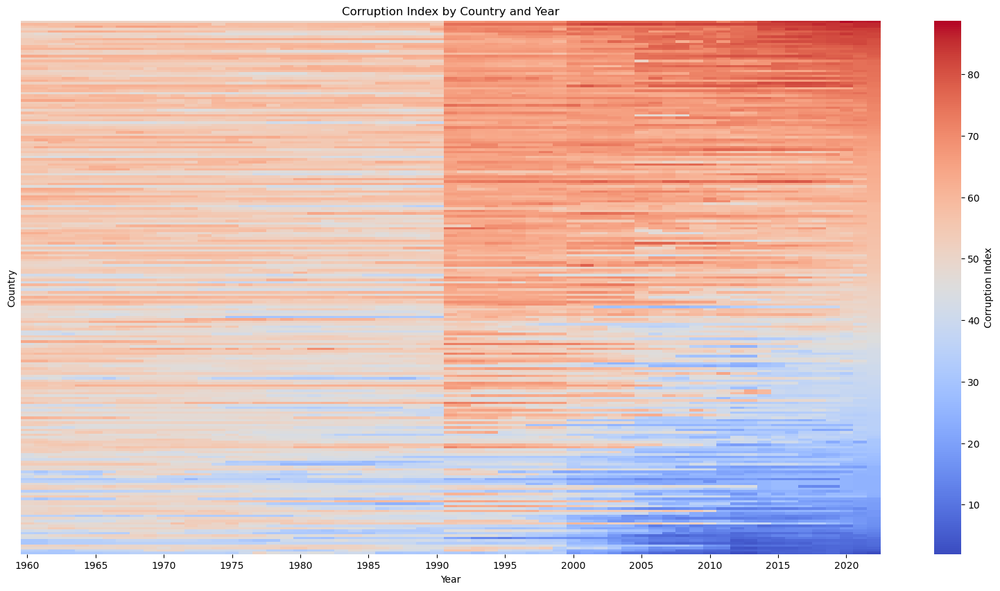

In [295]:
# Graphically illustrage the generale moves of country and corruption levels over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CC_EST')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, dont show country labels, and 1970 to 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Corruption Index'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

In [296]:
# Get the underlying Booster object
booster = model.get_booster()

# Print out a text representation of the first tree
print(booster.get_dump()[0])

0:[f199<13082.6641] yes=1,no=2,missing=1
	1:[f252<3] yes=3,no=4,missing=4
		3:[f252<2.5] yes=7,no=8,missing=8
			7:[f47<36.2999992] yes=15,no=16,missing=16
				15:leaf=4.05406904
				16:[f91<42.5731392] yes=31,no=32,missing=32
					31:leaf=2.18011427
					32:leaf=7.9719305
			8:[f64<22.2999992] yes=17,no=18,missing=18
				17:[f134<30.9685135] yes=33,no=34,missing=34
					33:leaf=3.40951085
					34:leaf=4.95852947
				18:[f144<50.3187828] yes=35,no=36,missing=36
					35:[f104<2.9083333] yes=55,no=56,missing=56
						55:leaf=7.29910564
						56:leaf=5.79929304
					36:leaf=3.32547164
		4:[f252<3.5] yes=9,no=10,missing=9
			9:[f59<9.5] yes=19,no=20,missing=19
				19:[f30<33.2929115] yes=37,no=38,missing=38
					37:[f20<31.4822636] yes=57,no=58,missing=58
						57:leaf=0.882194877
						58:leaf=3.30013037
					38:[f169<5.71043158] yes=59,no=60,missing=60
						59:leaf=0.319076538
						60:leaf=-5.30898809
				20:[f58<17.4914188] yes=39,no=40,missing=40
					39:[f15<39.0115776] yes=61,no=62

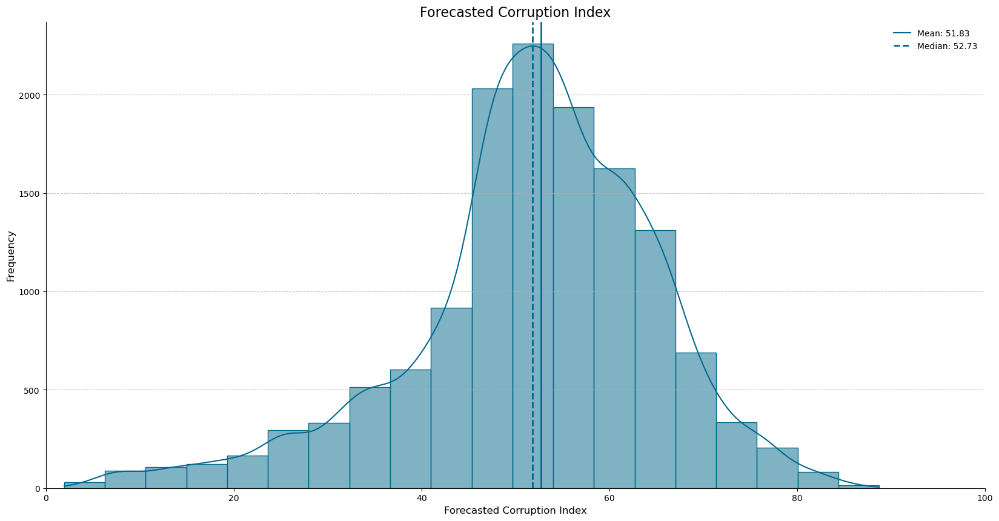

In [297]:
style.use('default')
# Plot the distribution of the aggregate forecasted corruption levels
# Calculate the mean and median of the forecasted corruption levels
mean_forecast = df_new.groupby('year')['CC_EST'].mean()
median_forecast = df_new.groupby('year')['CC_EST'].median()

# Plot the distribution of the forecasted corruption levels
plt.figure(figsize=(20, 10))

# Use seaborn's histplot function to plot the histogram
# Set the color, edgecolor and linewidth for the bars
sns.histplot(df_new['CC_EST'], bins=20, kde=True, color='#00688B', 
             edgecolor='#00688B', linewidth=1)

# Calculate the mean and median of the forecasted corruption levels
mean_est = df_new['CC_EST'].mean()
median_est = df_new['CC_EST'].median()

# Add a vertical line at the mean
plt.axvline(mean_est, color='#00688B', linestyle='--', linewidth=2)

# Add a vertical line at the median
plt.axvline(median_est, color='#00688B', linestyle='-', linewidth=2)

# Set the labels and title with larger fonts
plt.xlabel('Forecasted Corruption Index', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Forecasted Corruption Index', fontsize=16)
plt.xlim(0,100)

# Set the grid style
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend for mean and median
plt.legend([f'Mean: {mean_est:.2f}', f'Median: {median_est:.2f}'], frameon=False)

# Remove top and right spines
sns.despine()

# Show the plot
plt.show()


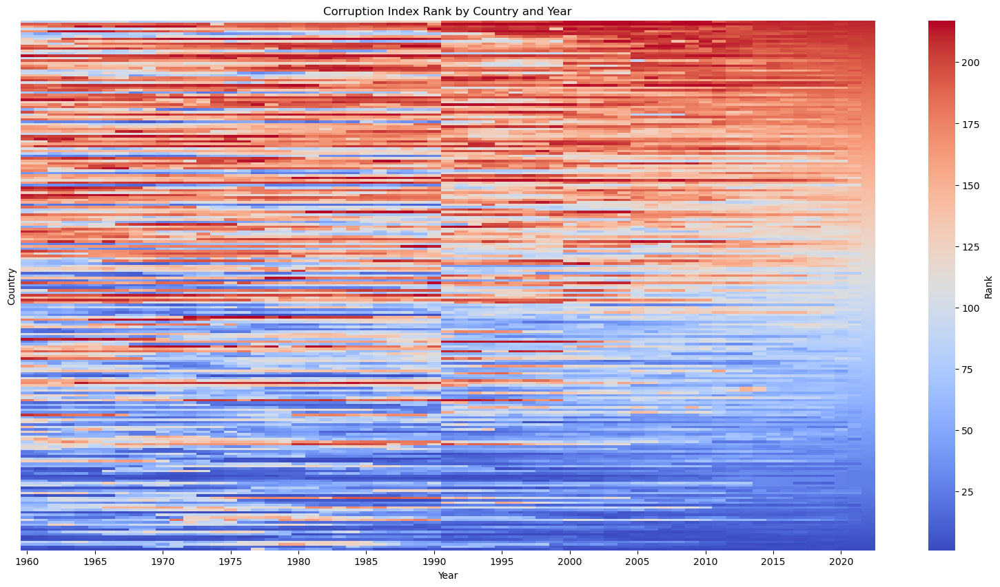

In [298]:
# Give a relative rank of CC_EST for each country in each year
df_new['CC_EST_rank'] = df_new.groupby('year')['CC_EST'].rank(pct=True)

# Give a rank of CC_EST for each country in each year as integers
df_new['CC_EST_rank_int'] = df_new.groupby('year')['CC_EST'].rank(method='dense', ascending=True)

# Plot changes in country ranks over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CC_EST_rank_int')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, don't show country labels, and 1970 to 2022, ranking from lowest to highest in 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Rank'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index Rank by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()


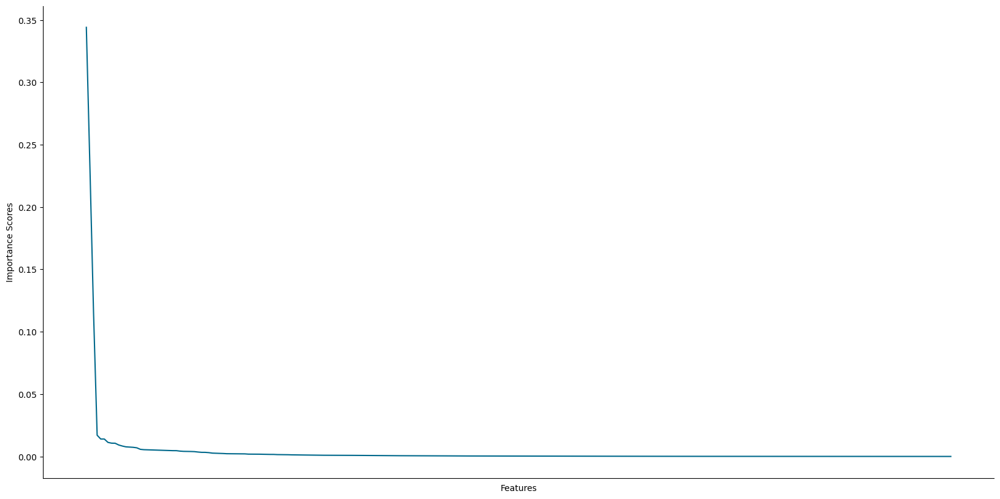

In [316]:
# Get feature importances from the trained model
importances = model.feature_importances_

# Get feature names from the data
feature_names = df_5.columns

# Create a DataFrame with feature names and their corresponding importance
feature_importances = pd.DataFrame({
    'Feature': feature_names[i-5],
    'Importance': importances
})

# Filter out features with zero importance
feature_importances = feature_importances[feature_importances['Importance'] > 0]

# Sort the DataFrame by 'Importance' in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Extract the sorted feature names and importance scores
features = feature_importances['Feature'].tolist()
importance_scores = feature_importances['Importance'].tolist()

# Create a 2D line plot
fig, ax = plt.subplots(figsize=(20, 10))

# Create a sequence of numbers for the x-axis
x = np.arange(len(features))

# Create the 2D line plot
ax.plot(x, importance_scores, color='#00688B')

# Set the ticks on the x-axis to be the new labels and remove the lines (ticks)
ax.set_xticks(x, minor=False)
ax.set_xticklabels([])  # Add feature names as x-axis labels
ax.tick_params(axis='x', which='both', length=0)

# Set labels
ax.set_xlabel('Features')
ax.set_ylabel('Importance Scores')

sns.despine()

# Show the plot
plt.show()

# Model 2

In [130]:
df = pd.read_csv('WDI_data.csv')
df = df.drop(columns=['CPI_EST'])
# Make corruption more intuitive with higher values indicating more corruption
df['CC_EST'] = (-1)*df['CC_EST']
df['CC_EST'] = (df['CC_EST'] + 2.5) * 20
# Drop years 170-2011 if column 'year' is less than 2012
df_dr = df[df['year'] >= 2012]
# Make years integers
df['year'] = df['year'].astype(int)

In [131]:
# Create a new dataframe with only iso2c, country, and CC_EST
df_corr = df_dr[['iso2c', 'country','year', 'CC_EST']]

# Filter the data for the years 2012 and 2022
df_filtered = df_corr[df_corr['year'].isin([2012, 2022])]

In [132]:
# Calculate the linear differences over time for each given country
change_by_country = df_filtered.pivot_table(index='iso2c', columns='year', values='CC_EST', aggfunc='first')

# Calculate the change for each country
change_by_country['avg_change'] = (change_by_country[2012] - change_by_country[2012]) / 10

# Calculate the mean and median CC_EST values across all years for each country
mean_cc_est_by_country = df_filtered.groupby('iso2c')['CC_EST'].mean()
median_cc_est_by_country = df_filtered.groupby('iso2c')['CC_EST'].median()

# Merge with the original DataFrame to get the country names
df_trend = pd.merge(change_by_country['avg_change'], mean_cc_est_by_country, left_index=True, right_index=True, how='left')
df_trend = pd.merge(df_trend, median_cc_est_by_country, left_index=True, right_index=True, how='left')

# Reset index and rename columns
df_trend.reset_index(inplace=True)
df_trend.rename(columns={'CC_EST_x': 'mean_CC_EST', 'CC_EST_y': 'median_CC_EST'}, inplace=True)

# Include country names
df_trend = pd.merge(df_trend, df_filtered[['iso2c', 'country']].drop_duplicates(), on='iso2c', how='left')

print(df_trend)


    iso2c  avg_change  mean_CC_EST  median_CC_EST               country
0      AD         0.0    24.692656      24.692656               Andorra
1      AE         0.0    26.889273      26.889273  United Arab Emirates
2      AF         0.0    76.141493      76.141493           Afghanistan
3      AG         0.0    34.288647      34.288647   Antigua and Barbuda
4      AL         0.0    61.866050      61.866050               Albania
..    ...         ...          ...            ...                   ...
199    XK         0.0    59.171521      59.171521                Kosovo
200    YE         0.0    79.383066      79.383066           Yemen, Rep.
201    ZA         0.0    55.039358      55.039358          South Africa
202    ZM         0.0    58.206411      58.206411                Zambia
203    ZW         0.0    76.369429      76.369429              Zimbabwe

[204 rows x 5 columns]


In [133]:
# Max and min values
# Find the index of the maximum and minimum mean_CC_EST values
most_corrupt_idx = df_trend['mean_CC_EST'].idxmax()
least_corrupt_idx = df_trend['mean_CC_EST'].idxmin()

most_corrupt_country = df_trend.loc[most_corrupt_idx, 'country']
least_corrupt_country = df_trend.loc[least_corrupt_idx, 'country']

print("The most corrupt country (on average between 2012 and 2022) is", most_corrupt_country)
print("The least corrupt country (on average between 2012 and 2022) is", least_corrupt_country)
print("The country that became more corrupt (rose the most) on average between 2012 and 2022 is", df_trend.loc[df_trend['avg_change'].idxmax(), 'country'])
print("The country that became less corrupt (fell the most) on average between 2012 and 2022 is", df_trend.loc[df_trend['avg_change'].idxmin(), 'country'])

The most corrupt country (on average between 2012 and 2022) is Somalia
The least corrupt country (on average between 2012 and 2022) is Denmark
The country that became more corrupt (rose the most) on average between 2012 and 2022 is Andorra
The country that became less corrupt (fell the most) on average between 2012 and 2022 is Andorra


In [134]:
df_correl = pd.read_csv('correlations.csv')
# Rank in order of correlation with CC_EST
df_correl = df_correl.sort_values('correlation', ascending=False)
df_correl

,variable,correlation
942,DT_NFL_UNWT_CD,0.907982
557,SE_LPV_PRIM,0.714894
810,SE_LPV_PRIM_MA,0.714519
727,SE_LPV_PRIM_FE,0.714091
96,SE_LPV_PRIM_LD,0.703578
...,...,...
1091,LP_LPI_CUST_XQ,-0.812534
537,NY_ADJ_NNTY_PC_KD,-0.813347
460,SI_SPR_PCAP,-0.841848
463,SI_SPR_PC40,-0.846424


In [135]:
# Remove rows in df_dr that have missing values in CC_EST column
#df_dr = df[df['year'] >= 2012]
df_dr = df_dr.dropna(subset=['CC_EST'])

df_correl_0 = df_correl[abs(df_correl['correlation']) >= 0.0]
# Filter to only show correlations greater than or equal to +- 0.5
df_correl_5 = df_correl[abs(df_correl['correlation']) >= 0.5]
# Filter to only show correlations greater than or equal to +- 0.6
df_correl_6 = df_correl[abs(df_correl['correlation']) >= 0.6]
# Filter to only show correlations greater than or equal to +- 0.7
df_correl_7 = df_correl[abs(df_correl['correlation']) >= 0.7]
# Filter to only show correlations greater than or equal to +- 0.8
df_correl_8 = df_correl[abs(df_correl['correlation']) >= 0.8]
# Filter to only show correlations greater than or equal to +- 0.9
df_correl_9 = df_correl[abs(df_correl['correlation']) >= 0.9]

print(f"The number of correlations with an absolute value greater than or equal to 0.5 is", len(df_correl_5))
print(f"The number of correlations with an absolute value greater than or equal to 0.6 is", len(df_correl_6))
print(f"The number of correlations with an absolute value greater than or equal to 0.7 is", len(df_correl_7))
print(f"The number of correlations with an absolute value greater than or equal to 0.8 is", len(df_correl_8))
print(f"The number of correlations with an absolute value greater than or equal to 0.9 is", len(df_correl_9))

The number of correlations with an absolute value greater than or equal to 0.5 is 253
The number of correlations with an absolute value greater than or equal to 0.6 is 128
The number of correlations with an absolute value greater than or equal to 0.7 is 54
The number of correlations with an absolute value greater than or equal to 0.8 is 7
The number of correlations with an absolute value greater than or equal to 0.9 is 1


In [136]:
# Merge together corruption values and the largest correlators
# Create variables that are a list of the variables that are highly correlated with CC_EST
vars_0 = list(df_correl_0['variable'])
vars_5 = list(df_correl_5['variable'])
vars_6 = list(df_correl_6['variable'])
vars_7 = list(df_correl_7['variable'])
vars_8 = list(df_correl_8['variable'])
vars_9 = list(df_correl_9['variable'])

# Merge the corruption values with the variables that are highly correlated with CC_EST
df_0 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_0]
df_5 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_5]
df_6 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_6]
df_7 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_7]
df_8 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_8]
df_9 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_9]
# Build random forest model to predict corruption from highly correlated variables
# Simplify notation:
x0 = df_0.iloc[:,2:].values
x5 = df_5.iloc[:,2:].values
x6 = df_6.iloc[:,2:].values
x7 = df_7.iloc[:,2:].values
x8 = df_8.iloc[:,2:].values
x9 = df_9.iloc[:,2:].values

y = df_dr['CC_EST'].values

In [137]:
'''
def backcast_cc_est_iteratively(df, df_filtered, target_col='CC_EST', max_lead_years=2):
    """Backcasts a target column for each country and year, 
    using a model trained on a fixed recent time period.
    """

    predictions = []  

    # Training Phase
    train_start_year = 2022
    train_end_year = 2015
    training_data = df_filtered[(df_filtered['year'] <= train_start_year) & (df_filtered['year'] >= train_end_year)]

    # Select Features (Customize!)
    features = [col for col in training_data.columns 
                if col not in [target_col, 'iso2c', 'country', 'year']] 

    # Handle Missing Values in 'CC_EST'
    training_data = training_data.dropna(subset=['CC_EST'])  

    X_train = training_data[features]
    y_train = training_data['CC_EST']

    # Check if training data is not empty
    if not X_train.empty and not y_train.empty:
        model = XGBRegressor(objective='reg:squarederror', random_state=0, alpha=0.1, early_stopping_rounds=None) 
        model.fit(X_train, y_train) 

        # Evaluation
        train_r2 = model.score(X_train, y_train)
        cv_scores = cross_val_score(model, X_train, y_train, cv=5)  # Example 5-fold CV

        print(f"Train R^2: {train_r2},  CV Scores: {cv_scores}")

        # Create a DataFrame with the feature importances
        feature_importances = pd.DataFrame({'feature': features, 'importance': model.feature_importances_})

        # Sort the DataFrame by importance in descending order
        feature_importances = feature_importances.sort_values(by='importance', ascending=False)

        print(feature_importances)
    
        # Backcasting Phase
        for country in df_filtered['iso2c'].unique():  # Iterate over unique countries
            country_data = df_filtered[df_filtered['iso2c'] == country]
            for backcast_year in range(2011, 1959, -1):  
                data_for_backcast = country_data[country_data['year'] <= backcast_year]

                # Feature Selection (Important: Align with the training set's features)
                X_backcast = data_for_backcast[features] 

                # Only predict for rows where all feature values are present
                X_backcast = X_backcast.dropna(subset=features) 

                if not X_backcast.empty:  # Check if there's any data after handling missing values
                    y_pred = model.predict(X_backcast)

                    predictions.append({
                        'iso2c': country,
                        'year': backcast_year,
                        'predicted_CC_EST': y_pred[0]  
                    })
                else:
                    print(f"Skipping year {backcast_year} for {country} due to insufficient data after handling missing values")
    else:
        print("Insufficient training data")

    return pd.DataFrame(predictions)

# Example Usage (assuming your DataFrame is already  'df_dr')
df_filtered = df[df['year'] >= 2012]  # Filter for the iterative process
predictions_df = backcast_cc_est_iteratively(df.copy(), df_filtered.copy())  
print(predictions_df)
'''

'\ndef backcast_cc_est_iteratively(df, df_filtered, target_col=\'CC_EST\', max_lead_years=2):\n    """Backcasts a target column for each country and year, \n    using a model trained on a fixed recent time period.\n    """\n\n    predictions = []  \n\n    # Training Phase\n    train_start_year = 2022\n    train_end_year = 2015\n    training_data = df_filtered[(df_filtered[\'year\'] <= train_start_year) & (df_filtered[\'year\'] >= train_end_year)]\n\n    # Select Features (Customize!)\n    features = [col for col in training_data.columns \n                if col not in [target_col, \'iso2c\', \'country\', \'year\']] \n\n    # Handle Missing Values in \'CC_EST\'\n    training_data = training_data.dropna(subset=[\'CC_EST\'])  \n\n    X_train = training_data[features]\n    y_train = training_data[\'CC_EST\']\n\n    # Check if training data is not empty\n    if not X_train.empty and not y_train.empty:\n        model = XGBRegressor(objective=\'reg:squarederror\', random_state=0, alpha=0.1, e

In [138]:
def backcast_cc_est_iteratively(df, target_col='CC_EST', max_lead_years=2): 
  """Backcasts a target column for each country and year, 
  using an ARIMA model trained on a fixed recent time period."""

  predictions = []
  for country in df['iso2c'].unique():
    country_data = df[df['iso2c'] == country].sort_values(by='year')

    # Training Phase
    train_start_year = 2022
    train_end_year = 2015
    training_data = country_data[(country_data['year'] >= train_start_year) & (country_data['year'] <= train_end_year)]
    y_train = training_data[target_col]  # Assuming 'CC_EST' is the target

    # ARIMA Model
    model = ARIMA(y_train, order=(2, 1, 1))  # Adjust the order as needed
    model_fit = model.fit()

    # Backcasting Phase
    for backcast_year in range(2011, 1959, -1):
      # Use past values and the fitted model to predict for 'backcast_year'
      new_obs = model_fit.forecast() 
      y_pred = new_obs[0]

      predictions.append({
          'iso2c': country,
          'year': backcast_year,
          'predicted_CC_EST': y_pred
      }) 

  return pd.DataFrame(predictions)

In [139]:
'''
import pandas as pd
from prophet import Prophet  

def backcast_cc_est_iteratively(df, target_col='CC_EST', max_lead_years=2): 
  # ... (Same initial part as above) ...

    # Prophet Model
    country_data.rename(columns={ target_col: 'y', 'year': 'ds' }, inplace=True)
    model = Prophet()
    model.fit(country_data)

    # Backcasting Phase
    for backcast_year in range(2011, 1959, -1):
      future_df = model.make_future_dataframe(periods=1, freq='Y') # 1 year prediction
      future_df['ds'] = backcast_year  
      forecast = model.predict(future_df)
      y_pred = forecast['yhat'].iloc[0]

      predictions.append({
          'iso2c': country,
          'year': backcast_year,
          'predicted_CC_EST': y_pred
      }) 
    return pd.DataFrame(predictions)
    
'''

"\nimport pandas as pd\nfrom prophet import Prophet  \n\ndef backcast_cc_est_iteratively(df, target_col='CC_EST', max_lead_years=2): \n  # ... (Same initial part as above) ...\n\n    # Prophet Model\n    country_data.rename(columns={ target_col: 'y', 'year': 'ds' }, inplace=True)\n    model = Prophet()\n    model.fit(country_data)\n\n    # Backcasting Phase\n    for backcast_year in range(2011, 1959, -1):\n      future_df = model.make_future_dataframe(periods=1, freq='Y') # 1 year prediction\n      future_df['ds'] = backcast_year  \n      forecast = model.predict(future_df)\n      y_pred = forecast['yhat'].iloc[0]\n\n      predictions.append({\n          'iso2c': country,\n          'year': backcast_year,\n          'predicted_CC_EST': y_pred\n      }) \n    return pd.DataFrame(predictions)\n    \n"

In [140]:
def prepare_lead_data(df, target_col, lead_cols, time_col, country_col):
    """Shifts features to create lead versions for backcasting, 
       accounting for country and year structure.
    """
    df_lead = df.copy()

    for col in lead_cols:
        df_lead[f'{col}_lead1'] = df_lead.sort_values([time_col]).groupby(country_col)[col].shift(-1)  # Shift down by 1

    df_lead.fillna(0, inplace=True)
    return df_lead

def prepare_data_for_backcast(df, target_col, lead_cols, time_col, country_col):
    """Shifts target feature to the next year for backcasting, 
       accounting for country and year structure.
    """
    df_lead = df.copy()

    # Assuming target variable is 'CC_EST'
    df_lead['CC_EST_lead1'] = df_lead.sort_values([time_col]).groupby(country_col)[target_col].shift(-1)  # Shift target down by 1 (next year)

    df_lead.fillna(0, inplace=True)  # Handle missing values (e.g., at the end of histories)
    return df_lead

def remove_correlated_features(df, threshold):
    """Removes highly correlated features based on a threshold."""
    corr_matrix = df.dropna().corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    cols_to_drop = [col for col in upper.columns if any(upper[col] > threshold)]
    df = df.drop(cols_to_drop, axis=1)
    return df

def custom_cross_val_score(model, X, y, cv):
    """Calculates cross-validation scores for a given model."""
    scores = []
    kf = KFold(n_splits=cv)
    
    for train_index, val_index in kf.split(X):
        x_train, x_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        model.fit(x_train, y_train, eval_set=[(x_val, y_val)], verbose=False)

        y_val_pred = model.predict(x_val)
        r2_val = round(r2_score(y_val, y_val_pred), 5)
        scores.append(r2_val)
    
    return scores

In [141]:
def build_and_evaluate_model(df, target_col_name, var_list, n_leads=2):
    """
    Builds, evaluates and returns results for an XGBoost model.
    Incorporates lead variables of the target column.
    """

    # Create a copy of the DataFrame to avoid modifying the original
    df = df.copy()

    # Create lead variables
    for i in range(1, n_leads + 1):
        lead_col = df.groupby(['country'])[[str(target_col_name)]].shift(-i)
        df[f"{target_col_name}_lead{i}"] = lead_col[str(target_col_name)]

    # Drop rows with NaN values in the target column and lead variables
    df = df.dropna(subset=['country'] + [target_col_name] + [f"{target_col_name}_lead{i}" for i in range(1, n_leads + 1)])

    # No need to add lead variables to var_list, they're already created
    X = df[['country'] + var_list + [f"{target_col_name}_lead{i}" for i in range(1, n_leads + 1)]]

    x_train_val, x_test, y_train_val, y_test = train_test_split(X, df[target_col_name], test_size=0.2, random_state=0)

    # Exclude 'country' column when removing correlated features
    x_lead = remove_correlated_features(x_train_val.drop(columns='country').copy(), threshold=0.8)

    model = XGBRegressor(objective='reg:squarederror', random_state=0, alpha=0.1, early_stopping_rounds=10)

    model.fit(x_lead, y_train_val, eval_set=[(x_test.drop(columns='country'), y_test)], verbose=False)

    y_train_val_pred = model.predict(x_train_val.drop(columns='country'))
    y_test_pred = model.predict(x_test.drop(columns='country'))
    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    cv_scores = custom_cross_val_score(model, x_train_val.drop(columns='country'), y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)

    feature_importances = pd.DataFrame({
        'Feature': x_lead.columns.tolist(),
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    # Update the lead variables with the predicted values
    df.loc[x_train_val.index, f"{target_col_name}_lead1"] = y_train_val_pred
    df.loc[x_test.index, f"{target_col_name}_lead1"] = y_test_pred

    if n_leads > 1:
        df[f"{target_col_name}_lead2"] = df.groupby(['country'])[[f"{target_col_name}_lead1"]].shift(-1)
        df[f"{target_col_name}_lead2"] = df[f"{target_col_name}_lead2"].fillna(method='ffill')

    return r2_train_val, r2_test, rmse_train_val, rmse_test, mean_cv_score, feature_importances, df, model

In [142]:
# **********************************************
#  Data Preparation (Replace with your data loading and filtering)
# **********************************************

# Create DataFrames containing highly correlated variables 
df_0  = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_0].copy()
df_5 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_5].copy()
df_6 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_6].copy()
df_7 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_7].copy()
df_8 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_8].copy()
df_9 = df_dr[['iso2c', 'country', 'year', 'CC_EST'] + vars_9].copy()

y = df_dr['CC_EST'].values 

# Datasets creation
datasets = [df_5, df_6, df_7, df_8]  
vars_list = [vars_5, vars_6, vars_7, vars_8] 

# **********************************************
#  Main Execution
# **********************************************

r2_train_vals = []
r2_tests = []
rmse_train_vals = []
rmse_tests = []
mean_cv_scores = []
feature_importances_dfs = {}

for i, (df, var_list) in enumerate(zip(datasets, vars_list), start=5):
    print(f"Iteration {i}")
    results = build_and_evaluate_model(df, 'CC_EST', var_list)

    r2_train_vals.append(results[0])
    r2_tests.append(results[1])
    rmse_train_vals.append(results[2])
    rmse_tests.append(results[3])
    mean_cv_scores.append(results[4])
    feature_importances_dfs[f'feature_importances_{i}'] = results[5]
    df_new = results[6]

    print(f"Model with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {r2_train_vals[-1]}, RMSE: {rmse_train_vals[-1]}")
    print(f"Testing R^2: {r2_tests[-1]}, RMSE: {rmse_tests[-1]}")
    print(f"Mean cross-validation score: {mean_cv_scores[-1]}\n")
    print(feature_importances_dfs[f'feature_importances_{i}'])
    print("\n")


Iteration 5


Model with correlation >= 0.5:
Training+Validation R^2: 0.99788, RMSE: 0.92129
Testing R^2: 0.983, RMSE: 2.59014
Mean cross-validation score: 0.98171

                  Feature  Importance
253          CC_EST_lead1    0.746632
254          CC_EST_lead2    0.021110
62         SH_DYN_MORT_MA    0.009215
133     SP_DYN_TO65_FE_ZS    0.008897
117     SP_POP_7074_FE_5Y    0.006084
..                    ...         ...
46         SP_DYN_IMRT_IN    0.000000
131  SE_TER_CUAT_BA_FE_ZS    0.000000
49      SH_STA_AIRP_MA_P5    0.000000
51      SP_DYN_IMRT_FE_IN    0.000000
194        SL_EMP_WORK_ZS    0.000000

[255 rows x 2 columns]


Iteration 6
Model with correlation >= 0.6:
Training+Validation R^2: 0.99708, RMSE: 1.08032
Testing R^2: 0.98416, RMSE: 2.50043
Mean cross-validation score: 0.98098

               Feature  Importance
128       CC_EST_lead1    0.833415
129       CC_EST_lead2    0.015279
52   SP_DYN_LE00_FE_IN    0.005336
46   SP_DYN_TO65_MA_ZS    0.005084
82   NY_GDP_PCAP_PP_KD    0

In [143]:
pd.set_option('display.max_rows', 100)

# Now print the DataFrames
print('\n Feature Importances for Correlation >= 0.5')
print(feature_importances_dfs['feature_importances_5'])
print('\n Feature Importances for Correlation >= 0.6')
print(feature_importances_dfs['feature_importances_6'])
print('\n Feature Importances for Correlation >= 0.7')
print(feature_importances_dfs['feature_importances_7'])


 Feature Importances for Correlation >= 0.5
                  Feature  Importance
253          CC_EST_lead1    0.746632
254          CC_EST_lead2    0.021110
62         SH_DYN_MORT_MA    0.009215
133     SP_DYN_TO65_FE_ZS    0.008897
117     SP_POP_7074_FE_5Y    0.006084
..                    ...         ...
46         SP_DYN_IMRT_IN    0.000000
131  SE_TER_CUAT_BA_FE_ZS    0.000000
49      SH_STA_AIRP_MA_P5    0.000000
51      SP_DYN_IMRT_FE_IN    0.000000
194        SL_EMP_WORK_ZS    0.000000

[255 rows x 2 columns]

 Feature Importances for Correlation >= 0.6
               Feature  Importance
128       CC_EST_lead1    0.833415
129       CC_EST_lead2    0.015279
52   SP_DYN_LE00_FE_IN    0.005336
46   SP_DYN_TO65_MA_ZS    0.005084
82   NY_GDP_PCAP_PP_KD    0.003807
..                 ...         ...
111  FX_OWN_TOTL_40_ZS    0.000000
85      NY_GDP_PCAP_KD    0.000000
103  FX_OWN_TOTL_OL_ZS    0.000000
97      HD_HCI_OVRL_MA    0.000000
0       DT_NFL_UNWT_CD    0.000000

[130 rows

In [144]:
r2_train_vals = []
r2_tests = []
rmse_train_vals = []
rmse_tests = []
mean_cv_scores = []
feature_importances_dfs = {}

# Remove duplicate columns in df_0
df_0 = df_0.loc[:,~df_0.columns.duplicated()]

results = build_and_evaluate_model(df_0, 'CC_EST', vars_0)

r2_train_vals.append(results[0])
r2_tests.append(results[1])
rmse_train_vals.append(results[2])
rmse_tests.append(results[3])
mean_cv_scores.append(results[4])
feature_importances_dfs['feature_importances'] = results[5]
df_new = results[6]

print(f"Full Model:")
print(f"Training+Validation R^2: {r2_train_vals[-1]}, RMSE: {rmse_train_vals[-1]}")
print(f"Testing R^2: {r2_tests[-1]}, RMSE: {rmse_tests[-1]}")
print(f"Mean cross-validation score: {mean_cv_scores[-1]}\n")
print(feature_importances_dfs['feature_importances'])
print("\n")

Full Model:
Training+Validation R^2: 0.99926, RMSE: 0.54537
Testing R^2: 0.98441, RMSE: 2.4806
Mean cross-validation score: 0.98112

                        Feature  Importance
1449               CC_EST_lead1    0.592026
1450               CC_EST_lead2    0.027190
318              SE_PRM_UNER_MA    0.017460
484              GC_REV_XGRT_CN    0.012413
244                 IC_ELC_TIME    0.011027
...                         ...         ...
786        per_allsp_ben_q1_tot    0.000000
787   SL_TLF_ACTI_1524_MA_NE_ZS    0.000000
788              NY_ADJ_NNAT_CD    0.000000
789           ST_INT_XPND_MP_ZS    0.000000
0                DT_NFL_UNWT_CD    0.000000

[1451 rows x 2 columns]




In [145]:
"""
# Replace 'vars_full' with your actual list of variables, excluding 'iso2c', 'country', and 'CC_EST'
vars_full = list(vars_0)


print("Running model on full dataset")
for i in range(0, 9):
    # Calculate the correlation of each variable with 'CC_EST'
    correl = df_0[vars_full].corrwith(df['CC_EST']).abs()

    # Get the variables with a correlation greater than or equal to the threshold
    vars_correl = correl[correl >= 0.1 * i].index.tolist()

    results = build_and_evaluate_model(df_0, 'CC_EST', vars_correl, n_leads=2)
    
    print(f"\n Model with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
    print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
    print(f"Mean cross-validation score: {results[4]}\n")
    print(results[5])  # Feature importances
    print('\n')
    print(results[6][['country', 'year', 'CC_EST', 'CC_EST_lead1', 'CC_EST_lead2']])
"""

'\n# Replace \'vars_full\' with your actual list of variables, excluding \'iso2c\', \'country\', and \'CC_EST\'\nvars_full = list(vars_0)\n\n\nprint("Running model on full dataset")\nfor i in range(0, 9):\n    # Calculate the correlation of each variable with \'CC_EST\'\n    correl = df_0[vars_full].corrwith(df[\'CC_EST\']).abs()\n\n    # Get the variables with a correlation greater than or equal to the threshold\n    vars_correl = correl[correl >= 0.1 * i].index.tolist()\n\n    results = build_and_evaluate_model(df_0, \'CC_EST\', vars_correl, n_leads=2)\n    \n    print(f"\n Model with correlation >= 0.{i}:")\n    print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")\n    print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")\n    print(f"Mean cross-validation score: {results[4]}\n")\n    print(results[5])  # Feature importances\n    print(\'\n\')\n    print(results[6][[\'country\', \'year\', \'CC_EST\', \'CC_EST_lead1\', \'CC_EST_lead2\']])\n'

In [146]:
"""
correl = df_0[vars_full].corrwith(df['CC_EST']).abs()

results = build_and_evaluate_model(df_0, 'CC_EST', vars_correl, n_leads=2)

print(f"\n Full Model")
print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
print(f"Mean cross-validation score: {results[4]}\n")
print(results[5])  # Feature importances
print('\n')
print(results[6][['country', 'year', 'CC_EST', 'CC_EST_lead1', 'CC_EST_lead2']])
"""

'\ncorrel = df_0[vars_full].corrwith(df[\'CC_EST\']).abs()\n\nresults = build_and_evaluate_model(df_0, \'CC_EST\', vars_correl, n_leads=2)\n\nprint(f"\n Full Model")\nprint(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")\nprint(f"Testing R^2: {results[1]}, RMSE: {results[3]}")\nprint(f"Mean cross-validation score: {results[4]}\n")\nprint(results[5])  # Feature importances\nprint(\'\n\')\nprint(results[6][[\'country\', \'year\', \'CC_EST\', \'CC_EST_lead1\', \'CC_EST_lead2\']])\n'

In [147]:
df = pd.read_csv('WDI_data.csv')
df = df.drop(columns=['CPI_EST'])
# Make corruption more intuitive with higher values indicating more corruption
df['CC_EST'] = (-1)*df['CC_EST']
df['CC_EST'] = (df['CC_EST'] + 2.5) * 20
# Drop years 1970-2011 if column 'year' is less than 2012
df_dr = df[df['year'] >= 2012]
# Make years integers
df['year'] = df['year'].astype(int)

In [148]:
features = df.select_dtypes(include=[np.number]).columns.tolist()
features.remove('year')
features.remove('CC_EST')
vars_0.remove('year')


r2_train_val, r2_test, rmse_train_val, rmse_test, mean_cv_score, feature_importances, df, model = build_and_evaluate_model(df, 'CC_EST', vars_0, n_leads=2)

print(f"\n Full Model")
print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
print(f"Mean cross-validation score: {results[4]}\n")
print(results[5])  # Feature importances
print('\n')
print(results[6][['country', 'year', 'CC_EST', 'CC_EST_lead1', 'CC_EST_lead2']])


 Full Model
Training+Validation R^2: 0.99926, RMSE: 0.54537
Testing R^2: 0.98441, RMSE: 2.4806
Mean cross-validation score: 0.98112

                        Feature  Importance
1449               CC_EST_lead1    0.592026
1450               CC_EST_lead2    0.027190
318              SE_PRM_UNER_MA    0.017460
484              GC_REV_XGRT_CN    0.012413
244                 IC_ELC_TIME    0.011027
...                         ...         ...
786        per_allsp_ben_q1_tot    0.000000
787   SL_TLF_ACTI_1524_MA_NE_ZS    0.000000
788              NY_ADJ_NNAT_CD    0.000000
789           ST_INT_XPND_MP_ZS    0.000000
0                DT_NFL_UNWT_CD    0.000000

[1451 rows x 2 columns]


        country  year     CC_EST  CC_EST_lead1  CC_EST_lead2
52      Andorra  2012  24.789383     25.087683     24.872046
53      Andorra  2013  24.929030     24.872046     25.697569
54      Andorra  2014  25.585828     25.697569     26.203590
55      Andorra  2015  26.963785     26.203590     25.972879
56    

In [149]:
df = pd.read_csv('WDI_data.csv')
df = df.drop(columns=['CPI_EST'])
# Make corruption more intuitive with higher values indicating more corruption
df['CC_EST'] = (-1)*df['CC_EST']
df['CC_EST'] = (df['CC_EST'] + 2.5) * 20
# Drop years 1970-2011 if column 'year' is less than 2012
df_dr = df[df['year'] >= 2012]
# Make years integers
df['year'] = df['year'].astype(int)

In [150]:
# Get the list of unique countries
countries = df['iso2c'].unique()

# Create a new dataframe to store the results
df_new = pd.DataFrame()

# Get the feature names the model was trained on
model.get_booster().feature_names = features
model_features = model.get_booster().feature_names

# Iterate over each country
for country in countries:
    # Get the data for the current country and create a copy of it
    df_country = df[df['iso2c'] == country].copy()

    # Sort the data in descending order of the year
    df_country = df_country.sort_values('year', ascending=False)

    # Create lead variables
    # Create lead variables if they don't already exist
    if 'CC_EST_lead1' not in df_country.columns:
        df_country['CC_EST_lead1'] = df_country['CC_EST'].shift(+1)
    if 'CC_EST_lead2' not in df_country.columns:
        df_country['CC_EST_lead2'] = df_country['CC_EST'].shift(+2)

    # Get the latest year in the data
    latest_year = df_country['year'].max()

    # Skip the current country if all its 'year' values are NaN
    if np.isnan(latest_year):
        continue

    latest_year = int(latest_year)

    # Iterate from the latest year to 1960
    for year in range(latest_year, 1959, -1):
    # Check if CC_EST for the current year is NaN
        if df_country.loc[df_country['year'] == year, 'CC_EST'].isna().any():
            # Select only numeric columns for X, excluding the specified columns
            X = df_country.loc[df_country['year'] == year, model_features]
            
            X = X.ffill()
            
            y_pred = model.predict(X)

            # Update the data with the predicted value
            df_country.loc[df_country['year'] == year, 'CC_EST'] = y_pred

            # Update the lead variables
            if year - 1 >= 1960:
                df_country.loc[df_country['year'] == year - 1, 'CC_EST_lead1'] = y_pred
            if year - 2 >= 1960:
                df_country.loc[df_country['year'] == year - 2, 'CC_EST_lead2'] = y_pred

    # Append the data for the current country to the new dataframe
    df_new = pd.concat([df_new, df_country])

In [153]:
# Give a relative rank of CC_EST for each country in each year
df_new['CC_EST_rank'] = df_new.groupby('year')['CC_EST'].rank(pct=True)

# Give a rank of CC_EST for each country in each year as integers
df_new['CC_EST_rank_int'] = df_new.groupby('year')['CC_EST'].rank(method='dense', ascending=True)

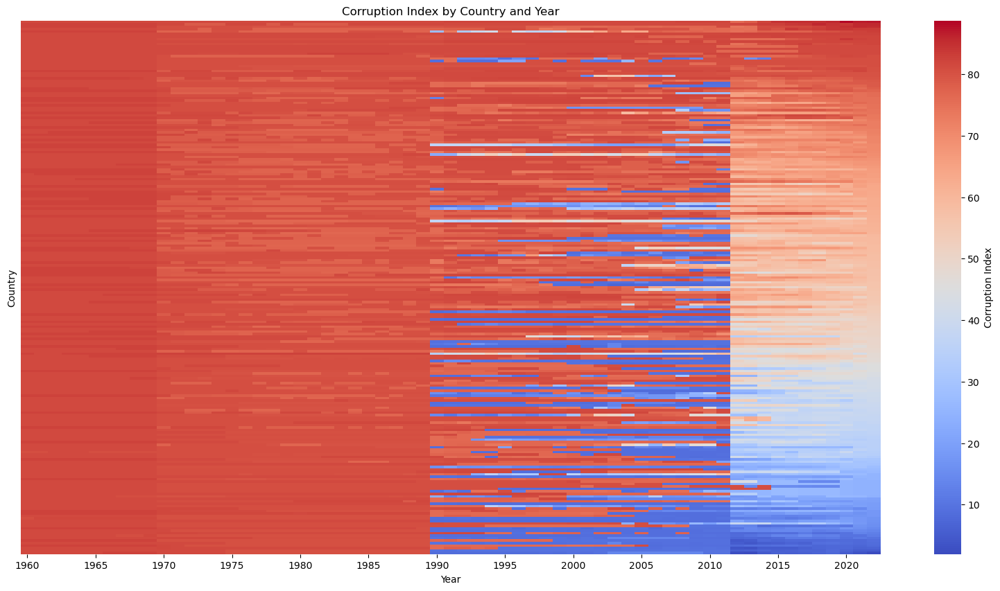

In [154]:
# Graphically illustrage the generale moves of country and corruption levels over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CC_EST')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, dont show country labels, and 1970 to 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Corruption Index'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

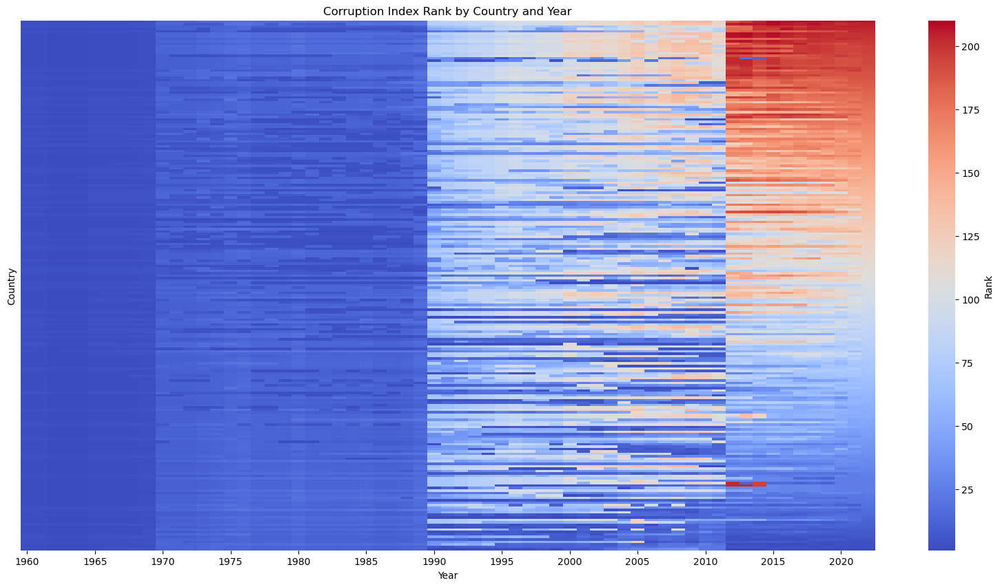

In [155]:
# Plot changes in country ranks over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CC_EST_rank_int')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, don't show country labels, and 1970 to 2022, ranking from lowest to highest in 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Rank'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index Rank by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()


In [156]:
# print mean and median values of CC_EST for the whole dataset
mean_cc_est = df['CC_EST'].mean()
median_cc_est = df['CC_EST'].median()

print(f"The mean CC_EST value across all years is {mean_cc_est:.2f}")
print(f"The median CC_EST value across all years is {median_cc_est:.2f}")

The mean CC_EST value across all years is 50.56
The median CC_EST value across all years is 54.82


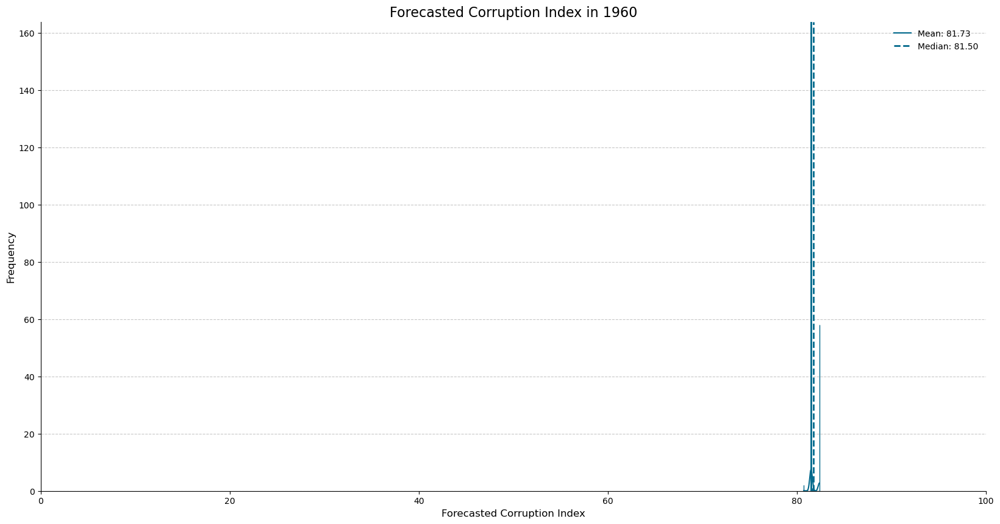

In [157]:
# Plot a histogram of the forecasted corruption levels in 1960
plt.figure(figsize=(20, 10))

# Use seaborn's histplot function to plot the histogram
# Set the color, edgecolor and linewidth for the bars
sns.histplot(df_new[df_new['year'] == 1960]['CC_EST'], bins=100, kde=True, color='#00688B', 
             edgecolor='#00688B', linewidth=1)

# Calculate the mean and median of the forecasted corruption levels
mean_est_1960 = df_new[df_new['year'] == 1960]['CC_EST'].mean()
median_est_1960 = df_new[df_new['year'] == 1960]['CC_EST'].median()

# Add a vertical line at the mean
plt.axvline(mean_est_1960, color='#00688B', linestyle='--', linewidth=2)

# Add a vertical line at the median
plt.axvline(median_est_1960, color='#00688B', linestyle='-', linewidth=2)

# Set the labels and title with larger fonts
plt.xlabel('Forecasted Corruption Index', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Forecasted Corruption Index in 1960', fontsize=16)

# Set the grid style
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend for mean and median
plt.legend([f'Mean: {mean_est_1960:.2f}', f'Median: {median_est_1960:.2f}'], frameon=False)

# Remove top and right spines
sns.despine()

# Set the x-axis limits to 0 and 100
plt.xlim(0, 100)

# Show the plot
plt.show()

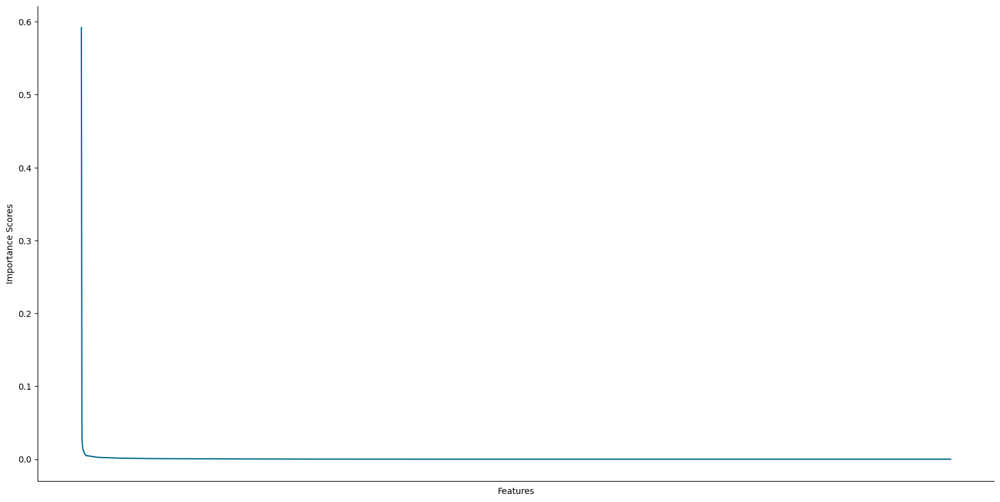

In [158]:
# Convert the list of tuples to a dictionary
importances_dict = results[5].set_index('Feature')['Importance'].to_dict()

# Extract feature names
features = list(importances_dict.keys())

# Since all values are already floats, there's no need to calculate the mean
importance_scores = list(importances_dict.values())

# Create a 2D line plot
fig, ax = plt.subplots(figsize=(20, 10))

# Create a sequence of numbers for the x-axis
x = np.arange(len(features))

# Create the 2D line plot
ax.plot(x, importance_scores, color='#00688B')

# Set the ticks on the x-axis to be the new labels and remove the lines (ticks)
ax.set_xticks(x, minor=False)
ax.set_xticklabels([])
ax.tick_params(axis='x', which='both', length=0)

# Set labels
ax.set_xlabel('Features')
ax.set_ylabel('Importance Scores')

sns.despine()

# Show the plot
plt.show()

# Ignore

In [159]:
df = pd.read_csv('WDI_data.csv')
df = df.drop(columns=['CPI_EST'])
# Make corruption more intuitive with higher values indicating more corruption
df['CC_EST'] = (-1)*df['CC_EST']
df['CC_EST'] = (df['CC_EST'] + 2.5) * 20
# Drop years 1960-2011 if column 'year' is less than 2012
df_dr = df[df['year'] >= 2012]

In [160]:
print("Running model on variables with highest correlation")
for i in range(5, 9):
    # Select only numeric columns
    df_numeric = df.select_dtypes(include=[np.number])
    df_numeric = df_numeric.drop(columns=['year'])

    # Calculate the correlation of each column with 'CC_EST'
    correl = df_numeric.corrwith(df_numeric['CC_EST']).abs()

    # Get the variables with a correlation greater than or equal to the threshold
    vars_correl = correl[correl >= 0.1 * i].index.tolist()
    vars_correl.remove('CC_EST')

    # Get the count of non-null values in each of the selected columns
    non_null_counts = df[vars_correl].count()

    # Sort the columns in descending order of non-null count
    sorted_columns = non_null_counts.sort_values(ascending=False)

    # Get the top 200 columns
    top_columns = sorted_columns.index[:200]

    # Remove correlated features from the top columns
    df_top_columns = df[top_columns]
    df_top_columns = remove_correlated_features(df_top_columns, threshold=0.8)

    # Update the top_columns list to include only the columns present in the DataFrame
    top_columns = df_top_columns.columns.tolist()

    results = build_and_evaluate_model(df, 'CC_EST', top_columns, n_leads=2)
    
    print(f"\n Model with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
    print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
    print(f"Mean cross-validation score: {results[4]}\n")
    print(results[5])  # Feature importances
    print('\n')
    print(results[6][['country', 'year', 'CC_EST', 'CC_EST_lead1', 'CC_EST_lead2']])

Running model on variables with highest correlation

 Model with correlation >= 0.5:
Training+Validation R^2: 0.99724, RMSE: 1.05141
Testing R^2: 0.98363, RMSE: 2.54194
Mean cross-validation score: 0.98093

               Feature  Importance
200       CC_EST_lead1    0.764917
22   SP_POP_65UP_FE_ZS    0.019109
201       CC_EST_lead2    0.010726
49      SH_DYN_MORT_MA    0.009604
68         SH_DYN_2024    0.008769
..                 ...         ...
89   SL_EMP_SELF_FE_ZS    0.000000
85   SL_EMP_WORK_MA_ZS    0.000000
77      SL_EMP_VULN_ZS    0.000000
172  DC_ODA_TOTL_GN_ZS    0.000000
78   SL_EMP_SELF_MA_ZS    0.000000

[202 rows x 2 columns]


        country  year     CC_EST  CC_EST_lead1  CC_EST_lead2
52      Andorra  2012  24.789383     25.437155     25.838907
53      Andorra  2013  24.929030     25.838907     25.815485
54      Andorra  2014  25.585828     25.815485     26.518415
55      Andorra  2015  26.963785     26.518415     25.815485
56      Andorra  2016  26.808882     25.81

# Model 3

In [2]:
df = pd.read_csv('WDI_data.csv')
# Remove column CPI_EST
df = df.drop(columns=['CPI_EST'])
# Make corruption more intuitive with higher values indicating more corruption
df['CC_EST'] = (-1)*df['CC_EST']
# Make years integers
df['year'] = df['year'].astype(int)
# Convert all CC_EST values to positive between 0 and 100
df['CC_EST'] = (df['CC_EST'] + 2.5) * 20

In [3]:
# Create a column that has the average CC_EST for each country between the year 2012 and 2022 only but prints for all years given the country
df['WB_CC_EST_avg'] = df.groupby('iso2c')['CC_EST'].transform(lambda x: x[(df['year'] >= 2012) & (df['year'] <= 2022)].mean())
df['WB_CC_EST_avg'] = np.log1p(df['WB_CC_EST_avg'])

In [163]:
# count the nu,ber of columns in df
len(df.columns)

1455

In [4]:
# Filter df to only include years from 1970 to 2011
df_pre_2012 = df[(df['year'] >= 1960) & (df['year'] < 2012)]

# Calculate the percentage of missing values in each column for years prior to 2012
missing_percentages = df_pre_2012.isnull().mean()

# Select the columns that have less than 50% missing values, or are 'CC_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', and 'WB_CC_EST_avg'
cols_to_keep = [col for col in df.columns if col in ['CC_EST','NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'WB_CC_EST_avg', 'SL_UEM_TOTL_NE_ZS', 'SE_SEC_DURS', 'SI_POV_GINI'] or (col in missing_percentages and missing_percentages[col] < 0.5)]

# Keep only the selected columns in df
df = df[cols_to_keep]

In [165]:
# View
df[['iso2c', 'country', 'year', 'CC_EST', 'WB_CC_EST_avg', 'SL_UEM_TOTL_NE_ZS', 'SE_SEC_DURS', 'SI_POV_GINI']]

,iso2c,country,year,CC_EST,WB_CC_EST_avg,SL_UEM_TOTL_NE_ZS,SE_SEC_DURS,SI_POV_GINI
0,AD,Andorra,1960,NaN,3.282977,NaN,NaN,NaN
1,AD,Andorra,1961,NaN,3.282977,NaN,NaN,NaN
2,AD,Andorra,1962,NaN,3.282977,NaN,NaN,NaN
3,AD,Andorra,1963,NaN,3.282977,NaN,NaN,NaN
4,AD,Andorra,1964,NaN,3.282977,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
13729,ZW,Zimbabwe,2018,74.920013,4.347206,NaN,6.0,NaN
13730,ZW,Zimbabwe,2019,75.423806,4.347206,7.373,6.0,50.3
13731,ZW,Zimbabwe,2020,75.759847,4.347206,NaN,6.0,NaN
13732,ZW,Zimbabwe,2021,75.071001,4.347206,9.540,6.0,NaN


In [5]:
import pycountry

# Create a dictionary that maps ISO 2-letter country codes to a dictionary containing the ISO 3-letter and numeric country codes
country_codes = {country.alpha_2: {'alpha-3': country.alpha_3, 'numeric': country.numeric} for country in pycountry.countries}

# Now you can use this dictionary in your code
df['iso3c'] = df['iso2c'].map(lambda x: country_codes.get(x, {}).get('alpha-3'))
df['iso3n'] = df['iso2c'].map(lambda x: country_codes.get(x, {}).get('numeric'))

In [167]:
"""
def backfill_based_on_avg_change(df, column):
    """
    Backfill missing values in the specified column based on the average percentage change of the next 5 years for each country.
    """
    # Iterate over each country
    for country in df['iso2c'].unique():
        # Get the data for the current country
        df_country = df[df['iso2c'] == country].copy()

        # Sort the data by year in ascending order
        df_country.sort_values('year', inplace=True)

        # Identify the indices of the missing values in the column
        missing_indices = df_country[df_country[column].isnull() & (df_country['year'] < 2012)].index.tolist()

        # For each missing value, calculate the average percentage change of the next 5 years and use it to fill the missing value
        for idx in missing_indices:
            if df_country.loc[idx, 'year'] < 1950:
                continue
            next_10_years_avg_pct_change = df_country.loc[idx+1:idx+11, column].pct_change().mean()

            # Apply the average percentage change to each year as it extrapolates backwards
            for i in reversed(range(missing_indices[0], idx+1)):
                if i+1 in df_country.index:
                    df_country.loc[i, column] = df_country.loc[i+1, column] * (1 - next_10_years_avg_pct_change)

        # Update the column in the original DataFrame
        df.loc[df['iso2c'] == country, column] = df_country[column]

    return df

# Use the function to backfill the missing values in 'NY_GDP_PCAP_KD' and 'NY_GDP_PCAP_CD'
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_KD')
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_CD')
df['NY_GDP_PCAP_KD_rel'] = df.groupby('year')['NY_GDP_PCAP_KD'].transform(lambda x: x / x.mean())
df['NY_GDP_PCAP_CD_rel'] = df.groupby('year')['NY_GDP_PCAP_CD'].transform(lambda x: x / x.mean())
"""

IndentationError: unexpected indent (2284408055.py, line 4)

In [6]:
def backfill_based_on_avg_change(df, column):
    """
    Backfill missing values in the specified column based on the average percentage change of the next 10 years for each country.
    """
    # Iterate over each country
    for country in df['iso2c'].unique():
        # Get the data for the current country
        df_country = df[df['iso2c'] == country].copy()

        # Sort the data by year in ascending order
        df_country.sort_values('year', inplace=True)

        # Identify the indices of the missing values in the column
        missing_indices = df_country[df_country[column].isnull() & (df_country['year'] < 2012)].index.tolist()

        # For each missing value, calculate the average percentage change of the next 10 years and use it to fill the missing value
        for idx in missing_indices:
            if df_country.loc[idx, 'year'] < 1950:
                continue
            next_10_years_avg_pct_change = df_country.loc[idx+1:idx+11, column].pct_change().mean()

            # Apply a resistance factor to the average percentage change
            resistance_factor = 1 / (abs(next_10_years_avg_pct_change) + 1)
            if abs(next_10_years_avg_pct_change) > 0.05: 
                resistance_factor *= 1 / (10 * abs(next_10_years_avg_pct_change) + 1)
            next_10_years_avg_pct_change *= resistance_factor

            # Apply the average percentage change to each year as it extrapolates backwards
            for i in reversed(range(missing_indices[0], idx+1)):
                if i+1 in df_country.index:
                    df_country.loc[i, column] = df_country.loc[i+1, column] * (1 - next_10_years_avg_pct_change)

        # Update the column in the original DataFrame
        df.loc[df['iso2c'] == country, column] = df_country[column]

    return df

# Use the function to backfill the missing values in 'NY_GDP_PCAP_KD' and 'NY_GDP_PCAP_CD'
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_KD')
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_CD')
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_CN')
df['NY_GDP_PCAP_KD_rel'] = df.groupby('year')['NY_GDP_PCAP_KD'].transform(lambda x: x / x.mean())
df['NY_GDP_PCAP_CD_rel'] = df.groupby('year')['NY_GDP_PCAP_CD'].transform(lambda x: x / x.mean())
df['NY_GDP_PCAP_CD_rel'] = df.groupby('year')['NY_GDP_PCAP_CN'].transform(lambda x: x / x.mean())

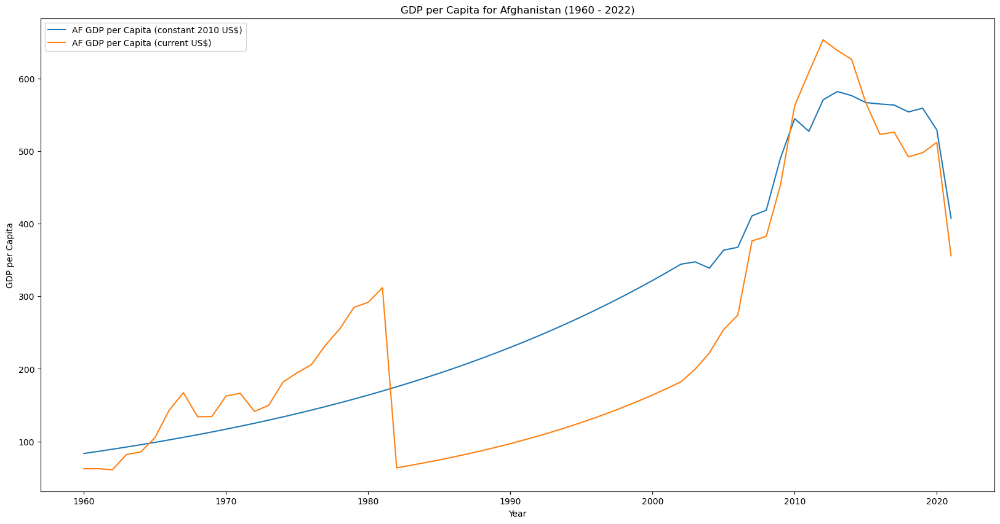

In [7]:
# Plot GDP per capita in constant 2010 US$ and current US$ from 1960 to 2022 for Afghanistan
# Create a line plot of the data
plt.figure(figsize=(20, 10))

countries = ['AF']
for country in countries:
    # Plot the GDP per capita in constant 2010 US$ for the current country
    sns.lineplot(data=df[df['iso2c'] == country], x='year', y='NY_GDP_PCAP_KD', label=f'{country} GDP per Capita (constant 2010 US$)')

    # Plot the GDP per capita in current US$ for the current country
    sns.lineplot(data=df[df['iso2c'] == country], x='year', y='NY_GDP_PCAP_CD', label=f'{country} GDP per Capita (current US$)')

plt.title('GDP per Capita for Afghanistan (1960 - 2022)')

plt.xlabel('Year')
plt.ylabel('GDP per Capita')
plt.legend()
plt.show()

In [8]:
df_dr = df[df['year'] >= 2012]
df_dr = df_dr.dropna(subset=['CC_EST'])

# Create a new dataframe with only iso2c, country, and CC_EST
df_corr = df_dr[['iso2c', 'country','year', 'CC_EST']]

# Filter the data for the years 2012 and 2022
df_filtered = df_corr[df_corr['year'].isin([2012, 2022])]

In [9]:
# Calculate the linear differences over time for each given country
change_by_country = df_filtered.pivot_table(index='iso2c', columns='year', values='CC_EST', aggfunc='first')

# Calculate the change for each country
change_by_country['avg_change'] = (change_by_country[2022] - change_by_country[2012]) / 10

# Calculate the mean and median CC_EST values across all years for each country
mean_cc_est_by_country = df_filtered.groupby('iso2c')['CC_EST'].mean()
median_cc_est_by_country = df_filtered.groupby('iso2c')['CC_EST'].median()

# Merge with the original DataFrame to get the country names
df_trend = pd.merge(change_by_country['avg_change'], mean_cc_est_by_country, left_index=True, right_index=True, how='left')
df_trend = pd.merge(df_trend, median_cc_est_by_country, left_index=True, right_index=True, how='left')

# Reset index and rename columns
df_trend.reset_index(inplace=True)
df_trend.rename(columns={'CC_EST_x': 'mean_CC_EST', 'CC_EST_y': 'median_CC_EST'}, inplace=True)

# Include country names
df_trend = pd.merge(df_trend, df_filtered[['iso2c', 'country']].drop_duplicates(), on='iso2c', how='left')

print(df_trend)


    iso2c  avg_change  mean_CC_EST  median_CC_EST               country
0      AD   -0.019346    24.692656      24.692656               Andorra
1      AE    0.000799    26.889273      26.889273  United Arab Emirates
2      AF   -0.493193    76.141493      76.141493           Afghanistan
3      AG    1.899853    34.288647      34.288647   Antigua and Barbuda
4      AL   -0.741708    61.866050      61.866050               Albania
..    ...         ...          ...            ...                   ...
199    XK   -0.779124    59.171521      59.171521                Kosovo
200    YE    0.841619    79.383066      79.383066           Yemen, Rep.
201    ZA    0.271189    55.039358      55.039358          South Africa
202    ZM    0.475517    58.206411      58.206411                Zambia
203    ZW   -0.253328    76.369429      76.369429              Zimbabwe

[204 rows x 5 columns]


In [10]:
# Calculate the mean 'mean_CC_EST' value for each country
mean_values = df_trend.groupby('country')['mean_CC_EST'].mean()

# Find the index of the maximum and minimum mean 'mean_CC_EST' values
most_corrupt_country = mean_values.idxmax()
least_corrupt_country = mean_values.idxmin()

print("The most corrupt country (on average between 2012 and 2022) is", most_corrupt_country)
print("The least corrupt country (on average between 2012 and 2022) is", least_corrupt_country)

# Calculate the mean 'avg_change' value for each country
mean_changes = df_trend.groupby('country')['avg_change'].mean()

print("The country that became more corrupt (rose the most) on average between 2012 and 2022 is", mean_changes.idxmax())
print("The country that became less corrupt (fell the most) on average between 2012 and 2022 is", mean_changes.idxmin())

The most corrupt country (on average between 2012 and 2022) is Somalia
The least corrupt country (on average between 2012 and 2022) is Denmark
The country that became more corrupt (rose the most) on average between 2012 and 2022 is Antigua and Barbuda
The country that became less corrupt (fell the most) on average between 2012 and 2022 is Seychelles


In [11]:
df_correl = pd.read_csv('correlations.csv')
# Rank in order of correlation with CC_EST
df_correl = df_correl.sort_values('correlation', ascending=False)

In [12]:
# Remove rows in df_dr that have missing values in CC_EST column
df_dr = df[df['year'] >= 2012]
df_dr = df_dr.dropna(subset=['CC_EST'])

# Filter to only show correlations greater than or equal to +- 0.5
df_correl_5 = df_correl[abs(df_correl['correlation']) >= 0.5]
# Filter to only show correlations greater than or equal to +- 0.6
df_correl_6 = df_correl[abs(df_correl['correlation']) >= 0.6]
# Filter to only show correlations greater than or equal to +- 0.7
df_correl_7 = df_correl[abs(df_correl['correlation']) >= 0.7]
# Filter to only show correlations greater than or equal to +- 0.8
df_correl_8 = df_correl[abs(df_correl['correlation']) >= 0.8]
# Filter to only show correlations greater than or equal to +- 0.9
df_correl_9 = df_correl[abs(df_correl['correlation']) >= 0.9]

print(f"The number of correlations with an absolute value greater than or equal to 0.5 is", len(df_correl_5))
print(f"The number of correlations with an absolute value greater than or equal to 0.6 is", len(df_correl_6))
print(f"The number of correlations with an absolute value greater than or equal to 0.7 is", len(df_correl_7))
print(f"The number of correlations with an absolute value greater than or equal to 0.8 is", len(df_correl_8))
print(f"The number of correlations with an absolute value greater than or equal to 0.9 is", len(df_correl_9))

The number of correlations with an absolute value greater than or equal to 0.5 is 253
The number of correlations with an absolute value greater than or equal to 0.6 is 128
The number of correlations with an absolute value greater than or equal to 0.7 is 54
The number of correlations with an absolute value greater than or equal to 0.8 is 7
The number of correlations with an absolute value greater than or equal to 0.9 is 1


In [13]:
# Merge together corruption values and the largest correlators
# Create variables that are a list of the variables that are highly correlated with CC_EST
vars_5 = df_correl_5.columns.tolist()
vars_5 = [var for var in vars_5 if var in df_dr.columns]
vars_6 = df_correl_6.columns.tolist()
vars_6 = [var for var in vars_6 if var in df_dr.columns]
vars_7 = df_correl_7.columns.tolist()
vars_7 = [var for var in vars_7 if var in df_dr.columns]
vars_8 = df_correl_8.columns.tolist()
vars_8 = [var for var in vars_8 if var in df_dr.columns]
vars_9 = df_correl_9.columns.tolist()
vars_9 = [var for var in vars_9 if var in df_dr.columns]

# Merge the corruption values with the variables that are highly correlated with CC_EST
df_5 = df_dr[['iso2c', 'country', 'year', 'CC_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel', 'SL_UEM_TOTL_NE_ZS', 'SE_SEC_DURS', 'SI_POV_GINI'] + vars_5]
df_6 = df_dr[['iso2c', 'country', 'year', 'CC_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel', 'SL_UEM_TOTL_NE_ZS', 'SE_SEC_DURS', 'SI_POV_GINI'] + vars_6]
df_7 = df_dr[['iso2c', 'country', 'year', 'CC_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel', 'SL_UEM_TOTL_NE_ZS', 'SE_SEC_DURS', 'SI_POV_GINI'] + vars_7]
df_8 = df_dr[['iso2c', 'country', 'year', 'CC_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel', 'SL_UEM_TOTL_NE_ZS', 'SE_SEC_DURS', 'SI_POV_GINI'] + vars_8]
df_9 = df_dr[['iso2c', 'country', 'year', 'CC_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel', 'SL_UEM_TOTL_NE_ZS', 'SE_SEC_DURS', 'SI_POV_GINI'] + vars_9]
# Build random forest model to predict corruption from highly correlated variables
# Simplify notation:
x5 = df_5.iloc[:,2:].values
x6 = df_6.iloc[:,2:].values
x7 = df_7.iloc[:,2:].values
x8 = df_8.iloc[:,2:].values
x9 = df_9.iloc[:,2:].values

y = df_dr['CC_EST'].values

In [14]:
def prepare_lead_data(df, target_col, lead_cols, time_col, country_col):
    """Shifts features to create lead versions for backcasting, 
       accounting for country and year structure.
    """
    df_lead = df.copy()

    for col in lead_cols:
        df_lead[f'{col}_lead1'] = df_lead.sort_values([time_col]).groupby(country_col)[col].shift(-1)

    df_lead.fillna(0, inplace=True)
    return df_lead


def remove_correlated_features(df, threshold):
    """Removes highly correlated features based on a threshold."""
    corr_matrix = df.dropna().corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    cols_to_drop = [col for col in upper.columns if any(upper[col] > threshold)]
    df = df.drop(cols_to_drop, axis=1)
    return df

def custom_cross_val_score(model, X, y, cv):
    """Calculates cross-validation scores for a given model."""
    scores = []
    kf = KFold(n_splits=cv)
    
    for train_index, val_index in kf.split(X):
        x_train, x_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        model.fit(x_train, y_train, eval_set=[(x_val, y_val)], verbose=False)

        y_val_pred = model.predict(x_val)
        r2_val = round(r2_score(y_val, y_val_pred), 5)
        scores.append(r2_val)
    
    return scores

In [15]:
def custom_objective(y_true, y_pred, indices):
    """
    Custom objective function that penalizes predictions close to or beyond the bounds of 0 and 100,
    penalizes large changes from the previous year's prediction, and penalizes an overall movement greater than 20 from the 2012 value.
    """
    # Convert y_true and y_pred to pandas Series
    y_true = pd.Series(y_true)
    y_pred = pd.Series(y_pred)
    
    # Select the corresponding value from y_2012 for each y_true and y_pred
    y_2012 = df['WB_CC_EST_avg'].loc[indices]
    
    # Calculate the squared error
    squared_error = (y_true - y_pred) ** 2
    
    # Calculate the penalty term
    penalty = np.abs(y_pred - y_2012)
    
    # Add the penalty term to the squared error
    penalized_squared_error = squared_error + penalty
    
    # Calculate the first derivative (gradient) of the penalized squared error
    grad = -2 * (y_true - y_pred) + np.sign(y_pred - y_2012)
    
    # Calculate the second derivative (Hessian) of the penalized squared error
    hess = np.ones_like(grad) * 2
    
    return grad, hess

class TqdmCallback(xgb.callback.TrainingCallback):
    def __init__(self, bar):
        self._bar = bar

    def after_iteration(self, model, epoch, evals_log):
        self._bar.update(1)
        return False

def build_and_evaluate_model(df, target_col_name, var_list, n_leads=2):
    """
    Builds, evaluates, and returns results for an XGBoost model.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df = df.copy()

    # Exclude 'iso2c', 'country', target_col_name, and lead variables from var_list
    var_list = [var for var in var_list if var not in ['iso2c', 'country', target_col_name] + [f"{target_col_name}_lead{i}" for i in range(1, n_leads + 1)]]

    # Remove rows with invalid values in the target column
    df = df[np.isfinite(df[target_col_name]) & (abs(df[target_col_name]) <= 1e30)]

    # Add a new feature for the previous year's target value
    df[target_col_name + '_prev'] = df.groupby('iso2c')[target_col_name].shift()
    var_list.append(target_col_name + '_prev')

    X = df[var_list]

    df_train_val, df_test = train_test_split(df, test_size=0.2, random_state=0)

    x_train_val, x_test, y_train_val, y_test = train_test_split(X, df[target_col_name], test_size=0.2, random_state=0)

    # Remove correlated features
    x_lead = x_train_val
    x_test = x_test[x_lead.columns]

    # Align datasets before model training
    x_lead, x_test = x_lead.align(x_test, join='inner', axis=1)

    model = XGBRegressor(
        objective='reg:squarederror',
        random_state=0,
        alpha=1.0,
        reg_lambda=10.0,
        early_stopping_rounds=10
    )

    with tqdm(total=model.get_params()['n_estimators']) as pbar:
        model.fit(
            x_lead,
            y_train_val,
            eval_set=[(x_test, y_test)],
            verbose=False,
            callbacks=[TqdmCallback(pbar)]
        )


    y_train_val_pred = model.predict(x_lead)
    y_test_pred = model.predict(x_test)

    # Clip the predictions to be within the desired range
    y_train_val_pred = np.clip(y_train_val_pred, 0, 100)
    y_test_pred = np.clip(y_test_pred, 0, 100)

    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    cv_scores = custom_cross_val_score(model, x_train_val, y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)

    # Get the feature importances
    feature_importances = model.feature_importances_

    # Get the feature names from x_lead
    feature_names = x_lead.columns.tolist()

    # Align feature importances with feature names
    feature_importances_aligned = pd.Series(feature_importances, index=feature_names)    

    # Create a DataFrame with the aligned feature importances
    feature_importances_df = pd.DataFrame({
        'Feature': feature_importances_aligned.index,
        'Importance': np.round(feature_importances_aligned.values, 4)
    }).sort_values(by='Importance', ascending=False)


    return r2_train_val, r2_test, rmse_train_val, rmse_test, mean_cv_score, feature_importances_df, x_test.index, y_test_pred, y_test, df, model, feature_importances


Running model on full dataset


0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
13it [00:00, 28.98it/s]

29it [00:01, 23.54it/s]



Model with correlation >= 0.0:
Training+Validation R^2: 0.997, RMSE: 1.09271
Testing R^2: 0.98088, RMSE: 2.79089
Mean cross-validation score: 0.98084

               Feature  Importance
298      WB_CC_EST_avg      0.8569
301        CC_EST_prev      0.0157
140     NY_GDP_PCAP_CN      0.0111
201  SP_POP_0014_MA_IN      0.0031
153     NY_GNP_PCAP_CN      0.0029
..                 ...         ...
213  SP_POP_1564_MA_IN      0.0000
258  SP_POP_TOTL_MA_ZS      0.0000
259        SP_RUR_TOTL      0.0000
130     NY_GDP_FCST_CN      0.0000
257  SP_POP_TOTL_MA_IN      0.0000

[302 rows x 2 columns]


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[2249

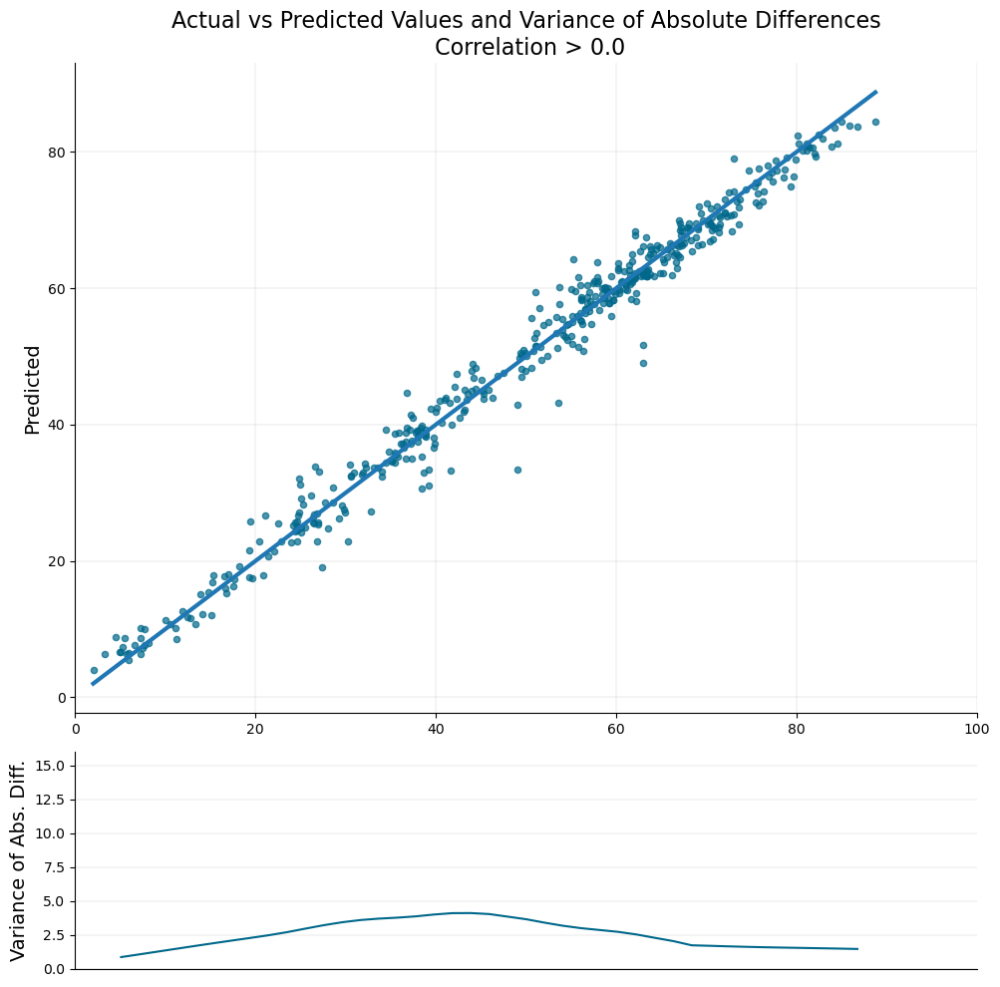

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
35it [00:00, 49.44it/s]



Model with correlation >= 0.1:
Training+Validation R^2: 0.99761, RMSE: 0.97555
Testing R^2: 0.97951, RMSE: 2.88927
Mean cross-validation score: 0.98049

               Feature  Importance
193      WB_CC_EST_avg      0.8901
195        CC_EST_prev      0.0138
113  SP_POP_0004_FE_5Y      0.0060
116  SP_POP_0014_FE_ZS      0.0057
12      DT_ODA_ALLD_KD      0.0033
..                 ...         ...
165  SP_URB_TOTL_IN_ZS      0.0000
105     SP_DYN_IMRT_IN      0.0000
149  SP_POP_65UP_MA_ZS      0.0000
150  SP_POP_65UP_TO_ZS      0.0000
147  SP_POP_6569_MA_5Y      0.0000

[196 rows x 2 columns]


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[22

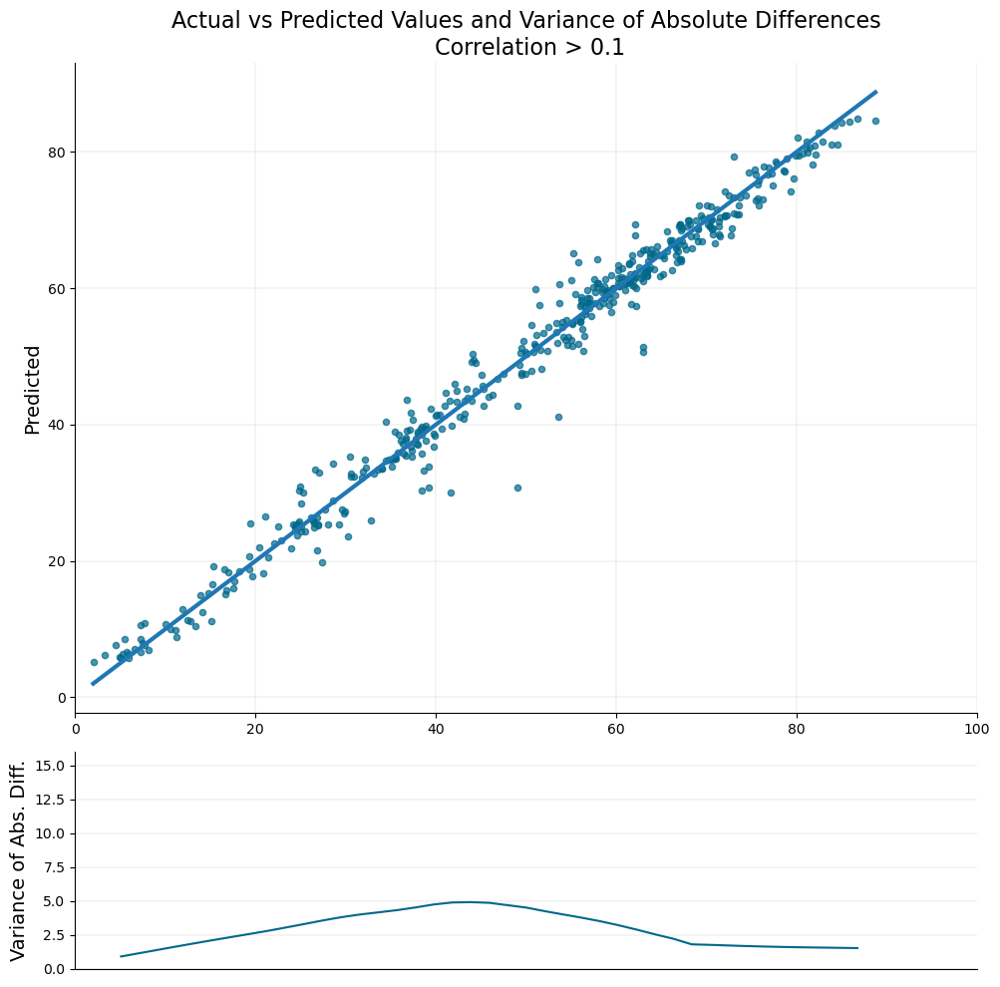

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
43it [00:00, 81.71it/s]



Model with correlation >= 0.2:
Training+Validation R^2: 0.99793, RMSE: 0.90663
Testing R^2: 0.97913, RMSE: 2.91614
Mean cross-validation score: 0.98014

               Feature  Importance
130      WB_CC_EST_avg      0.9400
132        CC_EST_prev      0.0129
69   SP_POP_0004_FE_5Y      0.0038
71   SP_POP_0014_FE_ZS      0.0018
9       DT_ODA_ALLD_KD      0.0015
..                 ...         ...
11      DT_ODA_ODAT_KD      0.0000
116  SP_URB_TOTL_IN_ZS      0.0000
110     SP_POP_DPND_OL      0.0000
53      SH_DYN_MORT_MA      0.0000
72   SP_POP_0014_MA_ZS      0.0000

[133 rows x 2 columns]


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[22

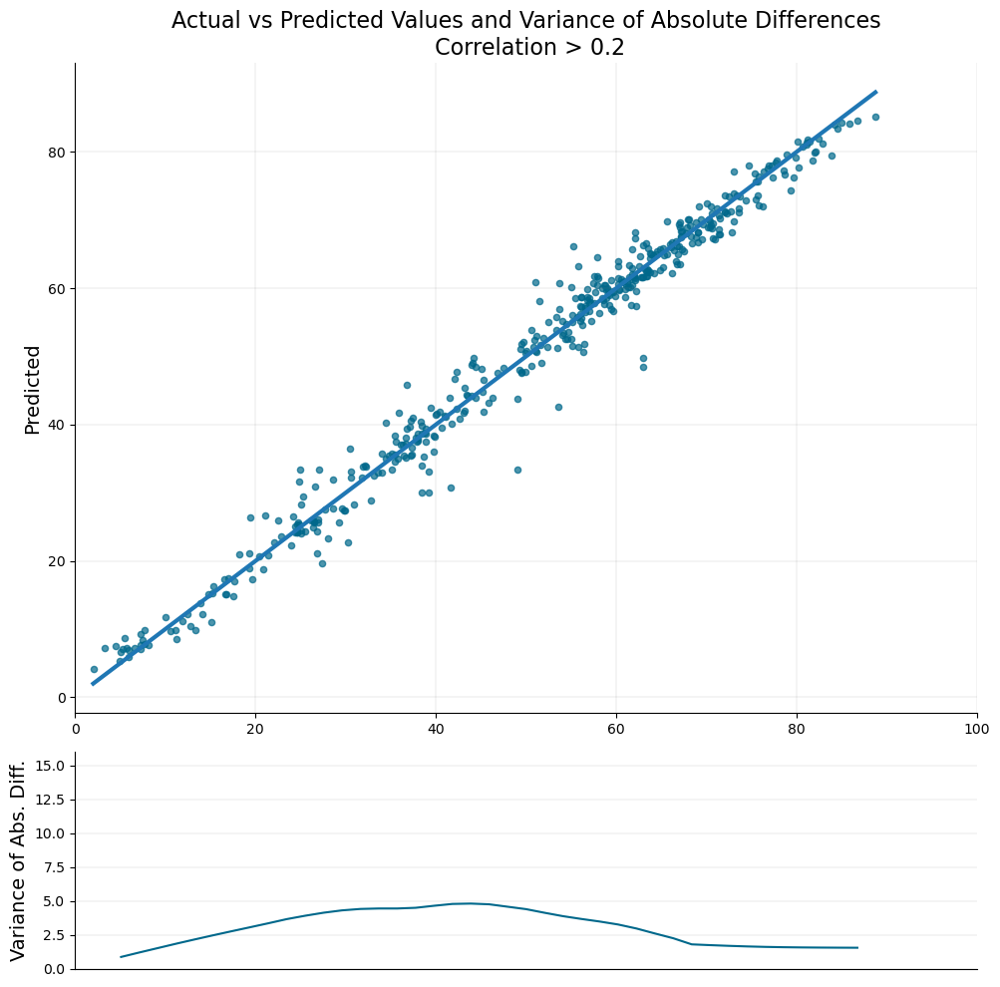

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
84it [00:00, 97.44it/s] 



Model with correlation >= 0.3:
Training+Validation R^2: 0.99944, RMSE: 0.47309
Testing R^2: 0.98085, RMSE: 2.7933
Mean cross-validation score: 0.98077

               Feature  Importance
99       WB_CC_EST_avg      0.9453
101        CC_EST_prev      0.0133
52   SP_POP_0004_FE_5Y      0.0027
54   SP_POP_0014_FE_ZS      0.0020
51   SP_DYN_TO65_MA_ZS      0.0018
..                 ...         ...
82   SP_POP_65UP_TO_ZS      0.0001
34         SH_DYN_MORT      0.0001
0       AG_CON_FERT_ZS      0.0001
95   SP_URB_TOTL_IN_ZS      0.0000
81   SP_POP_65UP_MA_ZS      0.0000

[102 rows x 2 columns]


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[224

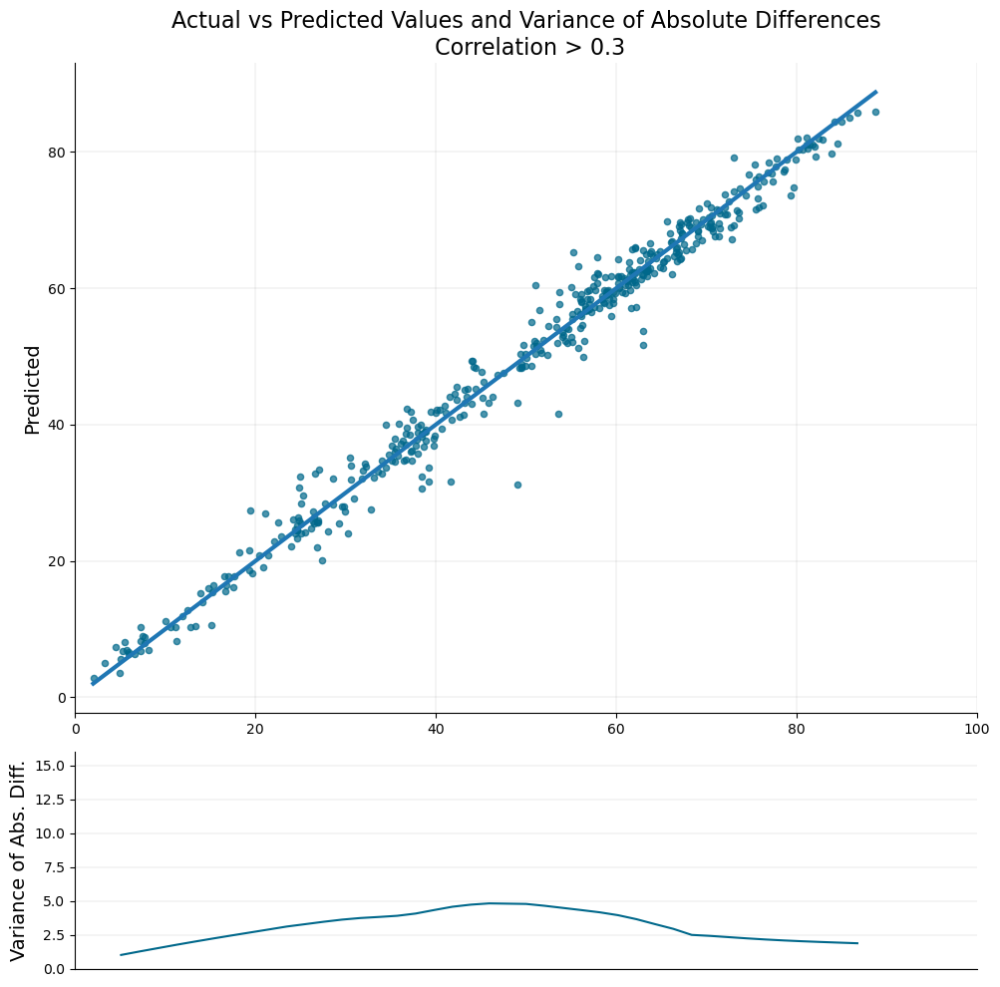

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
100it [00:00, 156.44it/s]



Model with correlation >= 0.4:
Training+Validation R^2: 0.99967, RMSE: 0.35981
Testing R^2: 0.9823, RMSE: 2.68567
Mean cross-validation score: 0.98179

               Feature  Importance
72       WB_CC_EST_avg      0.9452
74         CC_EST_prev      0.0129
29   SP_POP_0004_FE_5Y      0.0033
31   SP_POP_0014_FE_ZS      0.0027
28   SP_DYN_TO65_MA_ZS      0.0020
33   SP_POP_0014_TO_ZS      0.0012
22   SP_DYN_IMRT_MA_IN      0.0012
38   SP_POP_1519_FE_5Y      0.0011
59   SP_POP_65UP_TO_ZS      0.0010
47   SP_POP_4549_FE_5Y      0.0009
6       NV_AGR_TOTL_ZS      0.0009
62   SP_POP_7579_FE_5Y      0.0009
18      SP_DYN_AMRT_MA      0.0008
26      SP_DYN_TFRT_IN      0.0008
66         SP_POP_DPND      0.0007
21      SP_DYN_IMRT_IN      0.0007
35   SP_POP_0509_MA_5Y      0.0007
60   SP_POP_7074_FE_5Y      0.0007
17      SP_DYN_AMRT_FE      0.0007
40   SP_POP_1564_FE_ZS      0.0007
11         SG_LAW_INDX      0.0007
45   SP_POP_4044_FE_5Y      0.0007
73  NY_GDP_PCAP_KD_rel      0.0006
20   SP

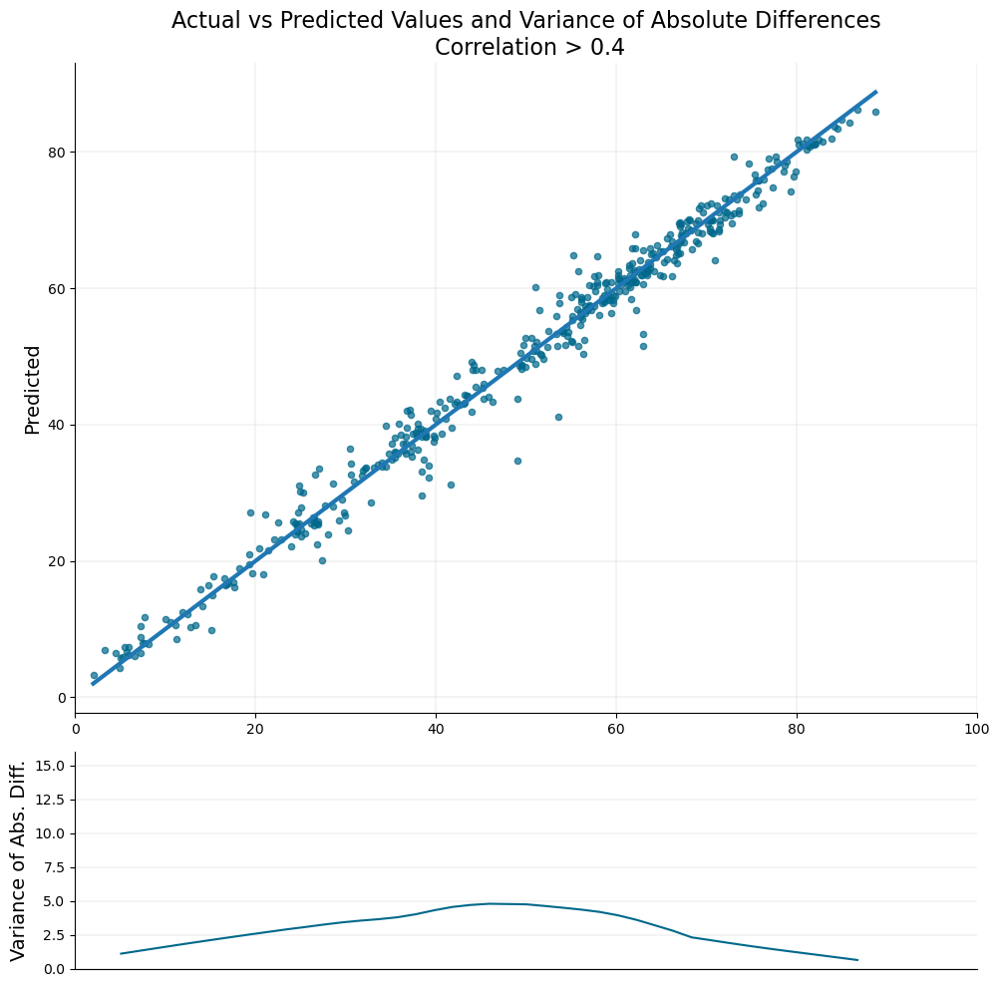

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
57it [00:00, 185.36it/s]



Model with correlation >= 0.5:
Training+Validation R^2: 0.99803, RMSE: 0.88484
Testing R^2: 0.98124, RMSE: 2.76455
Mean cross-validation score: 0.98201

               Feature  Importance
59       WB_CC_EST_avg      0.9524
61         CC_EST_prev      0.0138
25   SP_POP_0004_FE_5Y      0.0022
34   SP_POP_1519_FE_5Y      0.0013
19   SP_DYN_LE00_FE_IN      0.0010
18   SP_DYN_IMRT_MA_IN      0.0010
14      SP_DYN_AMRT_MA      0.0009
37   SP_POP_4549_FE_5Y      0.0009
17      SP_DYN_IMRT_IN      0.0009
3       NV_AGR_TOTL_ZS      0.0008
54   SP_POP_80UP_FE_5Y      0.0008
22      SP_DYN_TFRT_IN      0.0008
24   SP_DYN_TO65_MA_ZS      0.0007
32   SP_POP_1014_FE_5Y      0.0007
44   SP_POP_6064_MA_5Y      0.0007
43   SP_POP_6064_FE_5Y      0.0007
23   SP_DYN_TO65_FE_ZS      0.0007
45   SP_POP_6569_FE_5Y      0.0006
36   SP_POP_2024_FE_5Y      0.0006
39   SP_POP_5054_FE_5Y      0.0006
40   SP_POP_5054_MA_5Y      0.0006
46   SP_POP_6569_MA_5Y      0.0006
41   SP_POP_5559_FE_5Y      0.0006
49   S

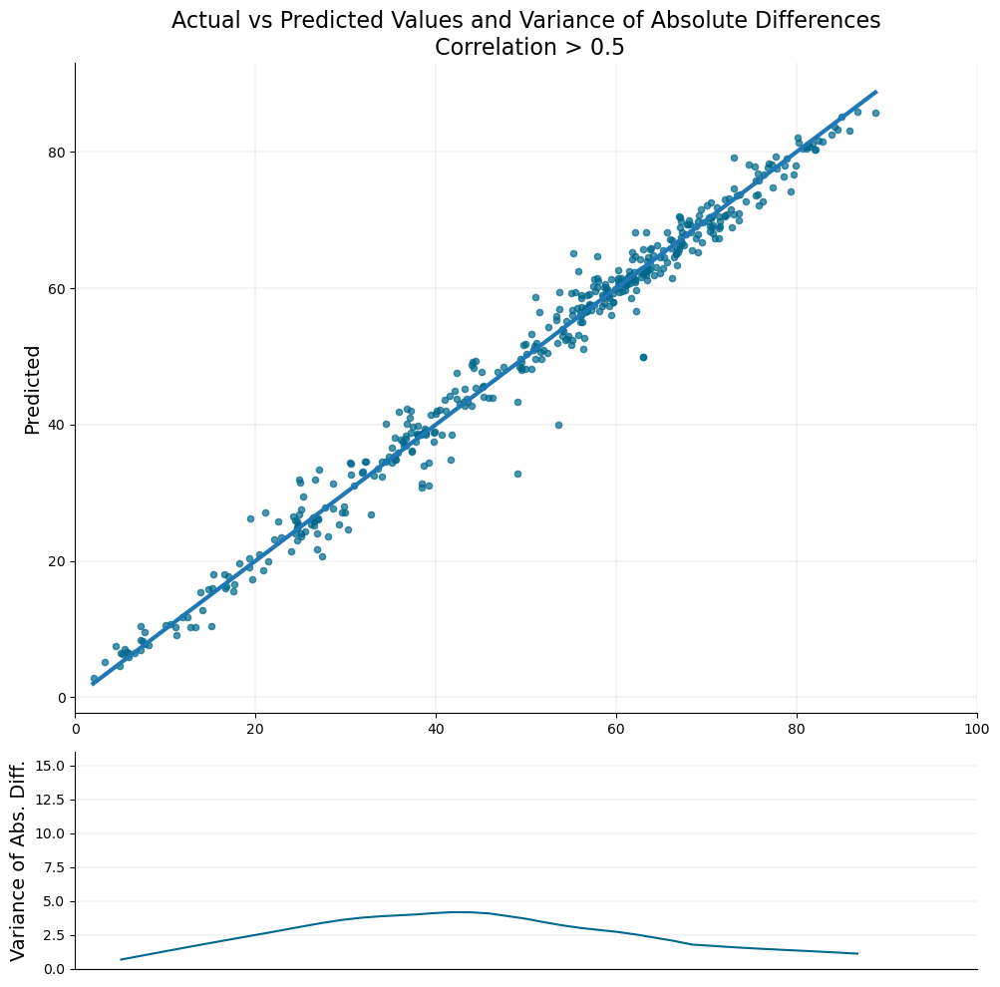

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
37it [00:00, 257.91it/s]



Model with correlation >= 0.6:
Training+Validation R^2: 0.99576, RMSE: 1.29878
Testing R^2: 0.98007, RMSE: 2.84968
Mean cross-validation score: 0.98152

               Feature  Importance
30       WB_CC_EST_avg      0.9610
32         CC_EST_prev      0.0176
10   SP_POP_0004_FE_5Y      0.0019
19   SP_POP_1519_FE_5Y      0.0013
9    SP_DYN_TO65_MA_ZS      0.0011
28   SP_POP_7579_MA_5Y      0.0009
20   SP_POP_1519_MA_5Y      0.0009
5       SP_DYN_CBRT_IN      0.0009
31  NY_GDP_PCAP_KD_rel      0.0008
26   SP_POP_65UP_TO_ZS      0.0008
27   SP_POP_7074_MA_5Y      0.0007
11   SP_POP_0004_MA_5Y      0.0007
23   SP_POP_6064_MA_5Y      0.0007
29      SP_POP_DPND_YG      0.0007
6    SP_DYN_LE00_FE_IN      0.0007
15   SP_POP_0509_FE_5Y      0.0006
25   SP_POP_65UP_MA_ZS      0.0006
17   SP_POP_1014_FE_5Y      0.0006
24   SP_POP_6569_MA_5Y      0.0006
4          SH_DYN_NMRT      0.0006
2       NY_GDP_PCAP_KD      0.0006
21   SP_POP_5054_MA_5Y      0.0006
22   SP_POP_5559_MA_5Y      0.0006
0     

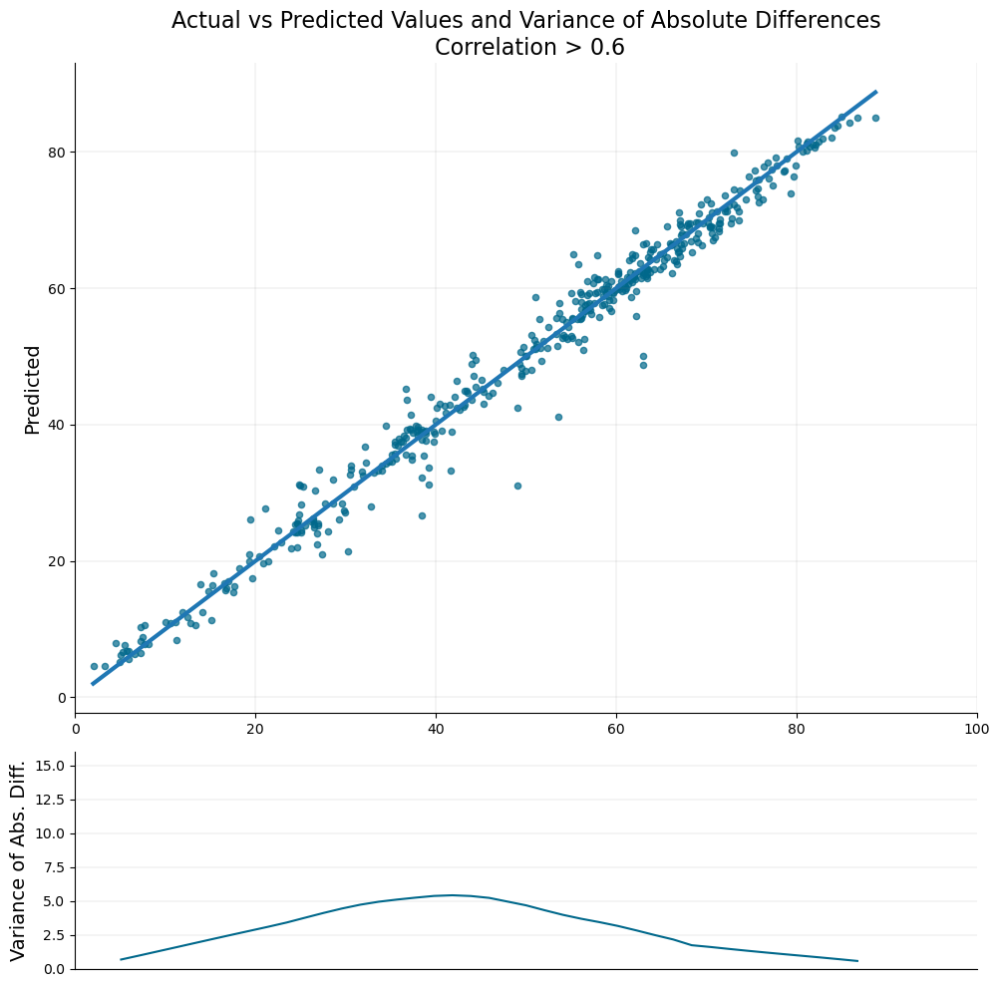

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
28it [00:00, 407.54it/s]



Model with correlation >= 0.7:
Training+Validation R^2: 0.98944, RMSE: 2.04887
Testing R^2: 0.97783, RMSE: 3.0056
Mean cross-validation score: 0.98092

          Feature  Importance
1   WB_CC_EST_avg      0.9738
2     CC_EST_prev      0.0243
0  NY_GNP_PCAP_CD      0.0019


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[2249 rows x 3 columns]


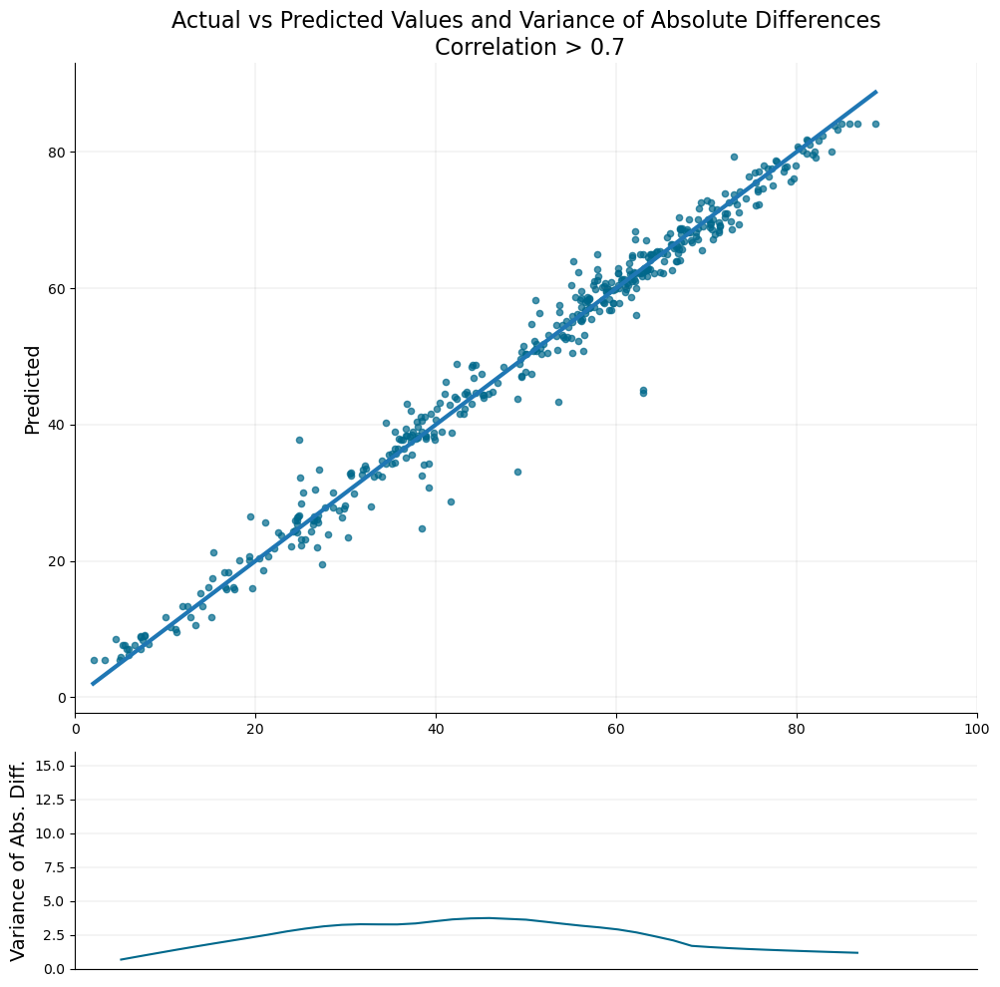

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
38it [00:00, 156.68it/s]



Model with correlation >= 0.8:
Training+Validation R^2: 0.98902, RMSE: 2.08932
Testing R^2: 0.97892, RMSE: 2.93073
Mean cross-validation score: 0.98086

         Feature  Importance
0  WB_CC_EST_avg      0.9679
1    CC_EST_prev      0.0321


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[2249 rows x 3 columns]


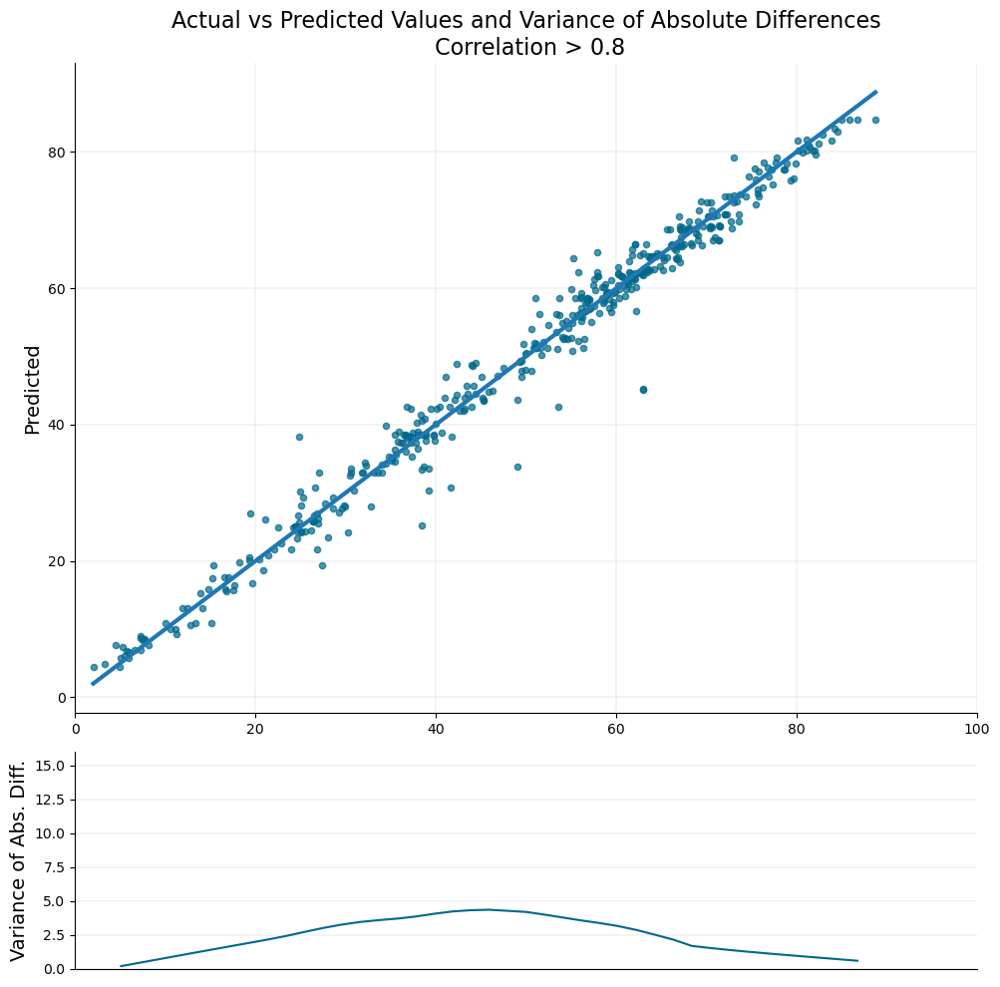

In [189]:
## TESTS ACROSS DIFFERENT CORRLATORY LEVELS


# Set the style to 'default' to make the background white
style.use('default')

# Replace 'vars_full' with your actual list of variables, excluding 'iso2c', 'country', and 'CC_EST'
vars_full = [var for var in df.columns if var not in ['iso2c', 'country', 'CC_EST']]

print("Running model on full dataset")
for i in range(0, 9):
    # Calculate the correlation of each variable with 'CC_EST'
    correl = df[vars_full].select_dtypes(include=['number']).corrwith(df['CC_EST']).abs()

    # Get the variables with a correlation greater than or equal to the threshold
    vars_correl = correl[correl >= 0.1 * i].index.tolist()

    results = build_and_evaluate_model(df, 'CC_EST', vars_correl, n_leads=2)

    print(f"\nModel with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
    print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
    print(f"Mean cross-validation score: {results[4]}\n")
    print(results[5])  # Feature importances
    print('\n')
    print(results[9][['country', 'year', 'CC_EST']])

    # Generate the graphs
    y_test = results[8]
    y_test_pred = results[7]

    # Create a scatter plot for the actual vs predicted values
    abs_diffs = np.abs(y_test - y_test_pred)

    # Create a DataFrame with the actual values and absolute differences
    df_plot = pd.DataFrame({'Actual': y_test, 'AbsDifference': abs_diffs})

    # Define the bins for the actual values
    bins = np.linspace(0, 100, 50)

    # Calculate the mid-points of the bins
    bin_midpoints = bins[:-1] + np.diff(bins) / 2

    # Create a new column for the binned actual values
    df_plot['ActualBin'] = pd.cut(df_plot['Actual'], bins, labels=bin_midpoints)

    # Group by the binned actual values and calculate the variance of the absolute differences for each group
    var_abs_diffs = df_plot.groupby('ActualBin')['AbsDifference'].var()

    # Create a scatter plot for the actual vs predicted values
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
    ax0 = plt.subplot(gs[0])
    ax0.scatter(y_test, y_test_pred, alpha=0.7, color='#00688B', s=20)
    ax0.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], lw=3)
    ax0.set_xlim([0, 100])
    ax0.set_ylabel('Predicted', fontsize=14)
    ax0.set_title(f'Actual vs Predicted Values and Variance of Absolute Differences\n Correlation > 0.{i}', fontsize=16)
    ax0.grid(True, color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

    # Create a line plot for the binned actual values vs variance of the absolute differences
    ax1 = plt.subplot(gs[1])

    # Apply LOESS to smooth the variance curve
    smoothed = lowess(var_abs_diffs, var_abs_diffs.index, frac=0.5)
    index, data = zip(*smoothed)
    ax1.plot(index, data, color='#00688B')

    ax1.set_ylim([0, 16])
    ax1.set_xlim([0, 100])
    ax1.set_ylabel('Variance of Abs. Diff.', fontsize=14)
    ax1.grid(axis='y', color='grey', linestyle='-', linewidth=0.25, alpha=0.5)
    
    ax1.set_xticklabels([])
    ax1.set_xticks([])
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    ax0.spines['right'].set_visible(False)
    ax0.spines['top'].set_visible(False)
    


    plt.tight_layout()
    plt.show()


0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
37it [00:00, 440.75it/s]



 Model with selected variables:
Training+Validation R^2: 0.9857, RMSE: 2.38414
Testing R^2: 0.95934, RMSE: 4.06987
Mean cross-validation score: 0.95222

             Feature  Importance
7        CC_EST_prev      0.8528
0     NY_GDP_PCAP_KD      0.0998
4        SE_SEC_DURS      0.0094
6  BX_KLT_DINV_CD_WD      0.0094
3     FP_CPI_TOTL_ZG      0.0086
2     NE_CON_GOVT_CD      0.0077
5        SI_POV_GINI      0.0066
1  SL_UEM_TOTL_NE_ZS      0.0057


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[2249 rows x 3 columns]


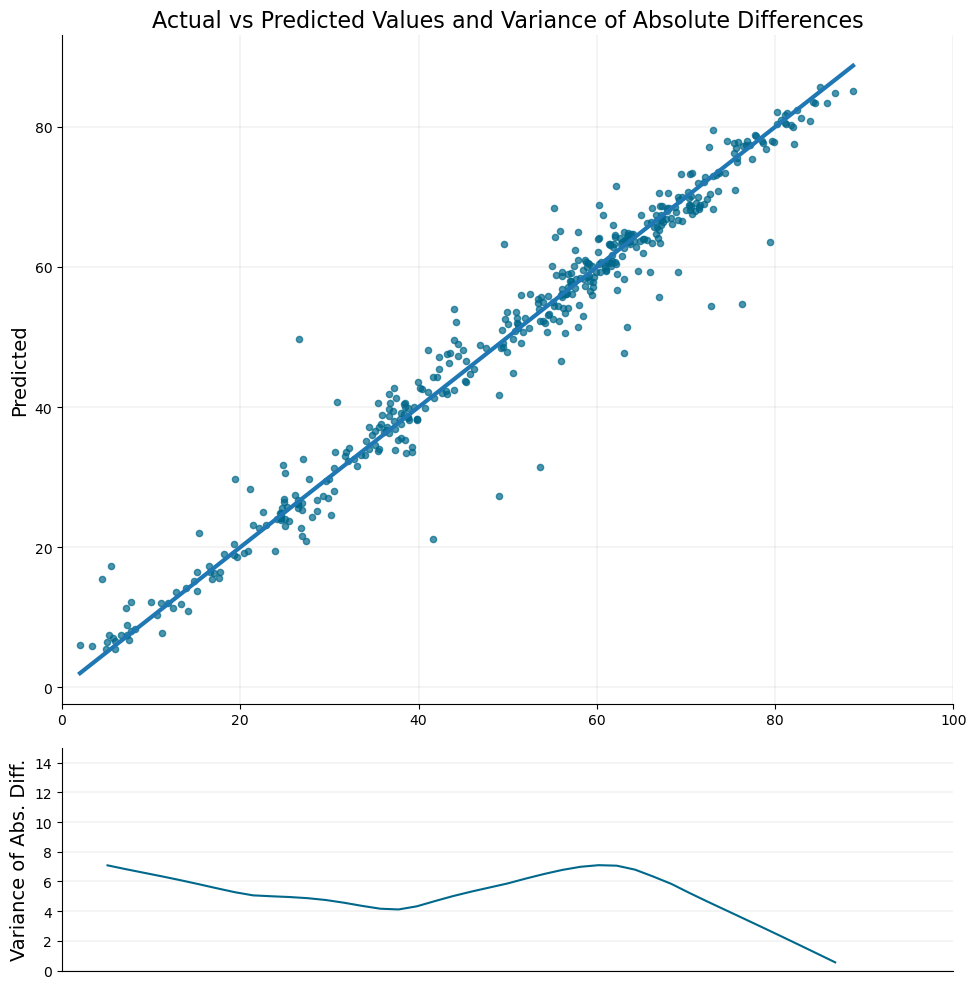

In [190]:
### TESTS FOR SELECTED VARIABLES -- The core variables that were used in the study


# Set the style to 'default' to make the background white
style.use('default')

# Manually selected variables
vars_selected = ['NY_GDP_PCAP_KD', 'SL_UEM_TOTL_NE_ZS', 'NE_CON_GOVT_CD', 'FP_CPI_TOTL_ZG', 'SE_SEC_DURS', 'SI_POV_GINI', 'BX_KLT_DINV_CD_WD']

# vars_selected = ['CC_EST_prev', 'WB_CC_EST_avg', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'SL_UEM_TOTL_NE_ZE', 'NE_CON_GOVT_CD', 'FP_CPI_TOTL_ZG', 'HD_HCI_LAYS', 'SI_POV_GINI', 'BX_KLT_DINV_CD_WD']

if 'CC_EST_prev' in vars_selected:
    vars_selected.remove('CC_EST_prev')

results = build_and_evaluate_model(df, 'CC_EST', vars_selected, n_leads=2)

print(f"\n Model with selected variables:")
print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
print(f"Mean cross-validation score: {results[4]}\n")
print(results[5])  # Feature importances
print('\n')
print(results[9][['country', 'year', 'CC_EST']])

# Generate the graphs
y_test = results[8]
y_test_pred = results[7]

# Create a scatter plot for the actual vs predicted values
abs_diffs = np.abs(y_test - y_test_pred)

# Create a DataFrame with the actual values and absolute differences
df_plot = pd.DataFrame({'Actual': y_test, 'AbsDifference': abs_diffs})

# Define the bins for the actual values
bins = np.linspace(0, 100, 50)

# Calculate the mid-points of the bins
bin_midpoints = bins[:-1] + np.diff(bins) / 2

# Create a new column for the binned actual values
df_plot['ActualBin'] = pd.cut(df_plot['Actual'], bins, labels=bin_midpoints)

# Group by the binned actual values and calculate the variance of the absolute differences for each group
var_abs_diffs = df_plot.groupby('ActualBin')['AbsDifference'].var()

# Create a scatter plot for the actual vs predicted values
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
ax0 = plt.subplot(gs[0])
ax0.scatter(y_test, y_test_pred, alpha=0.7, color='#00688B', s=20)
ax0.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], lw=3)
ax0.set_xlim([0, 100])  # Set the x-axis range
ax0.set_ylabel('Predicted', fontsize=14)
ax0.set_title('Actual vs Predicted Values and Variance of Absolute Differences', fontsize=16)
ax0.grid(True, color='grey', linestyle='-', linewidth=0.25, alpha=0.5)


# Create a line plot for the binned actual values vs variance of the absolute differences
ax1 = plt.subplot(gs[1])

# Apply LOESS to smooth the variance curve
smoothed = lowess(var_abs_diffs, var_abs_diffs.index, frac=0.5)
index, data = zip(*smoothed)
ax1.plot(index, data, color='#00688B')  # DeepSkyBlue4 color

ax1.set_ylim([0, 15])
ax1.set_xlim([0, 100])
ax1.set_ylabel('Variance of Abs. Diff.', fontsize=14)
ax1.grid(axis='y', color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

ax1.set_xticklabels([])
ax1.set_xticks([])
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax0.spines['right'].set_visible(False)
ax0.spines['top'].set_visible(False)

plt.tight_layout()
plt.show()

0it [00:00, ?it/s]

/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
34it [00:00, 422.24it/s]



 Model with selected variables:
Training+Validation R^2: 0.99312, RMSE: 1.65399
Testing R^2: 0.97812, RMSE: 2.98524
Mean cross-validation score: 0.98046

             Feature  Importance
0      WB_CC_EST_avg      0.9619
8        CC_EST_prev      0.0265
5        SE_SEC_DURS      0.0025
1     NY_GDP_PCAP_KD      0.0019
3     NE_CON_GOVT_CD      0.0017
6        SI_POV_GINI      0.0015
7  BX_KLT_DINV_CD_WD      0.0015
4     FP_CPI_TOTL_ZG      0.0013
2  SL_UEM_TOTL_NE_ZS      0.0011


        country  year     CC_EST
52      Andorra  2012  24.789383
53      Andorra  2013  24.929030
54      Andorra  2014  25.585828
55      Andorra  2015  26.963785
56      Andorra  2016  26.808882
...         ...   ...        ...
13729  Zimbabwe  2018  74.920013
13730  Zimbabwe  2019  75.423806
13731  Zimbabwe  2020  75.759847
13732  Zimbabwe  2021  75.071001
13733  Zimbabwe  2022  75.102789

[2249 rows x 3 columns]


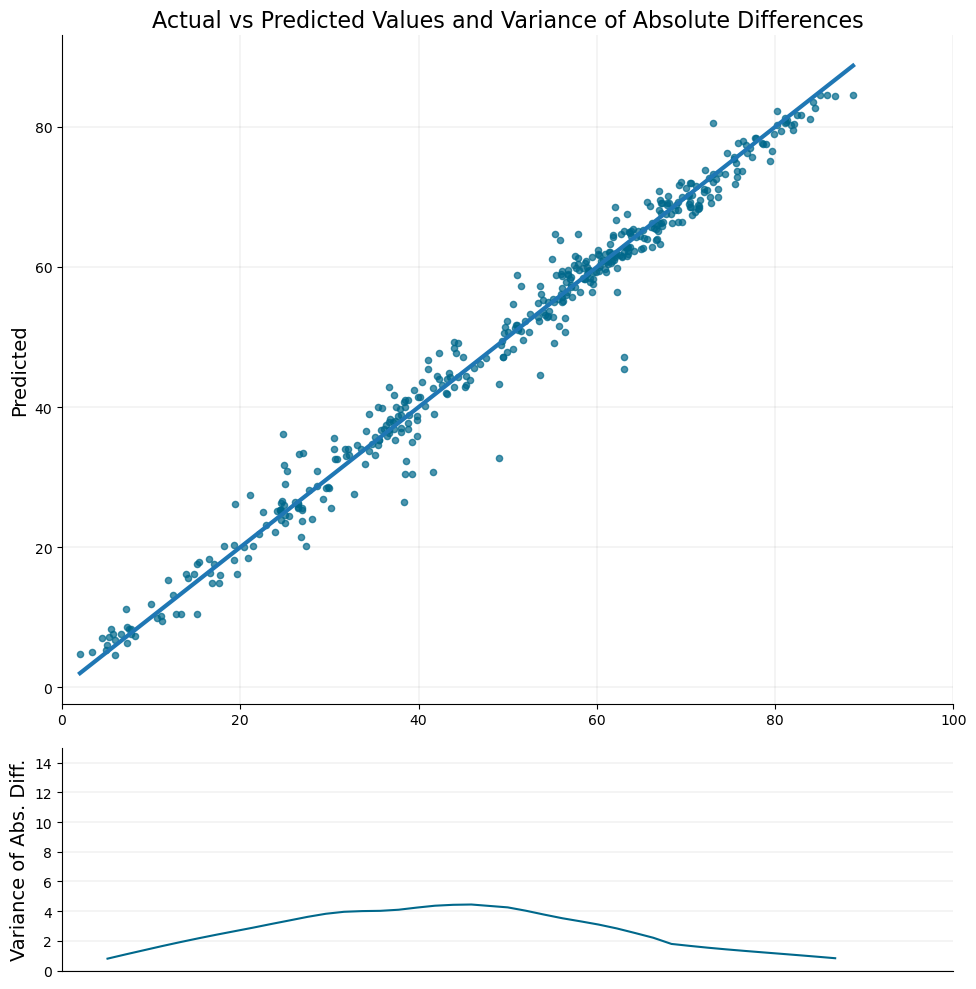

In [191]:
### TESTS FOR SELECTED VARIABLES


# Set the style to 'default' to make the background white
style.use('default')

# Manually selected variables
# vars_selected = ['NY_GDP_PCAP_KD', 'SL_UEM_TOTL_NE_ZS', 'NE_CON_GOVT_CD', 'FP_CPI_TOTL_ZG', 'SE_SEC_DURS', 'SI_POV_GINI', 'BX_KLT_DINV_CD_WD']

vars_selected = ['CC_EST_prev', 'WB_CC_EST_avg', 'NY_GDP_PCAP_KD', 'SL_UEM_TOTL_NE_ZS', 'NE_CON_GOVT_CD', 'FP_CPI_TOTL_ZG', 'SE_SEC_DURS', 'SI_POV_GINI', 'BX_KLT_DINV_CD_WD']

if 'CC_EST_prev' in vars_selected:
    vars_selected.remove('CC_EST_prev')

results = build_and_evaluate_model(df, 'CC_EST', vars_selected, n_leads=2)

print(f"\n Model with selected variables:")
print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
print(f"Mean cross-validation score: {results[4]}\n")
print(results[5])  # Feature importances
print('\n')
print(results[9][['country', 'year', 'CC_EST']])

# Generate the graphs
y_test = results[8]
y_test_pred = results[7]

# Create a scatter plot for the actual vs predicted values
abs_diffs = np.abs(y_test - y_test_pred)

# Create a DataFrame with the actual values and absolute differences
df_plot = pd.DataFrame({'Actual': y_test, 'AbsDifference': abs_diffs})

# Define the bins for the actual values
bins = np.linspace(0, 100, 50)

# Calculate the mid-points of the bins
bin_midpoints = bins[:-1] + np.diff(bins) / 2

# Create a new column for the binned actual values
df_plot['ActualBin'] = pd.cut(df_plot['Actual'], bins, labels=bin_midpoints)

# Group by the binned actual values and calculate the variance of the absolute differences for each group
var_abs_diffs = df_plot.groupby('ActualBin')['AbsDifference'].var()

# Create a scatter plot for the actual vs predicted values
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
ax0 = plt.subplot(gs[0])
ax0.scatter(y_test, y_test_pred, alpha=0.7, color='#00688B', s=20)
ax0.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], lw=3)
ax0.set_xlim([0, 100])  # Set the x-axis range
ax0.set_ylabel('Predicted', fontsize=14)
ax0.set_title('Actual vs Predicted Values and Variance of Absolute Differences', fontsize=16)
ax0.grid(True, color='grey', linestyle='-', linewidth=0.25, alpha=0.5)


# Create a line plot for the binned actual values vs variance of the absolute differences
ax1 = plt.subplot(gs[1])

# Apply LOESS to smooth the variance curve
smoothed = lowess(var_abs_diffs, var_abs_diffs.index, frac=0.5)
index, data = zip(*smoothed)
ax1.plot(index, data, color='#00688B')  # DeepSkyBlue4 color

ax1.set_ylim([0, 15])
ax1.set_xlim([0, 100])
ax1.set_ylabel('Variance of Abs. Diff.', fontsize=14)
ax1.grid(axis='y', color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

ax1.set_xticklabels([])
ax1.set_xticks([])
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax0.spines['right'].set_visible(False)
ax0.spines['top'].set_visible(False)

plt.tight_layout()
plt.show()

In [16]:
## TAKES c.4 MINUTES TO RUN
### TESTS FOR ALL VARIABLES



# Get the unique country codes
countries = df['iso2c'].unique()

# Create a new dataframe to store the results
df_new = pd.DataFrame()

# Get the variables for the model
vars_full = df.columns.tolist()
vars_full.remove('iso3c')
vars_full.remove('iso3n')
vars_full.remove('year')

# Remove 'CC_EST_prev' from vars_full if it's already included
if 'CC_EST_prev' in vars_full:
    vars_full.remove('CC_EST_prev')

# Train the model before getting the feature names
results = build_and_evaluate_model(df, 'CC_EST', vars_full)

# Get the trained model from the results
model = results[10]

# Get the feature names the model was trained on
model_features = model.get_booster().feature_names

# Iterate over each country
for country in tqdm(countries):
    # Get the data for the current country and create a copy of it
    df_country = df[df['iso2c'] == country].copy()

    # Add a new feature for the previous year's CC_EST value
    df_country['CC_EST_prev'] = df_country.groupby('iso2c')['CC_EST'].shift()

    # Sort the data in descending order of the year
    df_country = df_country.sort_values('year', ascending=False)

    # Get the latest year in the data
    latest_year = df_country['year'].max()

    # Skip the current country if all its 'year' values are NaN
    if np.isnan(latest_year):
        continue

    latest_year = int(latest_year)

    # Iterate from the latest year to 1950
    for year in range(latest_year, 1949, -1):
        # Check if CC_EST for the current year is NaN
        if df_country.loc[df_country['year'] == year, 'CC_EST'].isna().any():
            # If it is NaN, use the model to predict CC_EST for that year based on other values
            X = df_country.loc[df_country['year'] == year, model_features]
            
            # Forward fill missing values in X
            X = X.ffill()
            
            y_pred = model.predict(X)

            # Update the data with the predicted value
            df_country.loc[df_country['year'] == year, 'CC_EST'] = y_pred

    # Append the data for the current country to the new dataframe
    df_new = pd.concat([df_new, df_country])

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
60it [00:01, 35.46it/s]
100%|██████████| 218/218 [02:01<00:00,  1.79it/s]


In [17]:
# print the results of the build and evaluate model:
print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
print(f"Mean cross-validation score: {results[4]}\n")
print(results[5])  # Feature importances

Training+Validation R^2: 0.99941, RMSE: 0.4837
Testing R^2: 0.98036, RMSE: 2.82851
Mean cross-validation score: 0.98041

               Feature  Importance
303      WB_CC_EST_avg      0.8595
306        CC_EST_prev      0.0151
145     NY_GDP_PCAP_CN      0.0093
205  SP_POP_0014_FE_ZS      0.0075
206  SP_POP_0014_MA_IN      0.0060
..                 ...         ...
140     NY_GDP_MKTP_KD      0.0000
142     NY_GDP_MKTP_KN      0.0000
144     NY_GDP_PCAP_CD      0.0000
50      ER_FSH_PROD_MT      0.0000
0       AG_AGR_TRAC_NO      0.0000

[307 rows x 2 columns]


In [18]:
# Give a relative rank of CC_EST for each country in each year
df_new['CC_EST_rank'] = df_new.groupby('year')['CC_EST'].rank(pct=True)

# Give a rank of CC_EST for each country in each year as integers
df_new['CC_EST_rank_int'] = df_new.groupby('year')['CC_EST'].rank(method='dense', ascending=True)

In [19]:
# Append the new data of iso2c, year, CC_EST, CC_EST_rank, and CC_EST_rank_int to a new csv file
df_new[['iso2c', 'year', 'CC_EST', 'CC_EST_rank', 'CC_EST_rank_int']].to_csv('backcasted_corruption_data.csv', index=False)

In [20]:
# Print the mean, median, and range of predicted values for CC_EST in 1960, with the countries that have the highest and lowest values
# Get the mean, median, and range of predicted values for CC_EST in 1960
mean_1960 = round(df_new[df_new['year'] == 1960]['CC_EST'].mean(), 3)
median_1960 = round(df_new[df_new['year'] == 1960]['CC_EST'].median(), 3)
range_1960 = round(df_new[df_new['year'] == 1960]['CC_EST'].max() - df_new[df_new['year'] == 1960]['CC_EST'].min(), 3)

# Get the countries with the highest and lowest predicted values for CC_EST in 1960
highest_1960 = df_new[df_new['year'] == 1960].sort_values('CC_EST', ascending=False).iloc[0]['country']
lowest_1960 = df_new[df_new['year'] == 1960].sort_values('CC_EST').iloc[0]['country']

print(f"The mean predicted value for CC_EST in 1960 is {mean_1960}")
print(f"The median predicted value for CC_EST in 1960 is {median_1960}")
print(f"The range of predicted values for CC_EST in 1960 is {range_1960}")
print(f"The country with the highest predicted value for CC_EST in 1960 is {highest_1960} with a value of {df_new[df_new['year'] == 1960].sort_values('CC_EST', ascending=False).iloc[0]['CC_EST']}")
print(f"The country with the lowest predicted value for CC_EST in 1960 is {lowest_1960} with a value of {df_new[df_new['year'] == 1960].sort_values('CC_EST').iloc[0]['CC_EST']}")

The mean predicted value for CC_EST in 1960 is 51.858
The median predicted value for CC_EST in 1960 is 55.928
The range of predicted values for CC_EST in 1960 is 63.989
The country with the highest predicted value for CC_EST in 1960 is South Sudan with a value of 73.01355743408203
The country with the lowest predicted value for CC_EST in 1960 is Sweden with a value of 9.024733543395996


In [21]:
# Print the country that has gotten worse by the most and the country that has improved by the most
# Calculate the change in CC_EST for each country between 1960 and 2022
df_change = df_new.pivot(index='iso2c', columns='year', values='CC_EST')
df_change['change'] = df_change[2012] - df_change[1970]

# Get the country that has gotten worse by the most and the country that has improved by the most
most_improved = df_change['change'].idxmax()
most_worsened = df_change['change'].idxmin()

print(f"The country that has improved the most between 1970 and 2012 is {df_new[df_new['iso2c'] == most_improved].iloc[0]['country']} with a change of {df_change.loc[most_improved, 'change']}")
print(f"The country that has worsened the most between 1970 and 2012 is {df_new[df_new['iso2c'] == most_worsened].iloc[0]['country']} with a change of {df_change.loc[most_worsened, 'change']}")

# List worst to best
# Create a mapping of country codes to country names
country_mapping = df_new.set_index('iso2c')['country'].drop_duplicates()

# Map the country codes in df_change to country names
df_change['country'] = df_change.index.map(country_mapping)
# Sort df_change by 'change' in descending order and display the top 10
df_change.sort_values('change', ascending=True)[['country', 'change']].head(10)

The country that has improved the most between 1970 and 2012 is Somalia with a change of 15.701358786367194
The country that has worsened the most between 1970 and 2012 is Barbados with a change of -30.04481506083008


year,country,change
iso2c,,
BB,Barbados,-30.044815
CL,Chile,-27.740088
BS,"Bahamas, The",-25.729905
GL,Greenland,-21.831344
UY,Uruguay,-19.933293
QA,Qatar,-19.172745
KN,St. Kitts and Nevis,-18.669986
KY,Cayman Islands,-16.346680
FR,France,-15.648187


/var/folders/1z/rmhh3bk123qg9411_qfj88580000gn/T/ipykernel_9509/3095753270.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_filtered = df_new[(df_new['year'] >= 1960) & (df['year'] < 2012)]


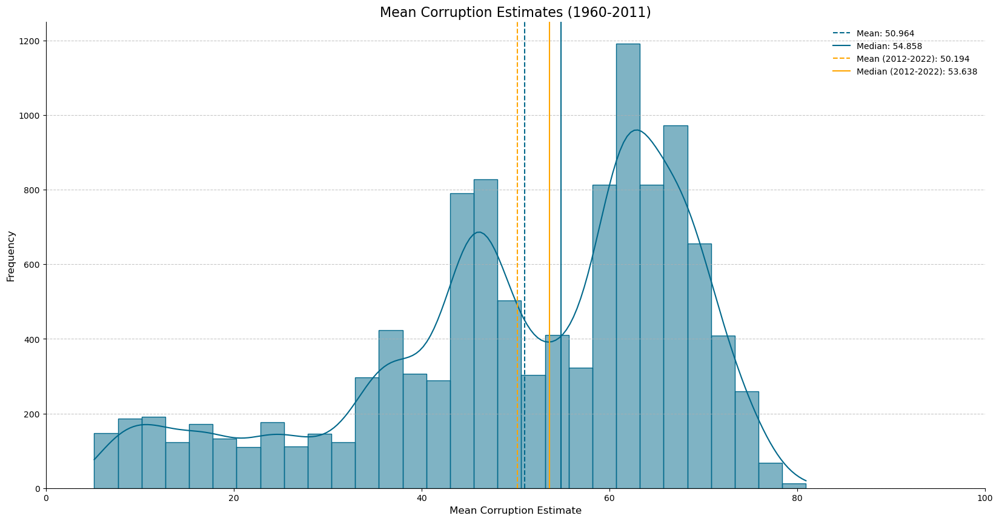

In [23]:
# Filter the DataFrame to include only the years between 1960 and 2011
df_filtered = df_new[(df_new['year'] >= 1960) & (df['year'] < 2012)]

plt.figure(figsize=(20, 10))
sns.histplot(df_filtered['CC_EST'], bins=30, color='#00688B', edgecolor='#00688B', kde=True)

# calculate the means of the corruption estimates between 2012 and 2022
mean_cc_est_2012_2022 = df_new[(df_new['year'] >= 2012) & (df_new['year'] <= 2022)].groupby('iso2c')['CC_EST'].mean()
median_cc_est_2012_2022 = df_new[(df_new['year'] >= 2012) & (df_new['year'] <= 2022)].groupby('iso2c')['CC_EST'].median()

mean_2012_2022 = mean_cc_est_2012_2022.mean()
median_2012_2022 = mean_cc_est_2012_2022.median()

# Calculate the mean and median
mean = df_filtered['CC_EST'].mean()
median = df_filtered['CC_EST'].median()

# Add lines for the mean and median
plt.axvline(mean, color='#00688B', linestyle='--', label=f'Mean: {mean:.3f}')
plt.axvline(median, color='#00688B', linestyle='-', label=f'Median: {median:.3f}')
plt.axvline(mean_2012_2022, color='orange', linestyle='--', label=f'Mean (2012-2022): {mean_2012_2022:.3f}')
plt.axvline(median_2012_2022, color='orange', linestyle='-', label=f'Median (2012-2022): {median_2012_2022:.3f}')

# Customize the title and labels
plt.title('Mean Corruption Estimates (1960-2011)', fontsize=16)
plt.xlabel('Mean Corruption Estimate', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xlim(0,100)


# Customize the grid
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(frameon=False)

# Remove the top and right spines
sns.despine()

plt.show()

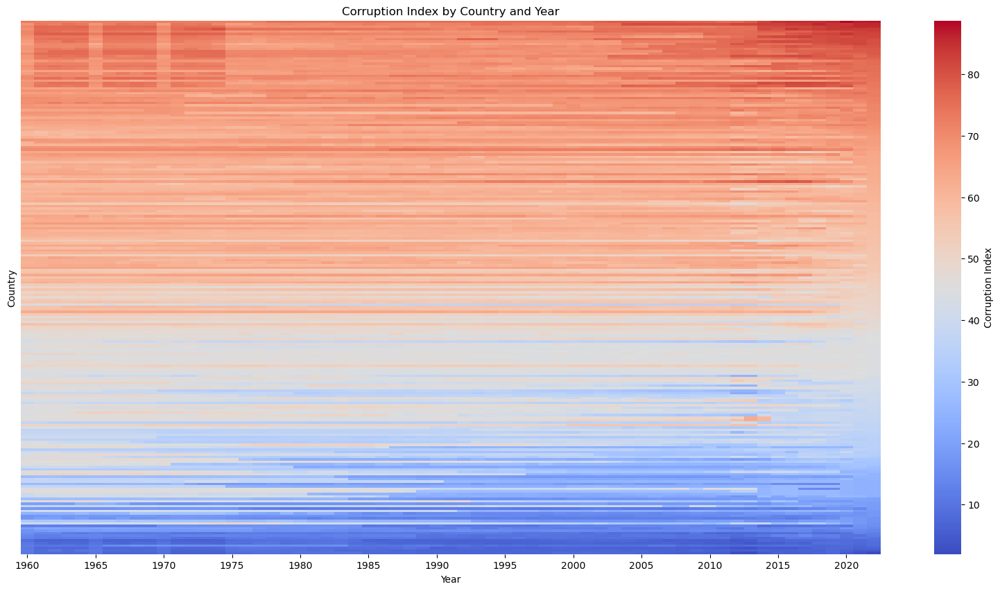

In [24]:
# Graphically illustrage the generale moves of country and corruption levels over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CC_EST')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, dont show country labels, and 1970 to 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Corruption Index'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

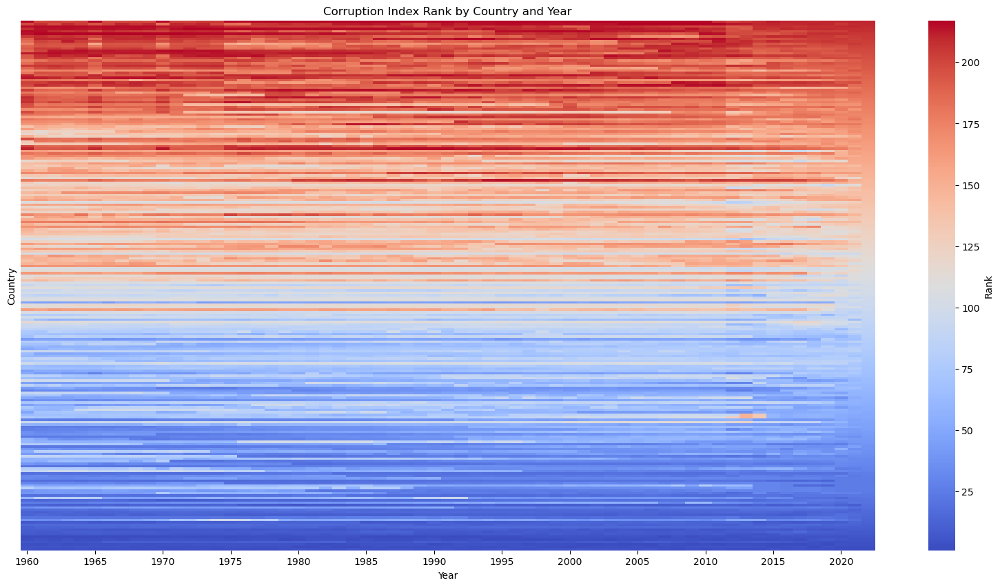

In [25]:
# Plot changes in country ranks over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CC_EST_rank_int')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, don't show country labels, and 1970 to 2022, ranking from lowest to highest in 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Rank'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index Rank by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

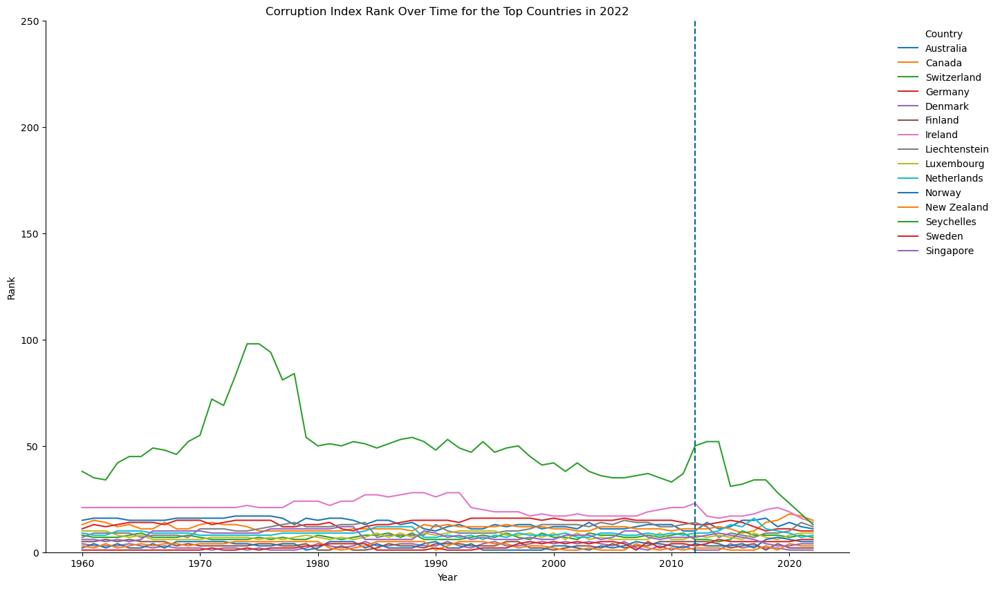

In [203]:
# Plot graph of CC_EST_rank_int for the top 10 countries with the highest rank in 2022
top_countries = df_heatmap[2022].sort_values(ascending=True).head(15).index

# Filter the data for the top 10 countries
df_top = df_new[df_new['country'].isin(top_countries)]

# Create a line plot of the rank over time for the top 10 countries
plt.figure(figsize=(15, 10))
sns.lineplot(data=df_top, x='year', y='CC_EST_rank_int', hue='country', palette='tab10')
plt.axvline(x=2012, color='#00688B', linestyle='--')
plt.title('Corruption Index Rank Over Time for the Top Countries in 2022')
plt.ylim(0, 250)
plt.xlabel('Year')
plt.ylabel('Rank')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
sns.despine()
plt.show()

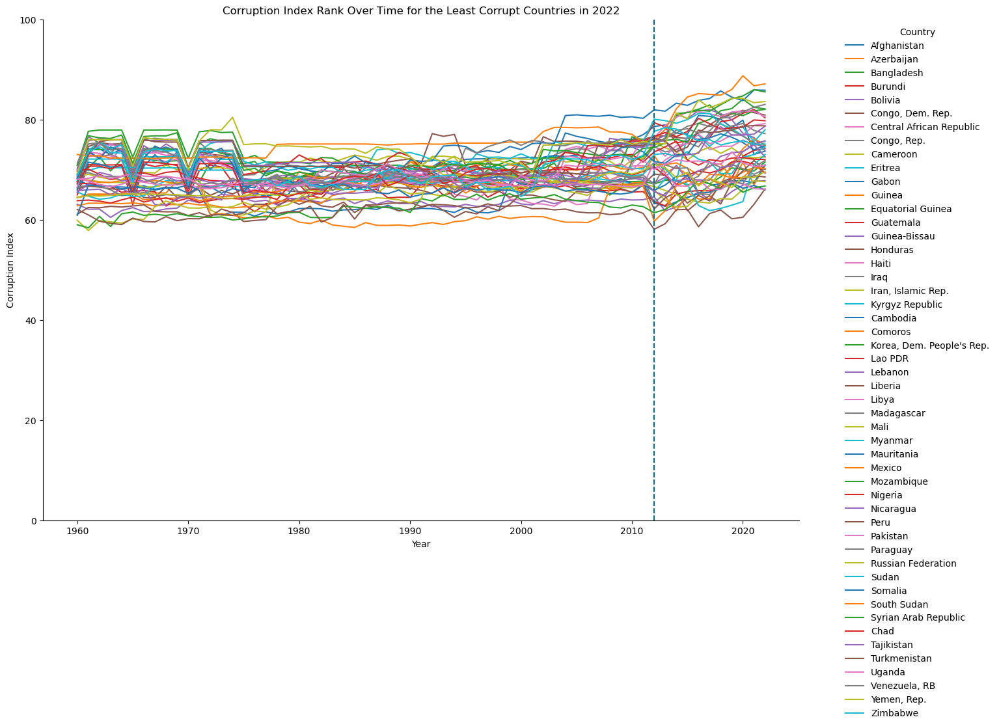

In [204]:
# Plot graph of CC_EST_rank_int for the top 10 countries with the highest rank in 2022
# Get the top 10 countries with the highest rank in 2022
top_countries = df_heatmap[2022].sort_values(ascending=False).head(50).index

# Filter the data for the top 10 countries
df_top = df_new[df_new['country'].isin(top_countries)]

# Create a line plot of the rank over time for the top 10 countries
plt.figure(figsize=(15, 10))
sns.lineplot(data=df_top, x='year', y='CC_EST', hue='country', palette='tab10')
plt.axvline(x=2012, color='#00688B', linestyle='--')
plt.ylim(0, 100)
plt.title('Corruption Index Rank Over Time for the Least Corrupt Countries in 2022')
plt.xlabel('Year')
plt.ylabel('Corruption Index')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
sns.despine()
plt.show()

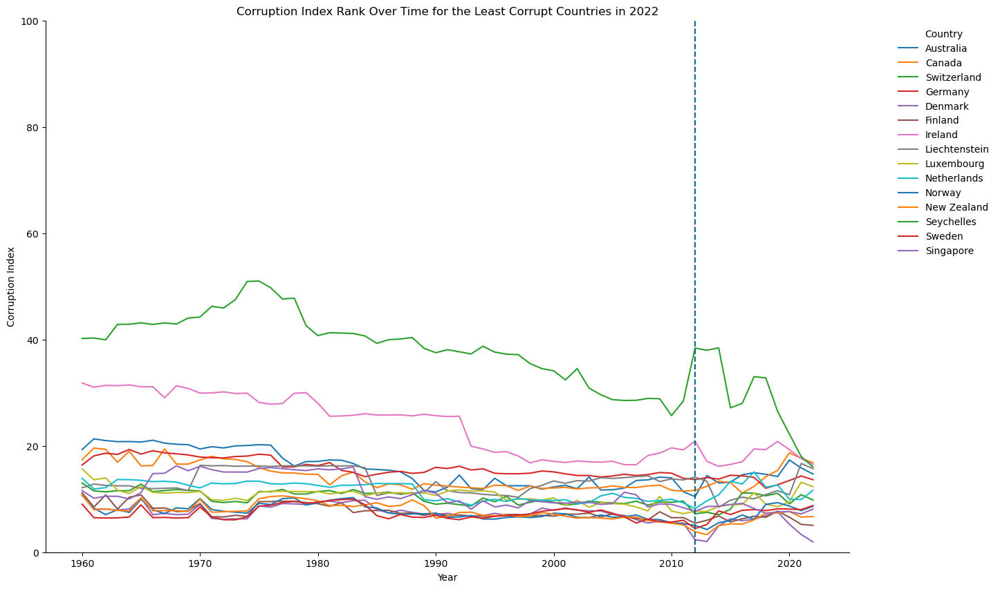

In [205]:
# Plot graph of CC_EST_rank_int for the top 10 countries with the highest rank in 2022
# Get the top 10 countries with the highest rank in 2022
top_countries = df_heatmap[2022].sort_values(ascending=True).head(15).index

# Filter the data for the top 10 countries
df_top = df_new[df_new['country'].isin(top_countries)]

# Create a line plot of the rank over time for the top 10 countries
plt.figure(figsize=(15, 10))
sns.lineplot(data=df_top, x='year', y='CC_EST',hue='country', palette='tab10')
plt.axvline(x=2012, color='#00688B', linestyle='--')
plt.ylim(0, 100)
plt.title('Corruption Index Rank Over Time for the Least Corrupt Countries in 2022')
plt.xlabel('Year')
plt.ylabel('Corruption Index')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
sns.despine()
plt.show()

In [26]:
# create df_new_morphed that is df with cc_est replaced with CC_EST from df_new
df_new_morphed = df.copy()
df_new_morphed['CC_EST'] = df_new['CC_EST']

# Add columns for CC_EST_rank and CC_EST_rank_int
df_new_morphed['CC_EST_rank'] = df_new['CC_EST_rank']
df_new_morphed['CC_EST_rank_int'] = df_new['CC_EST_rank_int']

# Save the morphed data to a new CSV file
df_new_morphed.to_csv('df_model3.csv', index=False)

In [207]:
results[5]

,Feature,Importance
303,WB_CC_EST_avg,0.8595
306,CC_EST_prev,0.0151
145,NY_GDP_PCAP_CN,0.0093
205,SP_POP_0014_FE_ZS,0.0075
206,SP_POP_0014_MA_IN,0.0060
214,SP_POP_1519_FE_5Y,0.0024
121,NY_ADJ_DFOR_CD,0.0022
287,TM_VAL_MRCH_WL_CD,0.0021
158,NY_GNP_PCAP_CN,0.0020
246,SP_POP_65UP_TO,0.0019


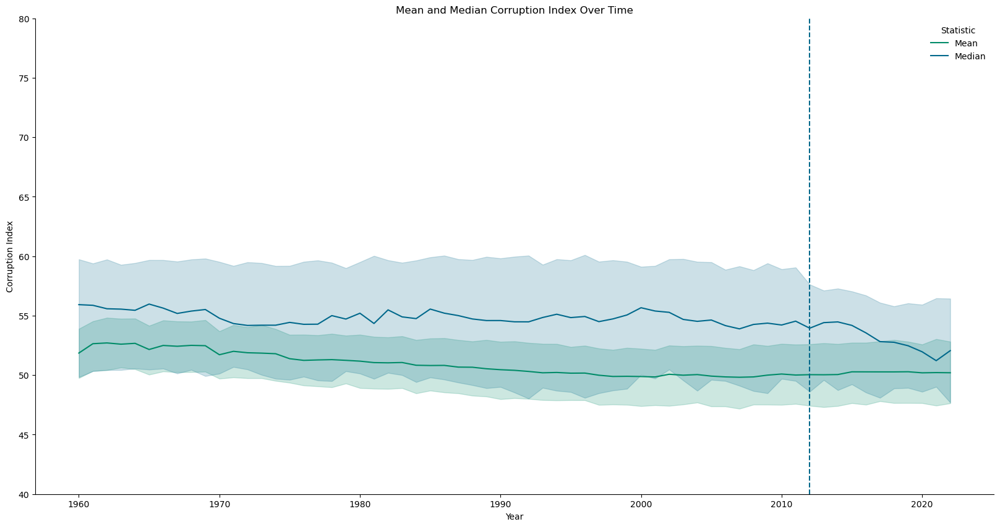

In [208]:
# Plot the aggregate mean and median CC_EST values (all countries together) over time in a line graph
# Create a line plot of the mean and median CC_EST values over time
plt.figure(figsize=(20, 10))
sns.lineplot(data=df_new, x='year', y='CC_EST', estimator='mean', label='Mean', color = '#008B68')
sns.lineplot(data=df_new, x='year', y='CC_EST', estimator='median', label='Median', color = '#00688B')
plt.axvline(x=2012, color='#00688B', linestyle='--')
plt.title('Mean and Median Corruption Index Over Time')
plt.xlabel('Year')
plt.ylabel('Corruption Index')
plt.ylim(40,80)
plt.legend(title='Statistic', frameon=False)
sns.despine()
plt.show()


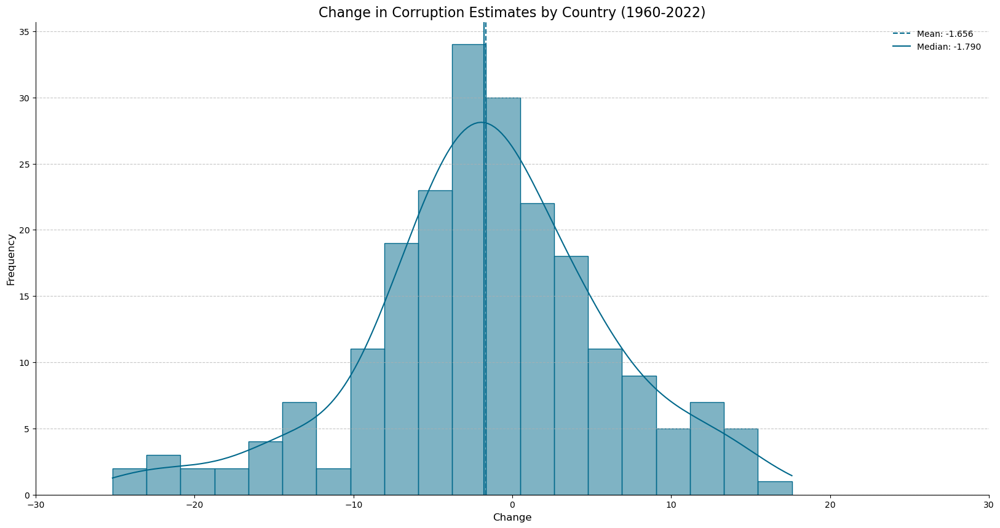

In [209]:
# Filter the DataFrame to include only the years 1960 and 2022
df_filtered = df_new[df_new['year'].isin([1960, 2022])]

# Pivot the DataFrame to have one row per country and one column per year
df_pivot = df_filtered.pivot(index='country', columns='year', values='CC_EST')

# Calculate the change from 1960 to 2022 for each country
df_pivot['change'] = df_pivot[2022] - df_pivot[1960]

# Plot a histogram of the change in CC_EST
plt.figure(figsize=(20, 10))
sns.histplot(df_pivot['change'], bins=20, color='#00688B', edgecolor='#00688B', kde=True)

# Calculate the mean and median
mean = df_pivot['change'].mean()
median = df_pivot['change'].median()

# Add lines for the mean and median
plt.axvline(mean, color='#00688B', linestyle='--', label=f'Mean: {mean:.3f}')
plt.axvline(median, color='#00688B', linestyle='-', label=f'Median: {median:.3f}')

# Customize the title and labels
plt.title('Change in Corruption Estimates by Country (1960-2022)', fontsize=16)
plt.xlabel('Change', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xlim(-30,30)

# Customize the grid
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(frameon=False)

# Remove the top and right spines
sns.despine()

plt.show()

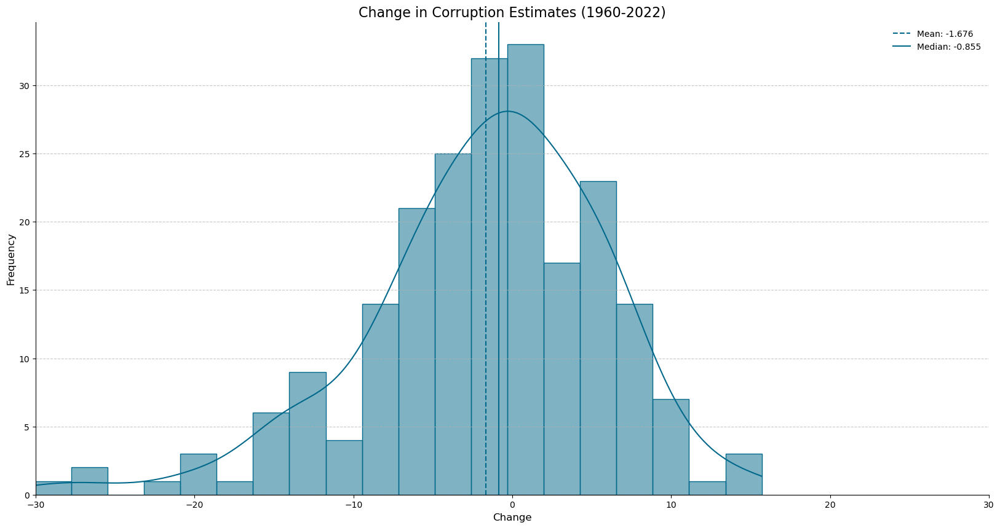

In [210]:
# Plot a histogram of the average yearly change in CC_EST
plt.figure(figsize=(20, 10))
sns.histplot(df_change['change'], bins=20,color='#00688B', edgecolor='#00688B', kde=True)

# Calculate the mean and median
mean = df_change['change'].mean()
median = df_change['change'].median()

# Add lines for the mean and median
plt.axvline(mean, color='#00688B', linestyle='--', label=f'Mean: {mean:.3f}')
plt.axvline(median, color='#00688B', linestyle='-', label=f'Median: {median:.3f}')

# Customize the title and labels
plt.title('Change in Corruption Estimates (1960-2022)', fontsize=16)
plt.xlabel('Change', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xlim(-30,30)

# Customize the grid
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(frameon=False)

# Remove the top and right spines
sns.despine()

plt.show()

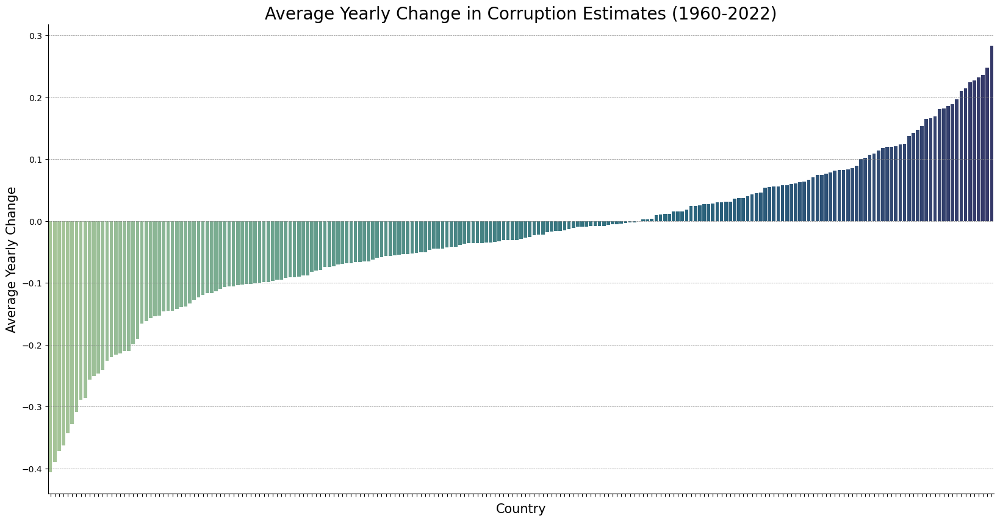

In [211]:
# Calculate the average change in CC_EST between years
df_change = df_new.pivot(index='iso2c', columns='year', values='CC_EST')
df_change['change'] = (df_change[2022] - df_change[1960]) / (2022 - 1960)

# Sort the DataFrame in ascending order by 'change'
df_change = df_change.sort_values(by='change')

fig, ax = plt.subplots(figsize=(20, 10))

sns.barplot(x=df_change.index, y='change', data=df_change, ax=ax, palette = 'crest')

ax.set_title('Average Yearly Change in Corruption Estimates (1960-2022)', fontsize=20)
ax.set_xlabel('Country', fontsize=15)
ax.set_ylabel('Average Yearly Change', fontsize=15)

ax.set_xticklabels([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.grid(color='gray', linestyle='--', linewidth=0.5, axis='y')

plt.show()

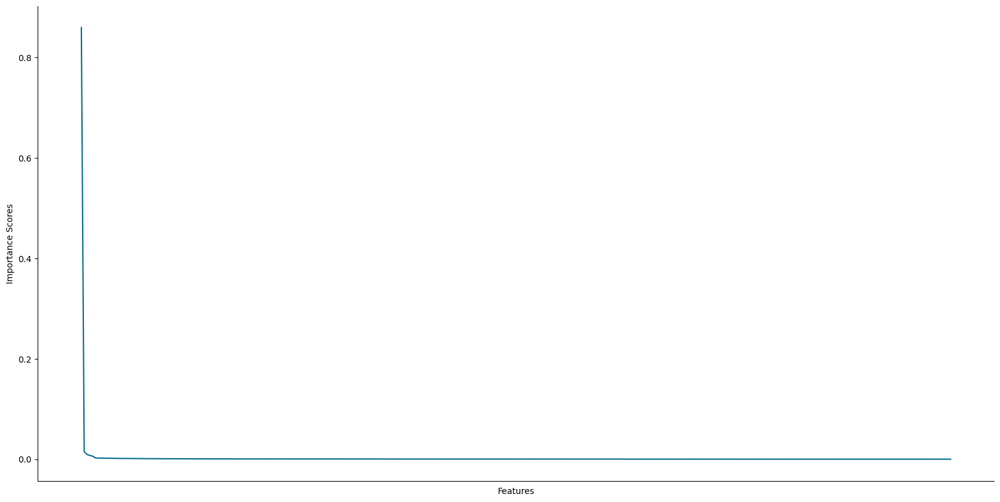

In [212]:
# Convert the list of tuples to a dictionary
importances_dict = results[5].set_index('Feature')['Importance'].to_dict()

# Extract feature names
features = list(importances_dict.keys())

# Since all values are already floats, there's no need to calculate the mean
importance_scores = list(importances_dict.values())

# Create a 2D line plot
fig, ax = plt.subplots(figsize=(20, 10))

# Create a sequence of numbers for the x-axis
x = np.arange(len(features))

# Create the 2D line plot
ax.plot(x, importance_scores, color='#00688B')

# Set the ticks on the x-axis to be the new labels and remove the lines (ticks)
ax.set_xticks(x, minor=False)
ax.set_xticklabels([])
ax.tick_params(axis='x', which='both', length=0)

# Set labels
ax.set_xlabel('Features')
ax.set_ylabel('Importance Scores')

sns.despine()

# Show the plot
plt.show()

In [213]:
countries = df['iso2c'].unique()

vars_full = df.columns.tolist()
vars_full.remove('iso3c')
vars_full.remove('iso3n')
vars_full.remove('year')

### TAKES AROUND 3 MINUTES
# Calculate the absolute correlation of each variable with the target variable
# Ensure that all columns in df are numeric
df_numeric = df[vars_full].apply(pd.to_numeric, errors='coerce')

# Calculate the absolute correlation of each variable with the target variable
correl = df_numeric.corrwith(df['CC_EST']).abs()

# Sort the variables by their correlation with the target variable
vars_sorted = correl.sort_values(ascending=False).index.tolist()

results = []
tree_depths = []
r2_scores = []

# Set the maximum number of variables to 10 or the total number of variables, whichever is smaller
max_vars = min(100, len(vars_sorted))


class TqdmCallback(xgb.callback.TrainingCallback):
    def __init__(self, bar):
        self._bar = bar

    def after_iteration(self, model, epoch, evals_log):
        self._bar.update(1)
        return False

# Create a progress bar
with tqdm(total=max_vars) as pbar:
    model = XGBRegressor(
        objective='reg:squarederror',
        random_state=0,
        alpha=1.0,
        reg_lambda=10.0,
        early_stopping_rounds=10,
        callbacks=[TqdmCallback(pbar)]
    )


# Create a progress bar
with tqdm(total=max_vars) as pbar:
    # Iterate over the number of variables to include in the model
    for i in range(1, max_vars + 1):
        # Select the top i variables
        vars_selected = vars_sorted[:i]

        # Build and evaluate the model with the selected variables
        try:
            result = build_and_evaluate_model(df, 'CC_EST', vars_selected, n_leads=2)
        except Exception as e:
            print(f"Error while building model with variables {vars_selected}: {e}")
            continue

        # Store the result
        results.append(result)

        # Access the R^2 score for the test set
        r2_test = result[1]

        # Store the R^2 score
        r2_scores.append(r2_test)

        # Access the model object, which is assumed to be the last element in the tuple
        model = result[10]

        # Retrieve the 'max_depth' parameter from the model's parameters
        tree_depth = model.get_params().get('max_depth', 'Not set')

        # Store the tree depth
        tree_depths.append(tree_depth)

        # Update the progress bar description
        pbar.set_description(f"Number of variables: {i}, R^2: {r2_test:.2f}, Tree Depth: {tree_depth}")

        # Update the progress bar
        pbar.update()

  0%|          | 0/100 [00:00<?, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
49it [00:00, 1203.05it/s]
Number of variables: 1, R^2: 0.88, Tree Depth: None:   1%|          | 1/100 [00:00<00:21,  4.51it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
38it [00:00, 1056.81it/s]
Number of variables: 2, R^2: 0.98, Tree Depth: None:   2%|▏         | 2/100 [00:00<00:20,  4.85it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` 

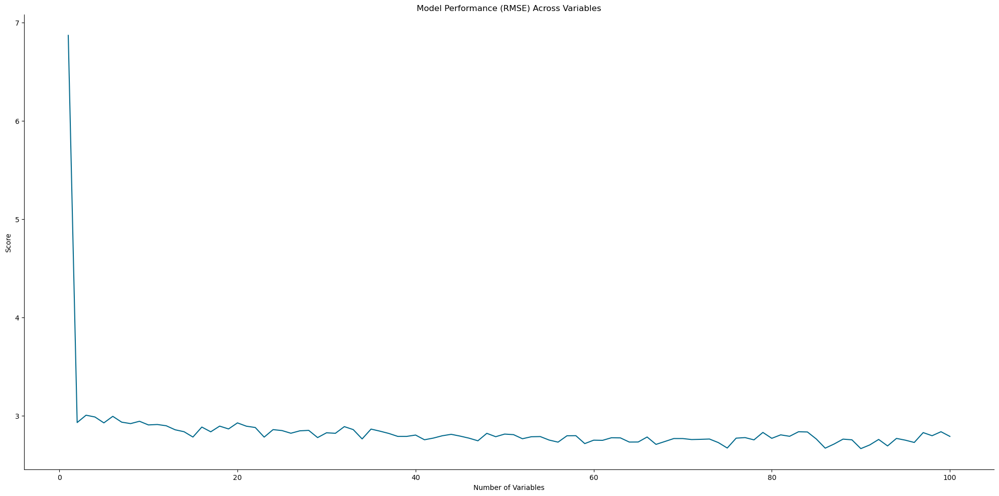

In [214]:
# Plot
fig, ax = plt.subplots(figsize=(20, 10))

# Line plot of R^2 and RMSE across different thresholds
r2_scores = [res[1] for res in results]
rmse_scores = [res[3] for res in results]
num_vars = range(1, max_vars + 1)
ax.plot(num_vars, rmse_scores, color = '#00688B')
ax.set_xlabel('Number of Variables')
ax.set_ylabel('Score')
ax.set_title('Model Performance (RMSE) Across Variables')
sns.despine()

plt.tight_layout()
plt.show()

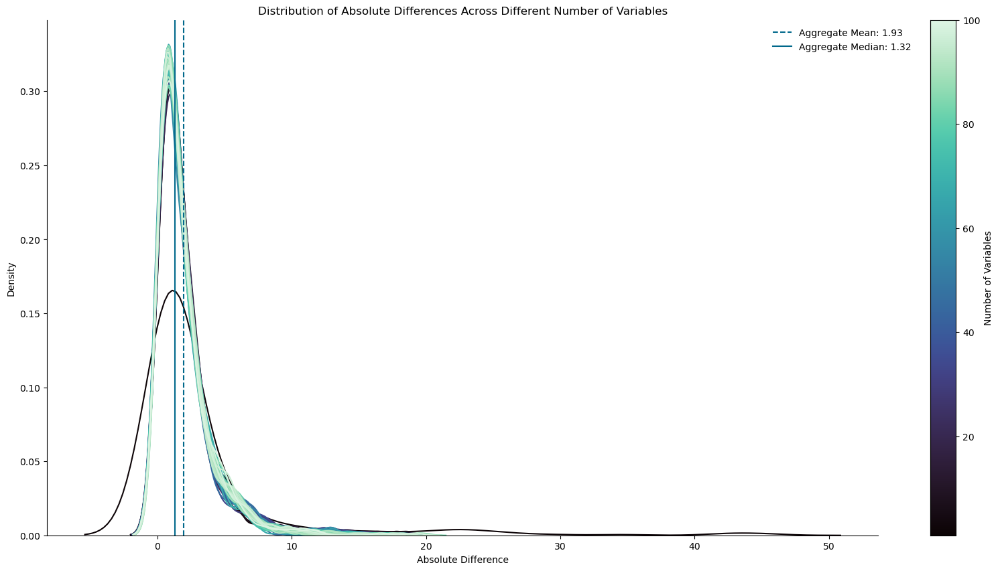

In [215]:
# Calculate the absolute differences for each model
abs_diffs = [abs(res[7] - res[8]) for res in results]

# Create a new subplot for the variance plot
fig, ax = plt.subplots(figsize=(20, 10))

# Get a color map
colors = sns.color_palette("mako", len(abs_diffs))

# KDE plot of the absolute differences for each model
for i, abs_diff in enumerate(abs_diffs):
    sns.kdeplot(abs_diff, color=colors[i], ax=ax)

# Calculate the aggregate mean and median of the absolute differences
mean_abs_diff = np.mean([np.mean(abs_diff) for abs_diff in abs_diffs])
median_abs_diff = np.median([np.median(abs_diff) for abs_diff in abs_diffs])

# Add a vertical line at the aggregate mean and median
ax.axvline(mean_abs_diff, color='#00688B', linestyle='--', label=f'Aggregate Mean: {mean_abs_diff:.2f}')
ax.axvline(median_abs_diff, color='#00688B', linestyle='-', label=f'Aggregate Median: {median_abs_diff:.2f}')

ax.set_xlabel('Absolute Difference')
ax.set_title('Distribution of Absolute Differences Across Different Number of Variables')

# Create a colorbar
norm = Normalize(vmin=1, vmax=len(abs_diffs))
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=sns.color_palette("mako", as_cmap=True)), ax=ax)
cbar.set_label('Number of Variables')

ax.legend(bbox_to_anchor=(1.05, 1), frameon=False)
sns.despine()

plt.show()

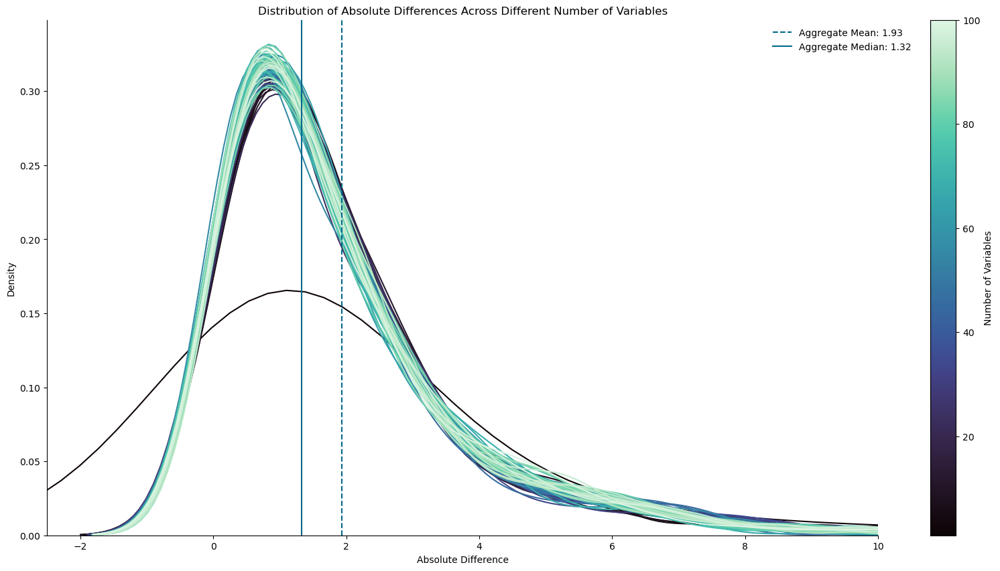

In [216]:
import seaborn as sns

# Calculate the absolute differences for each model
abs_diffs = [abs(res[7] - res[8]) for res in results]

# Create a new subplot for the variance plot
fig, ax = plt.subplots(figsize=(20, 10))

# Get a color map
colors = sns.color_palette("mako", len(abs_diffs))

# KDE plot of the absolute differences for each model
for i, abs_diff in enumerate(abs_diffs):
    sns.kdeplot(abs_diff, color=colors[i], ax=ax)

# Calculate the aggregate mean and median of the absolute differences
mean_abs_diff = np.mean([np.mean(abs_diff) for abs_diff in abs_diffs])
median_abs_diff = np.median([np.median(abs_diff) for abs_diff in abs_diffs])

# Add a vertical line at the aggregate mean and median
ax.axvline(mean_abs_diff, color='#00688B', linestyle='--', label=f'Aggregate Mean: {mean_abs_diff:.2f}')
ax.axvline(median_abs_diff, color='#00688B', linestyle='-', label=f'Aggregate Median: {median_abs_diff:.2f}')

ax.set_xlabel('Absolute Difference')
ax.set_title('Distribution of Absolute Differences Across Different Number of Variables')
ax.set_xlim(-2.5,10)

# Create a colorbar
norm = Normalize(vmin=1, vmax=len(abs_diffs))
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=sns.color_palette("mako", as_cmap=True)), ax=ax)
cbar.set_label('Number of Variables')

ax.legend(bbox_to_anchor=(1.05, 1), frameon=False)
sns.despine()

plt.show()

/var/folders/1z/rmhh3bk123qg9411_qfj88580000gn/T/ipykernel_37400/1067117465.py:27: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Number of Variables')


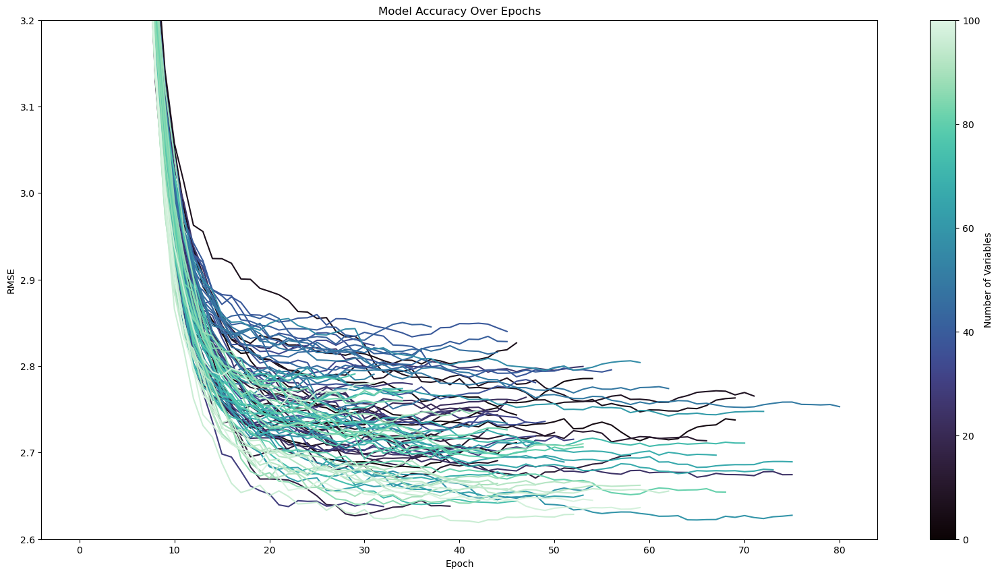

In [217]:
# Create a new subplot for the scatter plot
fig, ax = plt.subplots(figsize=(20, 10))

# Create a colormap
cmap = sns.color_palette("mako", as_cmap=True)

# Calculate the number of lines to plot
num_lines = len(results)

# Scatter plot of the model accuracy over epochs for all models
for i, res in enumerate(results):
    # Calculate the color for the current line
    color = cmap(i / num_lines)
    
    ax.plot(range(len(res[10].evals_result()['validation_0']['rmse'])), 
            res[10].evals_result()['validation_0']['rmse'], 
            label=f'{len(res[5])} variables', 
            color=color)
    
ax.set_xlabel('Epoch')
ax.set_ylabel('RMSE')
ax.set_title('Model Accuracy Over Epochs')
ax.set_ylim(2.6, 3.2)

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=num_lines))
plt.colorbar(sm, label='Number of Variables')

plt.show()

In [218]:
def custom_objective(y_true, y_pred):
    """
    Custom objective function that penalizes predictions close to or beyond the bounds of 0 and 100,
    penalizes large changes from the previous year's prediction, and penalizes an overall movement greater than 20 from the 2012 value.
    Also penalizes the overreliance on the 'CPI_EST_avg' feature.
    """
    # Convert y_true and y_pred to pandas Series
    y_true = pd.Series(y_true)
    y_pred = pd.Series(y_pred)
    
    # Calculate the squared error
    squared_error = (y_true - y_pred) ** 2
    
    # Calculate the penalty term for the overreliance on the 'CPI_EST_avg' feature
    penalty_CPI_EST_avg = np.abs(y_pred)
    
    # Increase the penalty for the overreliance on the 'CPI_EST_avg' feature
    penalty_CPI_EST_avg *= 100
    
    # Add the penalty terms to the squared error
    penalized_squared_error = squared_error + penalty_CPI_EST_avg
    
    # Calculate the first derivative (gradient) of the penalized squared error
    grad = -2 * (y_true - y_pred) + np.sign(y_pred)
    
    # Calculate the second derivative (Hessian) of the penalized squared error
    hess = np.ones_like(grad) * 2
    
    return grad, hess

class TqdmCallback(xgb.callback.TrainingCallback):
    def __init__(self, bar):
        self._bar = bar

    def after_iteration(self, model, epoch, evals_log):
        self._bar.update(1)
        return False

def build_and_evaluate_model(df, target_col_name, var_list, n_leads=2, max_depth=None):
    """
    Builds, evaluates, and returns results for an XGBoost model.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df = df.copy()

    # Exclude 'iso2c', 'country', target_col_name, and lead variables from var_list
    var_list = [var for var in var_list if var not in ['iso2c', 'country', target_col_name, 'year', 'iso3n'] + [f"{target_col_name}_lead{i}" for i in range(1, n_leads + 1)]]
    if 'WB_CC_EST_avg' not in var_list:
        var_list.append('WB_CC_EST_avg')
    
    # Remove rows with invalid values in the target column
    df = df[np.isfinite(df[target_col_name]) & (abs(df[target_col_name]) <= 1e30)]

    # Add a new feature for the previous year's target value
    df[target_col_name + '_prev'] = df.groupby('iso2c')[target_col_name].shift()
    var_list.append(target_col_name + '_prev')

    X = df[var_list]

    df_train_val, df_test = train_test_split(df, test_size=0.1, random_state=0)

    x_train_val, x_test, y_train_val, y_test = train_test_split(X, df[target_col_name], test_size=0.1, random_state=0)

    # Use the custom objective function in the XGBoost model
    model = XGBRegressor(
        objective=custom_objective,
        random_state=0,
        alpha=1.0,
        reg_lambda=10.0,
        early_stopping_rounds=10,
        max_depth=max_depth,
        gamma=2.0
    )

    with tqdm(total=model.get_params()['n_estimators']) as pbar:
        model.fit(
            x_train_val,
            y_train_val,
            eval_set=[(x_test, y_test)],
            verbose=False,
            callbacks=[TqdmCallback(pbar)]
        )

    y_train_val_pred = model.predict(x_train_val)
    y_test_pred = model.predict(x_test)

    # Clip the predictions to be within the desired range
    y_train_val_pred = np.clip(y_train_val_pred, 0, 100)
    y_test_pred = np.clip(y_test_pred, 0, 100)

    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    cv_scores = custom_cross_val_score(model, x_train_val, y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)

    # Get the feature importances
    feature_importances = model.feature_importances_

    # Get the feature names from x_lead
    feature_names = x_train_val.columns.tolist()

    # Align feature importances with feature names
    feature_importances_aligned = pd.Series(feature_importances, index=feature_names)    

    # Create a DataFrame with the aligned feature importances
    feature_importances_df = pd.DataFrame({
        'Feature': feature_importances_aligned.index,
        'Importance': np.round(feature_importances_aligned.values, 4)
    }).sort_values(by='Importance', ascending=False)


    return r2_train_val, r2_test, rmse_train_val, rmse_test, mean_cv_score, feature_importances_df, x_test.index, y_test_pred, y_test, df, model

In [219]:
### TAKES c.12 minutes!

# Assuming df is your DataFrame and build_and_evaluate_model is a defined function
# Assuming vars_full is a list of column names in df

# Select the full set of variables
vars_selected = df[vars_full].columns.tolist()

# Define max depth values to test
max_depth_values = list(range(1, 21))

# Initialize lists to store R^2 scores for training and test sets
train_r2_scores = []
test_r2_scores = []

# Create a progress bar
with tqdm(total=len(max_depth_values)) as pbar:
    # Iterate over each max_depth value
    for max_depth in max_depth_values:
        # Build and evaluate the model with the full set of variables and current max_depth
        try:
            result = build_and_evaluate_model(df, 'CC_EST', vars_selected, n_leads=2, max_depth=max_depth)
        except Exception as e:
            print(f"Error while building model at max_depth {max_depth}: {e}")
            continue

        # Access the R^2 scores for the training and test sets
        r2_train = result[0]
        r2_test = result[1]

        # Store the R^2 scores
        train_r2_scores.append(r2_train)
        test_r2_scores.append(r2_test)

        # Update the progress bar description
        pbar.set_description(f"Max Depth: {max_depth}, Train R^2: {r2_train:.2f}, Test R^2: {r2_test:.2f}")

        # Update the progress bar
        pbar.update()


  0%|          | 0/20 [00:00<?, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
100it [00:00, 181.07it/s]
Max Depth: 1, Train R^2: 0.98, Test R^2: 0.96:   5%|▌         | 1/20 [00:02<00:55,  2.94s/it]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
100it [00:00, 125.68it/s]
Max Depth: 2, Train R^2: 0.99, Test R^2: 0.97:  10%|█         | 2/20 [00:08<01:21,  4.51s/it]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor 

In [220]:
for result in results:
    print(f"Model with {len(result[5])} variables and max depth {result[10].get_params()['max_depth']}:")
    print(f"Training+Validation R^2: {result[0]}, RMSE: {result[2]}")
    print(f"Testing R^2: {result[1]}, RMSE: {result[3]}")
    print(f"Mean cross-validation score: {result[4]}\n")
    print(result[5])  # Feature importances
    print('\n')

Model with 1 variables and max depth None:
Training+Validation R^2: 0.89712, RMSE: 6.39414
Testing R^2: 0.88423, RMSE: 6.86756
Mean cross-validation score: 0.89481

       Feature  Importance
0  CC_EST_prev         1.0


Model with 2 variables and max depth None:
Training+Validation R^2: 0.98902, RMSE: 2.08932
Testing R^2: 0.97892, RMSE: 2.93073
Mean cross-validation score: 0.98086

         Feature  Importance
0  WB_CC_EST_avg      0.9679
1    CC_EST_prev      0.0321


Model with 3 variables and max depth None:
Training+Validation R^2: 0.98966, RMSE: 2.02743
Testing R^2: 0.97783, RMSE: 3.00534
Mean cross-validation score: 0.98091

          Feature  Importance
0   WB_CC_EST_avg      0.9715
2     CC_EST_prev      0.0264
1  NY_GNP_PCAP_CD      0.0022


Model with 4 variables and max depth None:
Training+Validation R^2: 0.98992, RMSE: 2.0017
Testing R^2: 0.9781, RMSE: 2.98701
Mean cross-validation score: 0.98049

              Feature  Importance
0       WB_CC_EST_avg      0.9699
3      

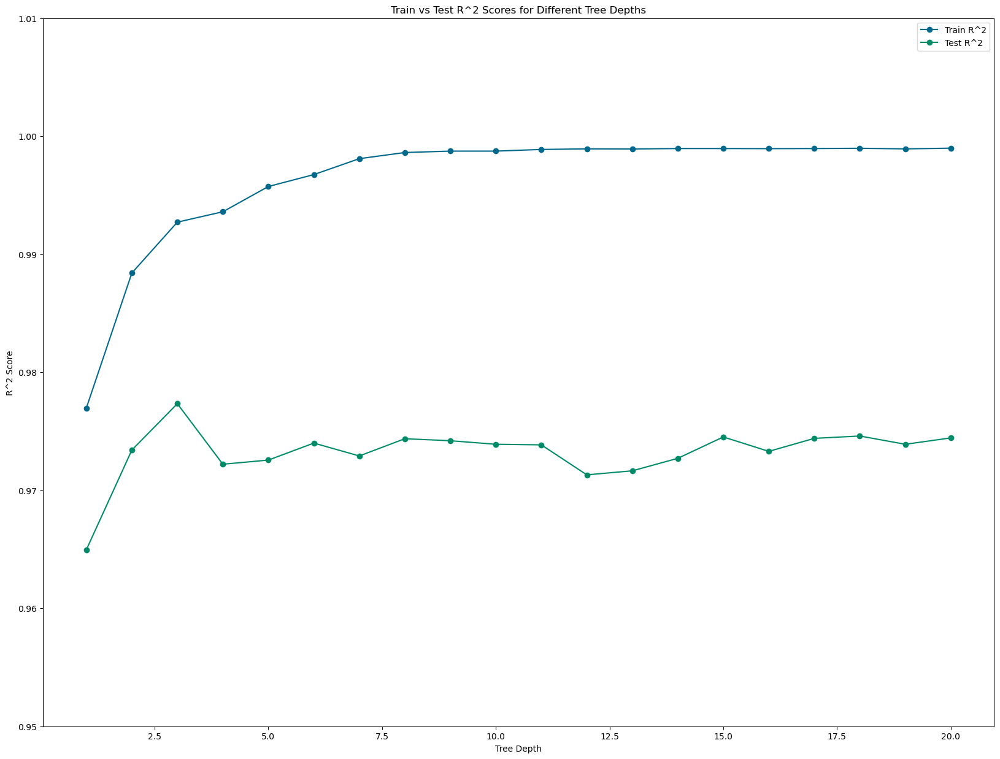

In [221]:
# Plotting
fig, ax = plt.subplots(figsize=(20, 15))

# Plot the R^2 scores for the training set
ax.plot(max_depth_values, train_r2_scores, marker='o', color='#00688B', label='Train R^2')

# Plot the R^2 scores for the test set
ax.plot(max_depth_values, test_r2_scores, marker='o', color='#008B68', label='Test R^2')

ax.set_xlabel('Tree Depth')
ax.set_ylabel('R^2 Score')
ax.set_title('Train vs Test R^2 Scores for Different Tree Depths')
ax.set_ylim(0.95,1.01)
ax.legend()

plt.show()

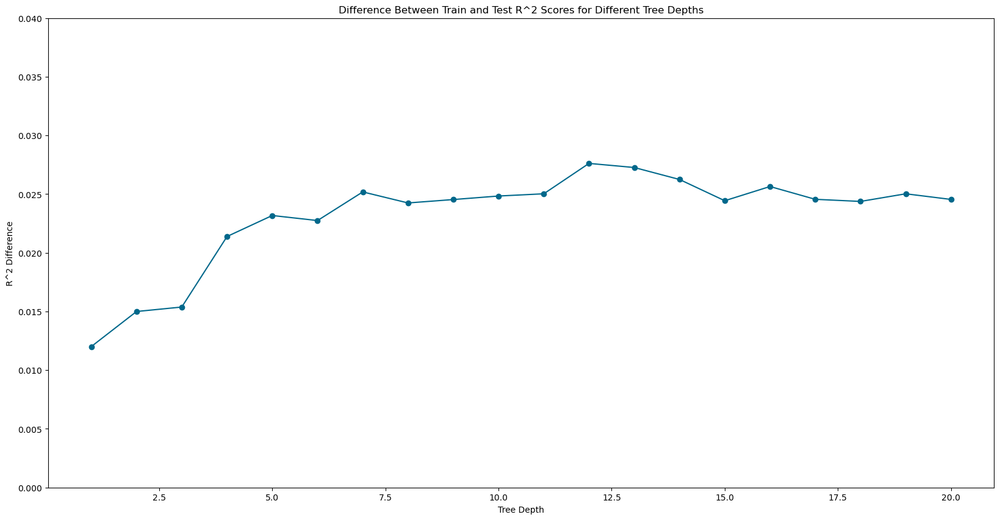

The maximum R^2 score for the test set is 0.97734 at a tree depth of 3


In [222]:
# Plot the difference between the training and test R^2 scores
fig, ax = plt.subplots(figsize=(20, 10))

# Calculate the difference between the training and test R^2 scores
r2_diff = np.array(train_r2_scores) - np.array(test_r2_scores)

# Plot the difference between the training and test R^2 scores
ax.plot(max_depth_values, r2_diff, marker='o', color='#00688B')

ax.set_xlabel('Tree Depth')
ax.set_ylabel('R^2 Difference')
ax.set_title('Difference Between Train and Test R^2 Scores for Different Tree Depths')
ax.set_ylim(0,0.04)

plt.show()

# Print the maximum R^2 score for the test set and the corresponding tree depth
max_r2_test = max(test_r2_scores)
max_r2_test_depth = max_depth_values[test_r2_scores.index(max_r2_test)]

print(f"The maximum R^2 score for the test set is {max_r2_test:.5f} at a tree depth of {max_r2_test_depth}")

# Model 4

In [2]:
df = pd.read_csv('WDI_data.csv')
df['CC_EST'] = ((df['CC_EST'] * (-1)) + 2.5 ) * 20
# Calculate the correlation between column CC_EST and column CPI_EST
correlation = df['CC_EST'].corr(df['CPI_EST'])
correlation

0.9888007719282952

In [3]:
df = pd.read_csv('WDI_data.csv')


# Remove CC_EST
df = df.drop(columns=['CC_EST'])
# Make years integers
df['year'] = df['year'].astype(int)

In [4]:
# Create a column that has the average CPI_EST for each country between the year 2012 and 2022 only but prints for all years given the country
df['CPI_EST_avg'] = df.groupby('iso2c')['CPI_EST'].transform(lambda x: x[(df['year'] >= 2012) & (df['year'] <= 2022)].mean())
df['CPI_EST_avg'] = np.log1p(df['CPI_EST_avg'])
# Drop all rows with missing values in 'CPI_EST_avg'
df = df.dropna(subset=['CPI_EST_avg'])

In [5]:
# Filter df to only include years from 1970 to 2011
df_pre_2012 = df[(df['year'] >= 1970) & (df['year'] < 2012)]

# Calculate the percentage of missing values in each column for years prior to 2012
missing_percentages = df_pre_2012.isnull().mean()

# Select the columns that have less than 50% missing values, or are 'CC_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', and 'WB_CC_EST_avg'
cols_to_keep = [col for col in df.columns if col in ['CPI_EST','NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'CPI_EST_avg'] or (col in missing_percentages and missing_percentages[col] < 0.5)]

# Keep only the selected columns in df
df = df[cols_to_keep]

In [227]:
# View
df[['iso2c', 'country', 'year', 'CPI_EST', 'CPI_EST_avg']]

,iso2c,country,year,CPI_EST,CPI_EST_avg
63,AE,United Arab Emirates,1960,NaN,3.457177
64,AE,United Arab Emirates,1961,NaN,3.457177
65,AE,United Arab Emirates,1962,NaN,3.457177
66,AE,United Arab Emirates,1963,NaN,3.457177
67,AE,United Arab Emirates,1964,NaN,3.457177
...,...,...,...,...,...
13729,ZW,Zimbabwe,2018,78.0,4.368296
13730,ZW,Zimbabwe,2019,76.0,4.368296
13731,ZW,Zimbabwe,2020,76.0,4.368296
13732,ZW,Zimbabwe,2021,77.0,4.368296


In [6]:
# Create a dictionary that maps ISO 2-letter country codes to a dictionary containing the ISO 3-letter and numeric country codes
country_codes = {country.alpha_2: {'alpha-3': country.alpha_3, 'numeric': country.numeric} for country in pycountry.countries}

# Now you can use this dictionary in your code
df['iso3c'] = df['iso2c'].map(lambda x: country_codes.get(x, {}).get('alpha-3'))
df['iso3n'] = df['iso2c'].map(lambda x: country_codes.get(x, {}).get('numeric'))

In [7]:
def backfill_based_on_avg_change(df, column):
    """
    Backfill missing values in the specified column based on the average percentage change of the next 10 years for each country.
    """
    # Iterate over each country
    for country in df['iso2c'].unique():
        # Get the data for the current country
        df_country = df[df['iso2c'] == country].copy()

        # Sort the data by year in ascending order
        df_country.sort_values('year', inplace=True)

        # Identify the indices of the missing values in the column
        missing_indices = df_country[df_country[column].isnull() & (df_country['year'] < 2012)].index.tolist()

        # For each missing value, calculate the average percentage change of the next 10 years and use it to fill the missing value
        for idx in missing_indices:
            if df_country.loc[idx, 'year'] < 1950:
                continue
            next_10_years_avg_pct_change = df_country.loc[idx+1:idx+11, column].pct_change().mean()

            # Apply a resistance factor to the average percentage change
            resistance_factor = 1 / (abs(next_10_years_avg_pct_change) + 1)
            if abs(next_10_years_avg_pct_change) > 0.05: 
                resistance_factor *= 1 / (10 * abs(next_10_years_avg_pct_change) + 1)
            next_10_years_avg_pct_change *= resistance_factor

            # Apply the average percentage change to each year as it extrapolates backwards
            for i in reversed(range(missing_indices[0], idx+1)):
                if i+1 in df_country.index:
                    df_country.loc[i, column] = df_country.loc[i+1, column] * (1 - next_10_years_avg_pct_change)

        # Update the column in the original DataFrame
        df.loc[df['iso2c'] == country, column] = df_country[column]

    return df

# Use the function to backfill the missing values in 'NY_GDP_PCAP_KD' and 'NY_GDP_PCAP_CD'
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_KD')
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_CD')
df = backfill_based_on_avg_change(df, 'NY_GDP_PCAP_CN')
df['NY_GDP_PCAP_KD_rel'] = df.groupby('year')['NY_GDP_PCAP_KD'].transform(lambda x: x / x.mean())
df['NY_GDP_PCAP_CD_rel'] = df.groupby('year')['NY_GDP_PCAP_CD'].transform(lambda x: x / x.mean())
df['NY_GDP_PCAP_CD_rel'] = df.groupby('year')['NY_GDP_PCAP_CN'].transform(lambda x: x / x.mean())

In [230]:
# View
df[['iso2c', 'country', 'year', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_CD_rel']]

,iso2c,country,year,NY_GDP_PCAP_KD,NY_GDP_PCAP_CD,NY_GDP_PCAP_CD_rel
63,AE,United Arab Emirates,1960,147090.258253,20783.760079,12.692847
64,AE,United Arab Emirates,1961,143884.292488,21154.209911,12.010375
65,AE,United Arab Emirates,1962,140748.203658,21531.262642,11.495933
66,AE,United Arab Emirates,1963,137680.468732,21915.035962,10.994984
67,AE,United Arab Emirates,1964,134679.597875,22305.649660,10.029993
...,...,...,...,...,...,...
13729,ZW,Zimbabwe,2018,1462.590279,2269.177012,0.001235
13730,ZW,Zimbabwe,2019,1342.989586,1421.868596,0.003255
13731,ZW,Zimbabwe,2020,1213.117057,1372.696674,0.017137
13732,ZW,Zimbabwe,2021,1289.199067,1773.920411,0.027691


In [8]:
df_dr = df[df['year'] >= 2012]
df_dr = df_dr.dropna(subset=['CPI_EST'])

# Create a new dataframe with only iso2c, country, and CC_EST
df_corr = df_dr[['iso2c', 'country','year', 'CPI_EST']]

# Filter the data for the years 2012 and 2022
df_filtered = df_corr[df_corr['year'].isin([2012, 2022])]

In [9]:
# Calculate the linear differences over time for each given country
change_by_country = df_filtered.pivot_table(index='iso2c', columns='year', values='CPI_EST', aggfunc='first')

# Calculate the change for each country
change_by_country['avg_change'] = (change_by_country[2022] - change_by_country[2012]) / 10

# Calculate the mean and median CC_EST values across all years for each country
mean_cc_est_by_country = df_filtered.groupby('iso2c')['CPI_EST'].mean()
median_cc_est_by_country = df_filtered.groupby('iso2c')['CPI_EST'].median()

# Merge with the original DataFrame to get the country names
df_trend = pd.merge(change_by_country['avg_change'], mean_cc_est_by_country, left_index=True, right_index=True, how='left')
df_trend = pd.merge(df_trend, median_cc_est_by_country, left_index=True, right_index=True, how='left')

# Reset index and rename columns
df_trend.reset_index(inplace=True)
df_trend.rename(columns={'CPI_EST_x': 'mean_CPI_EST', 'PIC_EST_y': 'median_CPI_EST'}, inplace=True)

# Include country names
df_trend = pd.merge(df_trend, df_filtered[['iso2c', 'country']].drop_duplicates(), on='iso2c', how='left')

print(df_trend)


    iso2c  avg_change  mean_CPI_EST  CPI_EST_y               country
0      AE         0.1          32.5       32.5  United Arab Emirates
1      AF        -1.6          84.0       84.0           Afghanistan
2      AL        -0.3          65.5       65.5               Albania
3      AM        -1.2          60.0       60.0               Armenia
4      AO        -1.1          72.5       72.5                Angola
..    ...         ...           ...        ...                   ...
174    VU         NaN          52.0       52.0               Vanuatu
175    YE         0.7          80.5       80.5           Yemen, Rep.
176    ZA         0.0          57.0       57.0          South Africa
177    ZM         0.4          65.0       65.0                Zambia
178    ZW        -0.3          78.5       78.5              Zimbabwe

[179 rows x 5 columns]


In [10]:
# Max and min values
# Find the index of the maximum and minimum mean_CC_EST values
most_corrupt_idx = df_trend['mean_CPI_EST'].idxmax()
least_corrupt_idx = df_trend['mean_CPI_EST'].idxmin()

most_corrupt_country = df_trend.loc[most_corrupt_idx, 'country']
least_corrupt_country = df_trend.loc[least_corrupt_idx, 'country']

print("The most corrupt country (on average between 2012 and 2022) is", most_corrupt_country)
print("The least corrupt country (on average between 2012 and 2022) is", least_corrupt_country)
print("The country that became more corrupt (rose the most) on average between 2012 and 2022 is", df_trend.loc[df_trend['avg_change'].idxmax(), 'country'])
print("The country that became less corrupt (fell the most) on average between 2012 and 2022 is", df_trend.loc[df_trend['avg_change'].idxmin(), 'country'])

The most corrupt country (on average between 2012 and 2022) is Somalia
The least corrupt country (on average between 2012 and 2022) is Denmark
The country that became more corrupt (rose the most) on average between 2012 and 2022 is St. Lucia
The country that became less corrupt (fell the most) on average between 2012 and 2022 is Seychelles


In [11]:
# Print values of the averages across 2012 adn 2022 and their respective countries
print("The average CPI_EST value for the most corrupt country is", df_trend.loc[most_corrupt_idx, 'mean_CPI_EST'])
print("The average CPI_EST value for the least corrupt country is", df_trend.loc[least_corrupt_idx, 'mean_CPI_EST'])
print("The average CPI_EST value for the country that became more corrupt is", df_trend.loc[df_trend['avg_change'].idxmax(), 'mean_CPI_EST'])
print("The average CPI_EST value for the country that became less corrupt is", df_trend.loc[df_trend['avg_change'].idxmin(), 'mean_CPI_EST'])

The average CPI_EST value for the most corrupt country is 90.0
The average CPI_EST value for the least corrupt country is 10.0
The average CPI_EST value for the country that became more corrupt is 37.0
The average CPI_EST value for the country that became less corrupt is 39.0


In [12]:
# Print how much less corrupt the Seychelles became per year between 2012 and 2022
seychelles_idx = df_trend[df_trend['country'] == 'Seychelles'].index[0]
seychelles_change = df_trend.loc[seychelles_idx, 'avg_change']
print("Seychelles became less corrupt by an average of", seychelles_change, "points per year between 2012 and 2022")

# Print how much more corrupt St. Lucia became over the 10 years
st_lucia_idx = df_trend[df_trend['country'] == 'St. Lucia'].index[0]
st_lucia_change = df_trend.loc[st_lucia_idx, 'avg_change']
print("St. Lucia became more corrupt by", st_lucia_change, "points on average between 2012 and 2022")

Seychelles became less corrupt by an average of -1.8 points per year between 2012 and 2022
St. Lucia became more corrupt by 1.6 points on average between 2012 and 2022


In [13]:
df_correl = pd.read_csv('correlations.csv')
# Rank in order of correlation with CC_EST
df_correl = df_correl.sort_values('correlation', ascending=False)

In [14]:
# Remove rows in df_dr that have missing values in CC_EST column
df_dr = df[df['year'] >= 2012]
df_dr = df_dr.dropna(subset=['CPI_EST'])

# Filter to only show correlations greater than or equal to +- 0.5
df_correl_5 = df_correl[abs(df_correl['correlation']) >= 0.5]
# Filter to only show correlations greater than or equal to +- 0.6
df_correl_6 = df_correl[abs(df_correl['correlation']) >= 0.6]
# Filter to only show correlations greater than or equal to +- 0.7
df_correl_7 = df_correl[abs(df_correl['correlation']) >= 0.7]
# Filter to only show correlations greater than or equal to +- 0.8
df_correl_8 = df_correl[abs(df_correl['correlation']) >= 0.8]
# Filter to only show correlations greater than or equal to +- 0.9
df_correl_9 = df_correl[abs(df_correl['correlation']) >= 0.9]

print(f"The number of correlations with an absolute value greater than or equal to 0.5 is", len(df_correl_5))
print(f"The number of correlations with an absolute value greater than or equal to 0.6 is", len(df_correl_6))
print(f"The number of correlations with an absolute value greater than or equal to 0.7 is", len(df_correl_7))
print(f"The number of correlations with an absolute value greater than or equal to 0.8 is", len(df_correl_8))
print(f"The number of correlations with an absolute value greater than or equal to 0.9 is", len(df_correl_9))

The number of correlations with an absolute value greater than or equal to 0.5 is 253
The number of correlations with an absolute value greater than or equal to 0.6 is 128
The number of correlations with an absolute value greater than or equal to 0.7 is 54
The number of correlations with an absolute value greater than or equal to 0.8 is 7
The number of correlations with an absolute value greater than or equal to 0.9 is 1


In [15]:
# Merge together corruption values and the largest correlators
# Create variables that are a list of the variables that are highly correlated with CC_EST
vars_5 = df_correl_5.columns.tolist()
vars_5 = [var for var in vars_5 if var in df_dr.columns]
vars_6 = df_correl_6.columns.tolist()
vars_6 = [var for var in vars_6 if var in df_dr.columns]
vars_7 = df_correl_7.columns.tolist()
vars_7 = [var for var in vars_7 if var in df_dr.columns]
vars_8 = df_correl_8.columns.tolist()
vars_8 = [var for var in vars_8 if var in df_dr.columns]
vars_9 = df_correl_9.columns.tolist()
vars_9 = [var for var in vars_9 if var in df_dr.columns]

# Merge the corruption values with the variables that are highly correlated with CC_EST
df_5 = df_dr[['iso2c', 'country', 'year', 'CPI_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel'] + vars_5]
df_6 = df_dr[['iso2c', 'country', 'year', 'CPI_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel'] + vars_6]
df_7 = df_dr[['iso2c', 'country', 'year', 'CPI_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel'] + vars_7]
df_8 = df_dr[['iso2c', 'country', 'year', 'CPI_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel'] + vars_8]
df_9 = df_dr[['iso2c', 'country', 'year', 'CPI_EST', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'NY_GDP_PCAP_KD_rel', 'NY_GDP_PCAP_CD_rel'] + vars_9]
# Build random forest model to predict corruption from highly correlated variables
# Simplify notation:
x5 = df_5.iloc[:,2:].values
x6 = df_6.iloc[:,2:].values
x7 = df_7.iloc[:,2:].values
x8 = df_8.iloc[:,2:].values
x9 = df_9.iloc[:,2:].values

y = df_dr['CPI_EST'].values

In [16]:
def prepare_lead_data(df, target_col, lead_cols, time_col, country_col):
    """Shifts features to create lead versions for backcasting, 
       accounting for country and year structure.
    """
    df_lead = df.copy()

    for col in lead_cols:
        df_lead[f'{col}_lead1'] = df_lead.sort_values([time_col]).groupby(country_col)[col].shift(-1)

    df_lead.fillna(0, inplace=True)
    return df_lead


def remove_correlated_features(df, threshold):
    """Removes highly correlated features based on a threshold."""
    corr_matrix = df.dropna().corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    cols_to_drop = [col for col in upper.columns if any(upper[col] > threshold)]
    df = df.drop(cols_to_drop, axis=1)
    return df

def custom_cross_val_score(model, X, y, cv):
    """Calculates cross-validation scores for a given model."""
    scores = []
    kf = KFold(n_splits=cv)
    
    for train_index, val_index in kf.split(X):
        x_train, x_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        model.fit(x_train, y_train, eval_set=[(x_val, y_val)], verbose=False)

        y_val_pred = model.predict(x_val)
        r2_val = round(r2_score(y_val, y_val_pred), 5)
        scores.append(r2_val)
    
    return scores

In [17]:
def custom_objective(y_true, y_pred, indices):
    """
    Custom objective function that penalizes predictions close to or beyond the bounds of 0 and 100,
    penalizes large changes from the previous year's prediction, and penalizes an overall movement greater than 20 from the 2012 value.
    """
    # Convert y_true and y_pred to pandas Series
    y_true = pd.Series(y_true)
    y_pred = pd.Series(y_pred)
    
    # Select the corresponding value from y_2012 for each y_true and y_pred
    y_2012 = df['CPI_EST_avg'].loc[indices]
    
    # Calculate the squared error
    squared_error = (y_true - y_pred) ** 2
    
    # Calculate the penalty term
    penalty = np.abs(y_pred - y_2012)
    
    # Add the penalty term to the squared error
    penalized_squared_error = squared_error + penalty
    
    # Calculate the first derivative (gradient) of the penalized squared error
    grad = -2 * (y_true - y_pred) + np.sign(y_pred - y_2012)
    
    # Calculate the second derivative (Hessian) of the penalized squared error
    hess = np.ones_like(grad) * 2
    
    return grad, hess

class TqdmCallback(xgb.callback.TrainingCallback):
    def __init__(self, bar):
        self._bar = bar

    def after_iteration(self, model, epoch, evals_log):
        self._bar.update(1)
        return False

def build_and_evaluate_model(df, target_col_name, var_list, n_leads=2):
    """
    Builds, evaluates, and returns results for an XGBoost model.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df = df.copy()

    # Exclude 'iso2c', 'country', target_col_name, and lead variables from var_list
    var_list = [var for var in var_list if var not in ['iso2c', 'country', target_col_name] + [f"{target_col_name}_lead{i}" for i in range(1, n_leads + 1)]]

    # Remove rows with invalid values in the target column
    df = df[np.isfinite(df[target_col_name]) & (abs(df[target_col_name]) <= 1e30)]

    # Add a new feature for the previous year's target value
    df[target_col_name + '_prev'] = df.groupby('iso2c')[target_col_name].shift()
    var_list.append(target_col_name + '_prev')

    X = df[var_list]

    df_train_val, df_test = train_test_split(df, test_size=0.2, random_state=0)

    x_train_val, x_test, y_train_val, y_test = train_test_split(X, df[target_col_name], test_size=0.2, random_state=0)

    # Remove correlated features
    x_lead = x_train_val
    x_test = x_test[x_lead.columns]

    # Align datasets before model training
    x_lead, x_test = x_lead.align(x_test, join='inner', axis=1)

    model = XGBRegressor(
        objective='reg:squarederror',
        random_state=0,
        alpha=1.0,
        reg_lambda=10.0,
        early_stopping_rounds=10
    )

    with tqdm(total=model.get_params()['n_estimators']) as pbar:
        model.fit(
            x_lead,
            y_train_val,
            eval_set=[(x_test, y_test)],
            verbose=False,
            callbacks=[TqdmCallback(pbar)]
        )


    y_train_val_pred = model.predict(x_lead)
    y_test_pred = model.predict(x_test)

    # Clip the predictions to be within the desired range
    y_train_val_pred = np.clip(y_train_val_pred, 0, 100)
    y_test_pred = np.clip(y_test_pred, 0, 100)

    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    cv_scores = custom_cross_val_score(model, x_train_val, y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)

    # Get the feature importances
    feature_importances = model.feature_importances_

    # Get the feature names from x_lead
    feature_names = x_lead.columns.tolist()

    # Align feature importances with feature names
    feature_importances_aligned = pd.Series(feature_importances, index=feature_names)    

    # Create a DataFrame with the aligned feature importances
    feature_importances_df = pd.DataFrame({
        'Feature': feature_importances_aligned.index,
        'Importance': np.round(feature_importances_aligned.values, 4)
    }).sort_values(by='Importance', ascending=False)


    return r2_train_val, r2_test, rmse_train_val, rmse_test, mean_cv_score, feature_importances_df, x_test.index, y_test_pred, y_test, df, model, feature_importances


Running model on full dataset


0it [00:00, ?it/s]

/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
51it [00:02, 22.67it/s]



Model with correlation >= 0.0:
Training+Validation R^2: 0.99942, RMSE: 0.45797
Testing R^2: 0.98508, RMSE: 2.51085
Mean cross-validation score: 0.98438

                Feature  Importance
512         CPI_EST_avg      0.8700
515        CPI_EST_prev      0.0289
387   SP_DYN_LE00_FE_IN      0.0030
117   EN_ATM_CO2E_GF_KT      0.0026
513  NY_GDP_PCAP_KD_rel      0.0025
..                  ...         ...
265      NY_ADJ_AEDU_CD      0.0000
263      NV_SRV_TOTL_KN      0.0000
260      NV_SRV_TOTL_CN      0.0000
259      NV_SRV_TOTL_CD      0.0000
258   NV_MNF_TXTL_ZS_UN      0.0000

[516 rows x 2 columns]


                    country  year  CPI_EST
115    United Arab Emirates  2012     32.0
116    United Arab Emirates  2013     31.0
117    United Arab Emirates  2014     30.0
118    United Arab Emirates  2015     30.0
119    United Arab Emirates  2016     34.0
...                     ...   ...      ...
13729              Zimbabwe  2018     78.0
13730              Zimbabwe  2019     76.0
1

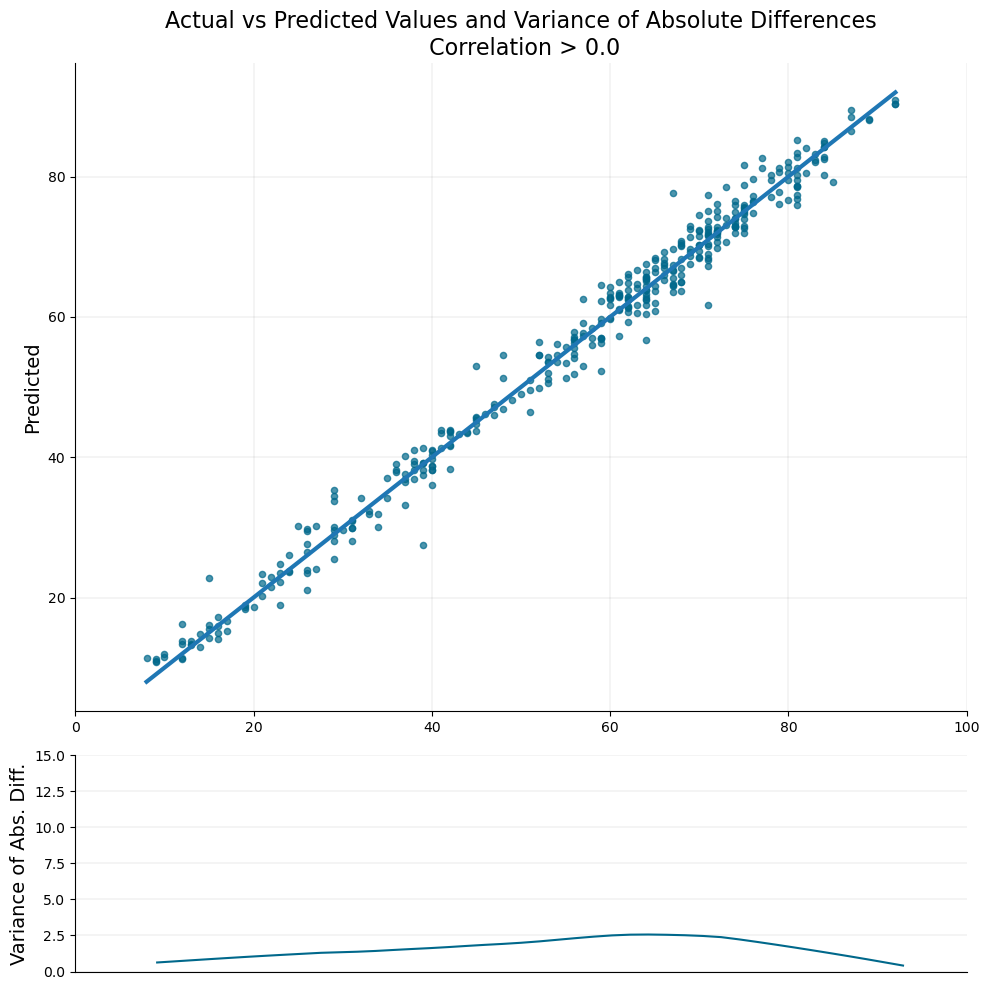

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
50it [00:01, 32.87it/s]



Model with correlation >= 0.1:
Training+Validation R^2: 0.99924, RMSE: 0.52322
Testing R^2: 0.98542, RMSE: 2.48173
Mean cross-validation score: 0.98455

                  Feature  Importance
310           CPI_EST_avg      0.8656
312          CPI_EST_prev      0.0283
141     NY_ADJ_DFOR_GN_ZS      0.0035
311    NY_GDP_PCAP_KD_rel      0.0024
238     SP_POP_1564_TO_ZS      0.0023
259     SP_POP_65UP_MA_ZS      0.0023
68      EN_ATM_CO2E_GF_KT      0.0021
219     SP_DYN_LE00_FE_IN      0.0019
195           SH_DTH_1519      0.0018
162        NY_GDS_TOTL_ZS      0.0017
292     TM_VAL_SERV_CD_WT      0.0017
23         BX_GSR_GNFS_CD      0.0015
220        SP_DYN_LE00_IN      0.0013
62         EG_IMP_CONS_ZS      0.0012
128        NV_IND_MANF_CD      0.0012
107     NE_CON_PRVT_PC_KD      0.0012
270        SP_POP_DPND_YG      0.0012
277     TM_VAL_FOOD_ZS_UN      0.0011
51      DT_ODA_ODAT_PC_ZS      0.0010
207           SH_DYN_NMRT      0.0010
285     TM_VAL_MRCH_R2_ZS      0.0010
73      EN

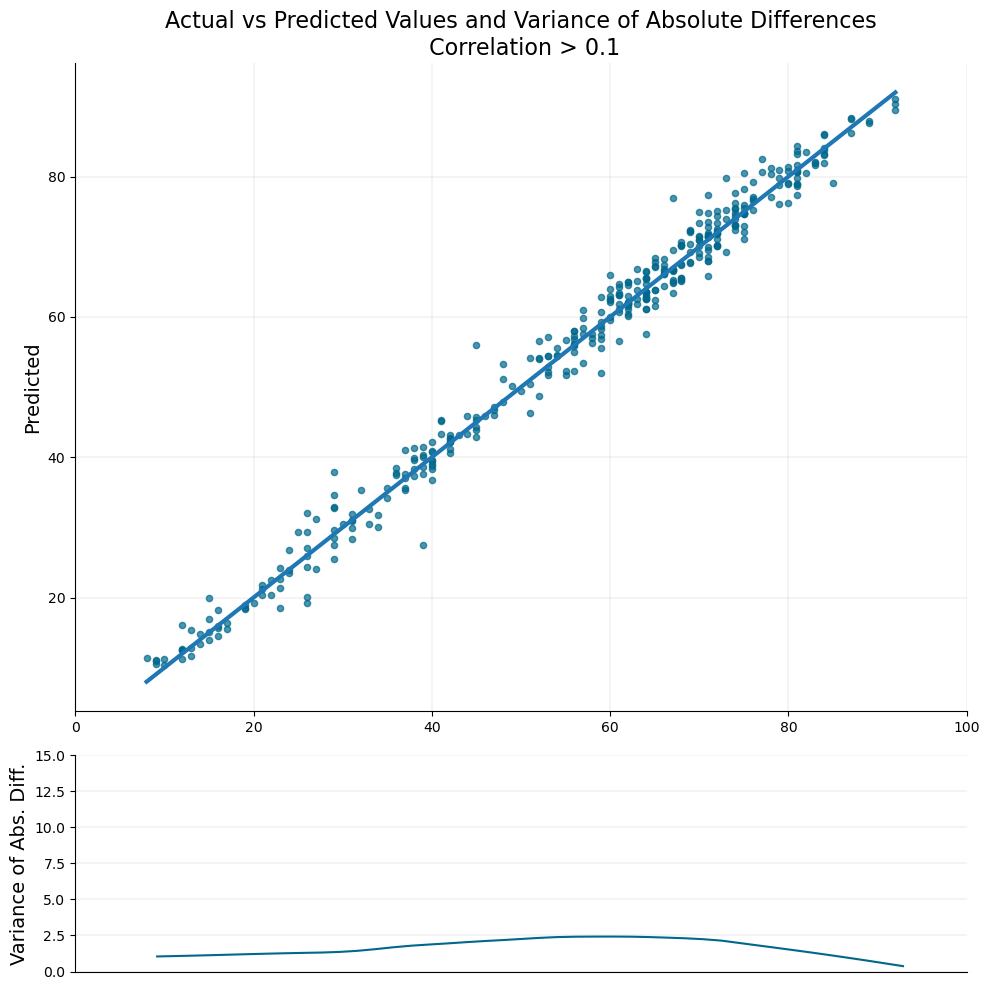

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
51it [00:00, 58.26it/s]



Model with correlation >= 0.2:
Training+Validation R^2: 0.99901, RMSE: 0.59837
Testing R^2: 0.98503, RMSE: 2.51451
Mean cross-validation score: 0.98413

                  Feature  Importance
212           CPI_EST_avg      0.8881
214          CPI_EST_prev      0.0244
180     SP_POP_65UP_MA_ZS      0.0027
41         EG_ELC_RNWX_KH      0.0020
97      NY_GDP_FRST_RT_ZS      0.0016
147     SP_DYN_TO65_MA_ZS      0.0015
77         NE_IMP_GNFS_KD      0.0014
90      NY_ADJ_DFOR_GN_ZS      0.0014
45         EG_USE_CRNW_ZS      0.0013
142     SP_DYN_LE00_FE_IN      0.0013
49            EN_POP_DNST      0.0012
188           SP_POP_DPND      0.0012
131           SH_DYN_NMRT      0.0012
63         NE_CON_GOVT_KD      0.0011
213    NY_GDP_PCAP_KD_rel      0.0011
205     TM_VAL_SERV_CD_WT      0.0011
163     SP_POP_2024_MA_5Y      0.0010
191           SP_POP_GROW      0.0010
177     SP_POP_6569_FE_5Y      0.0010
197     TM_VAL_FOOD_ZS_UN      0.0009
68         NE_CON_TOTL_CD      0.0009
82        

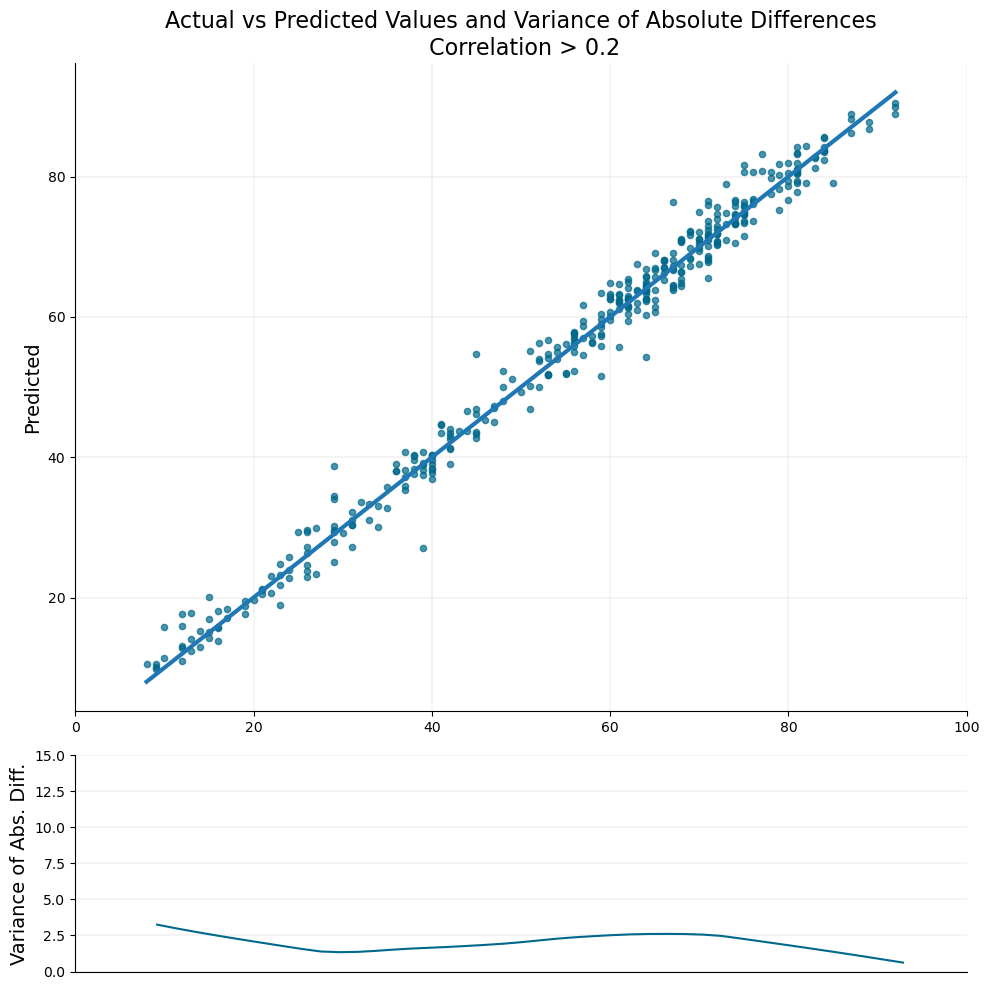

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
66it [00:00, 71.24it/s]



Model with correlation >= 0.3:
Training+Validation R^2: 0.99944, RMSE: 0.44949
Testing R^2: 0.98442, RMSE: 2.56512
Mean cross-validation score: 0.98476

                  Feature  Importance
158           CPI_EST_avg      0.9176
160          CPI_EST_prev      0.0244
159    NY_GDP_PCAP_KD_rel      0.0047
87            SH_DYN_NMRT      0.0015
132     SP_POP_65UP_MA_ZS      0.0013
131     SP_POP_65UP_FE_ZS      0.0012
26         EG_USE_CRNW_ZS      0.0011
77         SE_SEC_ENRR_MA      0.0011
104     SP_POP_0004_MA_5Y      0.0010
102     SP_DYN_TO65_MA_ZS      0.0010
76         SE_SEC_ENRR_FE      0.0010
57      NY_ADJ_DFOR_GN_ZS      0.0010
86         SH_DYN_MORT_MA      0.0009
80            SH_DYN_0509      0.0009
105     SP_POP_0014_FE_ZS      0.0007
103     SP_POP_0004_FE_5Y      0.0007
139     SP_POP_80UP_MA_5Y      0.0007
117     SP_POP_2024_FE_5Y      0.0007
124     SP_POP_5054_MA_5Y      0.0006
146     SP_URB_TOTL_IN_ZS      0.0006
97      SP_DYN_LE00_FE_IN      0.0006
116     SP

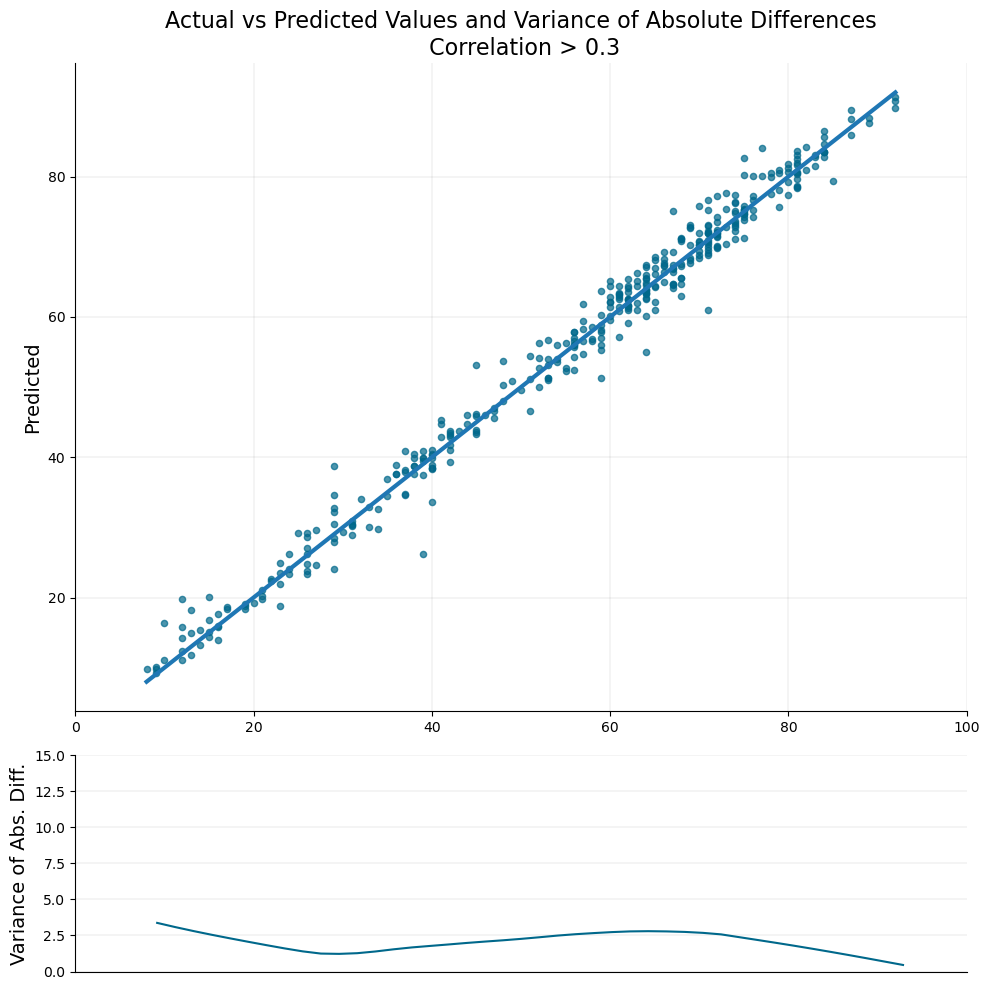

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
63it [00:00, 104.50it/s]



Model with correlation >= 0.4:
Training+Validation R^2: 0.99912, RMSE: 0.56283
Testing R^2: 0.98578, RMSE: 2.45111
Mean cross-validation score: 0.98457

                Feature  Importance
106         CPI_EST_avg      0.9543
108        CPI_EST_prev      0.0177
107  NY_GDP_PCAP_KD_rel      0.0016
87    SP_POP_65UP_FE_ZS      0.0010
88    SP_POP_65UP_MA_ZS      0.0008
98       SP_POP_DPND_YG      0.0007
43          SH_DYN_NMRT      0.0007
58    SP_DYN_TO65_MA_ZS      0.0007
95    SP_POP_80UP_MA_5Y      0.0006
7     EG_USE_ELEC_KH_PC      0.0006
89    SP_POP_65UP_TO_ZS      0.0006
73    SP_POP_2024_FE_5Y      0.0005
32       SE_SEC_ENRR_FE      0.0005
81    SP_POP_5559_FE_5Y      0.0005
39          SH_DYN_2024      0.0005
13       IT_CEL_SETS_P2      0.0004
33       SE_SEC_ENRR_MA      0.0004
105   TX_VAL_SERV_CD_WT      0.0004
92    SP_POP_7579_FE_5Y      0.0004
53    SP_DYN_LE00_FE_IN      0.0004
84    SP_POP_6064_MA_5Y      0.0004
85    SP_POP_6569_FE_5Y      0.0004
77    SP_POP_4549_

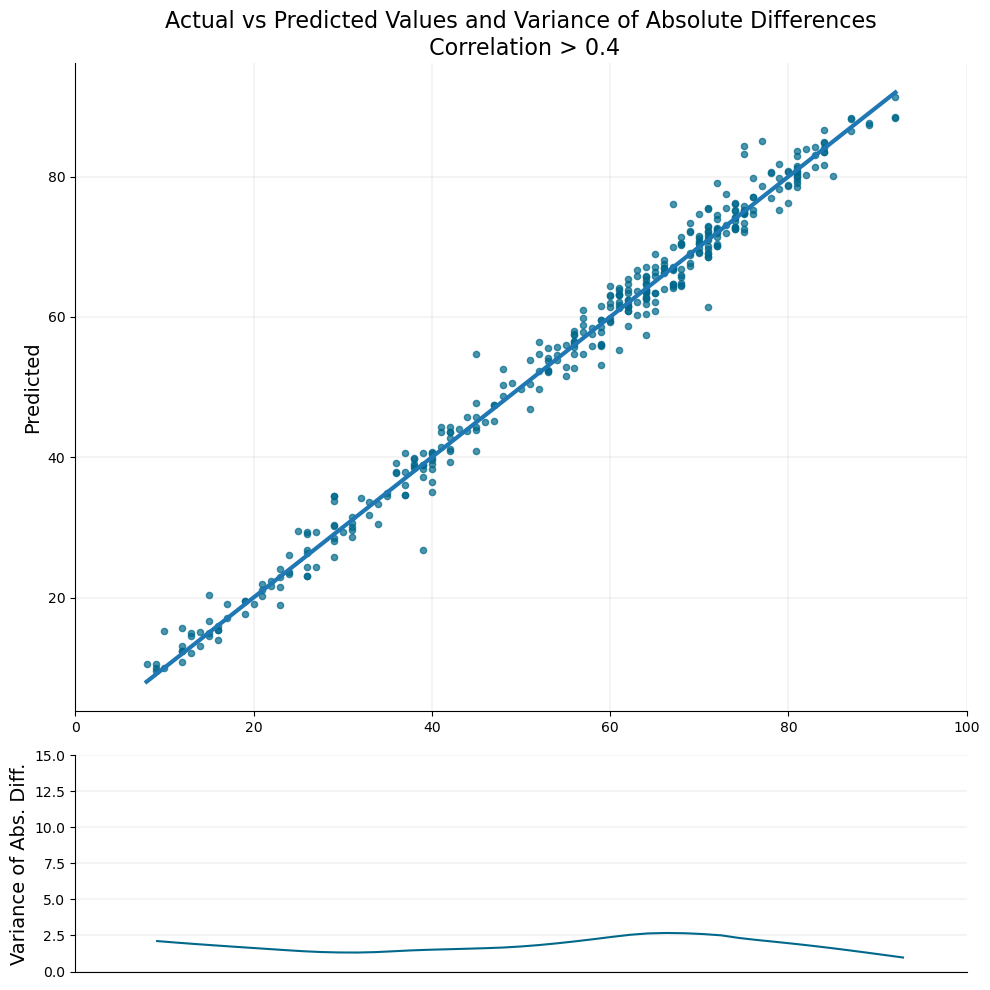

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
81it [00:00, 171.25it/s]



Model with correlation >= 0.5:
Training+Validation R^2: 0.99934, RMSE: 0.49024
Testing R^2: 0.98656, RMSE: 2.38294
Mean cross-validation score: 0.98482

               Feature  Importance
78         CPI_EST_avg      0.9244
80        CPI_EST_prev      0.0281
79  NY_GDP_PCAP_KD_rel      0.0048
64   SP_POP_65UP_FE_ZS      0.0014
23         SH_DYN_2024      0.0014
17      SE_SEC_ENRR_FE      0.0013
65   SP_POP_65UP_MA_ZS      0.0012
68   SP_POP_7074_MA_5Y      0.0012
41   SP_POP_0004_FE_5Y      0.0010
36      SP_DYN_LE00_IN      0.0010
24         SH_DYN_MORT      0.0010
69   SP_POP_7579_FE_5Y      0.0009
35   SP_DYN_LE00_FE_IN      0.0009
25      SH_DYN_MORT_FE      0.0009
58   SP_POP_5559_FE_5Y      0.0008
20         SG_LAW_INDX      0.0008
75      SP_RUR_TOTL_ZS      0.0008
14         SE_PRE_ENRR      0.0007
9       NV_SRV_TOTL_ZS      0.0007
52   SP_POP_2024_FE_5Y      0.0007
4    FS_AST_PRVT_GD_ZS      0.0007
31      SP_DYN_CBRT_IN      0.0007
27         SH_DYN_NMRT      0.0007
62   S

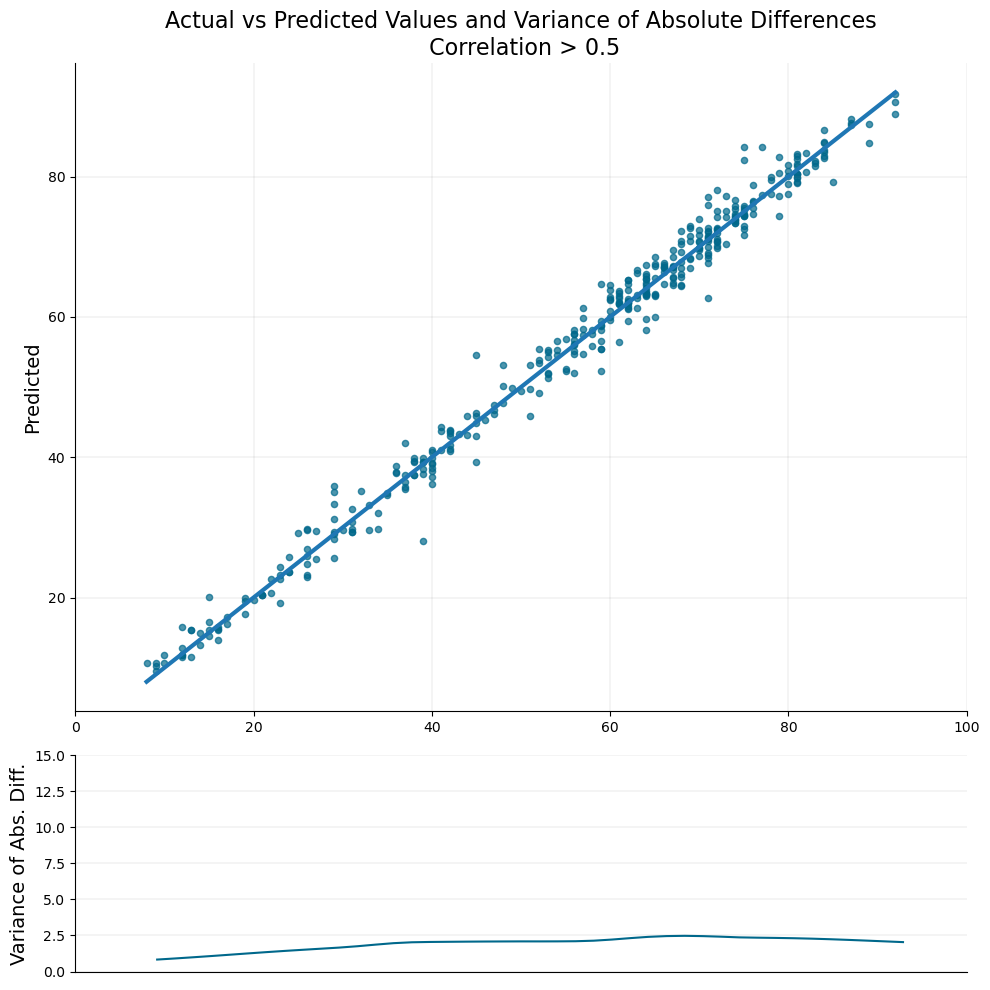

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
97it [00:00, 215.43it/s]



Model with correlation >= 0.6:
Training+Validation R^2: 0.99935, RMSE: 0.4867
Testing R^2: 0.98628, RMSE: 2.40711
Mean cross-validation score: 0.98431

               Feature  Importance
44         CPI_EST_avg      0.9374
46        CPI_EST_prev      0.0273
45  NY_GDP_PCAP_KD_rel      0.0024
32   SP_POP_6569_FE_5Y      0.0015
9       SE_SEC_ENRR_FE      0.0014
35   SP_POP_65UP_MA_ZS      0.0014
41   SP_POP_80UP_MA_5Y      0.0013
14   SP_DYN_LE00_FE_IN      0.0013
16   SP_DYN_LE00_MA_IN      0.0012
7       NY_GNP_PCAP_CD      0.0011
40   SP_POP_80UP_FE_5Y      0.0011
10      SE_SEC_ENRR_MA      0.0011
43      SP_POP_DPND_YG      0.0010
15      SP_DYN_LE00_IN      0.0009
34   SP_POP_65UP_FE_ZS      0.0009
38   SP_POP_7074_MA_5Y      0.0009
17   SP_DYN_TO65_MA_ZS      0.0008
26   SP_POP_1014_MA_5Y      0.0008
4    NY_ADJ_NNTY_PC_CD      0.0008
28   SP_POP_1519_MA_5Y      0.0008
37   SP_POP_7074_FE_5Y      0.0007
27   SP_POP_1519_FE_5Y      0.0007
0    EG_USE_ELEC_KH_PC      0.0007
13     

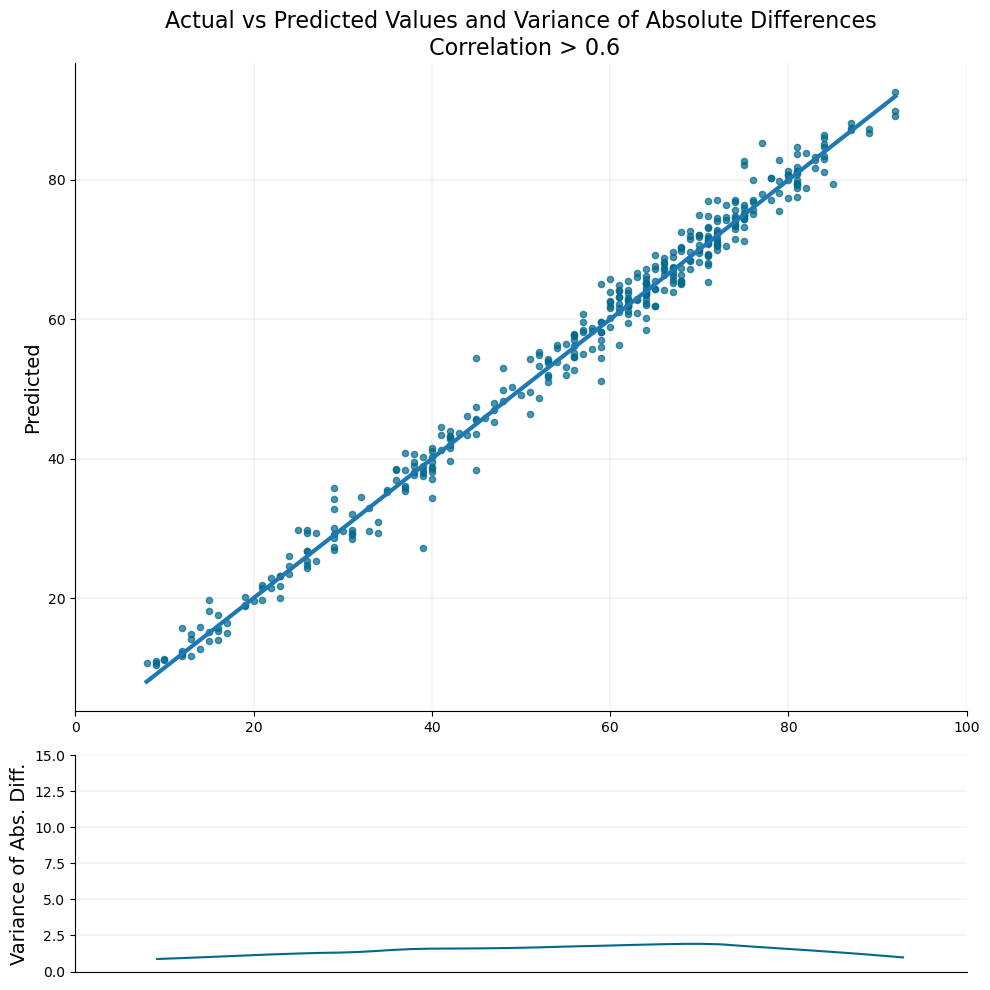

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
37it [00:00, 357.92it/s]



Model with correlation >= 0.7:
Training+Validation R^2: 0.99402, RMSE: 1.47055
Testing R^2: 0.98509, RMSE: 2.50966
Mean cross-validation score: 0.9836

              Feature  Importance
7         CPI_EST_avg      0.9648
9        CPI_EST_prev      0.0267
5      NY_GNP_PCAP_CD      0.0015
8  NY_GDP_PCAP_KD_rel      0.0014
4      NY_GDP_PCAP_KD      0.0013
6   SP_DYN_LE00_MA_IN      0.0010
0      IT_NET_USER_ZS      0.0009
1   NE_CON_PRVT_PC_KD      0.0008
2   NY_ADJ_NNTY_PC_CD      0.0008
3      NY_GDP_PCAP_CD      0.0008


                    country  year  CPI_EST
115    United Arab Emirates  2012     32.0
116    United Arab Emirates  2013     31.0
117    United Arab Emirates  2014     30.0
118    United Arab Emirates  2015     30.0
119    United Arab Emirates  2016     34.0
...                     ...   ...      ...
13729              Zimbabwe  2018     78.0
13730              Zimbabwe  2019     76.0
13731              Zimbabwe  2020     76.0
13732              Zimbabwe  2021     77.

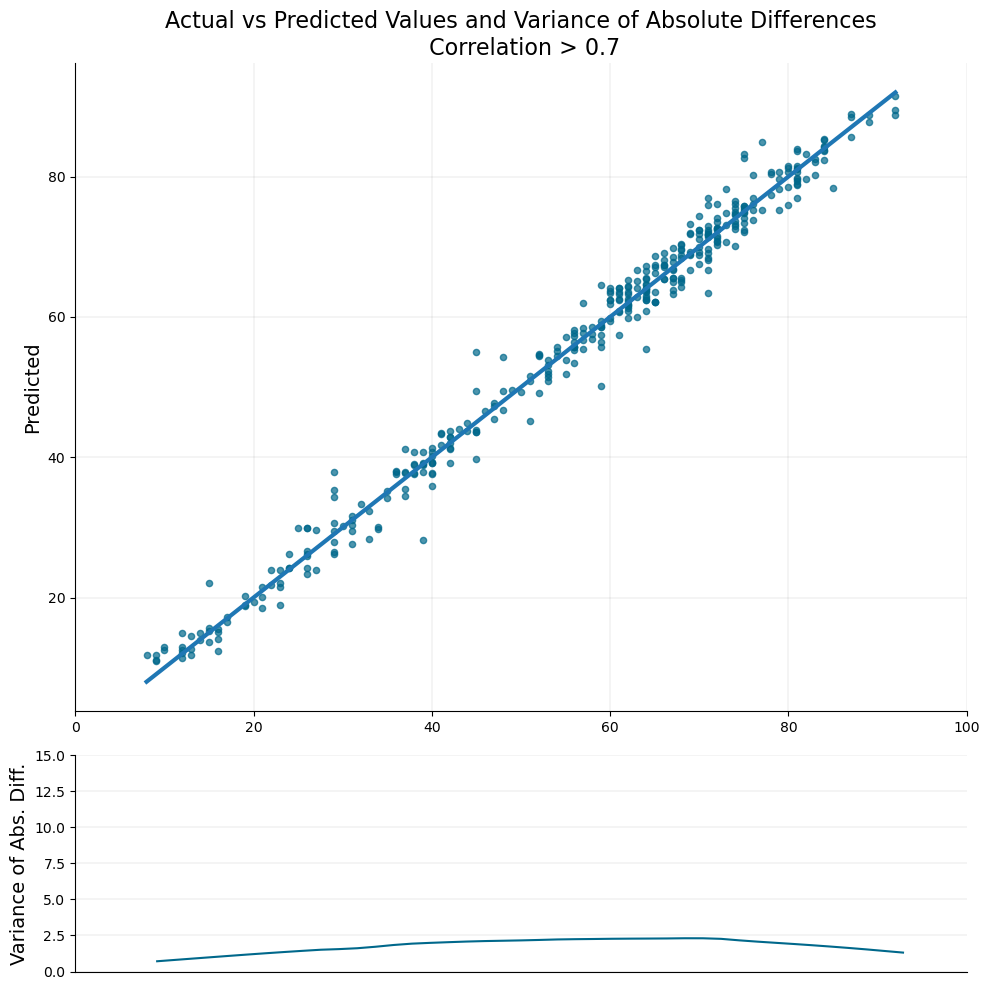

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
28it [00:00, 143.35it/s]



Model with correlation >= 0.8:
Training+Validation R^2: 0.99142, RMSE: 1.76257
Testing R^2: 0.98562, RMSE: 2.46421
Mean cross-validation score: 0.98382

             Feature  Importance
3        CPI_EST_avg      0.9690
4       CPI_EST_prev      0.0270
2     NY_GNP_PCAP_CD      0.0019
1  NY_ADJ_NNTY_PC_CD      0.0011
0  NE_CON_PRVT_PC_KD      0.0010


                    country  year  CPI_EST
115    United Arab Emirates  2012     32.0
116    United Arab Emirates  2013     31.0
117    United Arab Emirates  2014     30.0
118    United Arab Emirates  2015     30.0
119    United Arab Emirates  2016     34.0
...                     ...   ...      ...
13729              Zimbabwe  2018     78.0
13730              Zimbabwe  2019     76.0
13731              Zimbabwe  2020     76.0
13732              Zimbabwe  2021     77.0
13733              Zimbabwe  2022     77.0

[1919 rows x 3 columns]


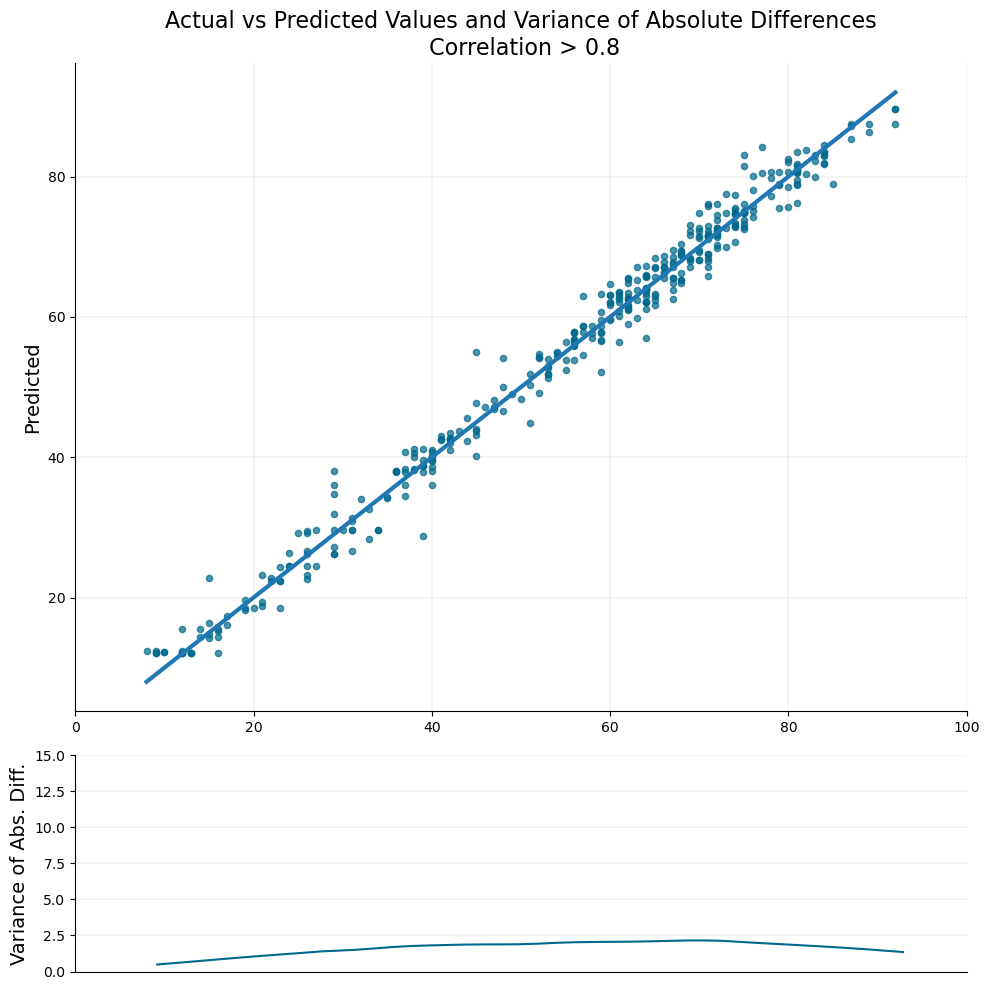

In [241]:
## TESTS ACROSS DIFFERENT CORRLATORY LEVELS
# Set the style to 'default' to make the background white
style.use('default')

# Replace 'vars_full' with your actual list of variables, excluding 'iso2c', 'country', and 'CC_EST'
vars_full = [var for var in df.columns if var not in ['iso2c', 'country', 'CPI_EST']]

print("Running model on full dataset")
for i in range(0, 9):
    # Calculate the correlation of each variable with 'CC_EST'
    correl = df[vars_full].select_dtypes(include=['number']).corrwith(df['CPI_EST']).abs()

    # Get the variables with a correlation greater than or equal to the threshold
    vars_correl = correl[correl >= 0.1 * i].index.tolist()

    results = build_and_evaluate_model(df, 'CPI_EST', vars_correl, n_leads=2)

    print(f"\nModel with correlation >= 0.{i}:")
    print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
    print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
    print(f"Mean cross-validation score: {results[4]}\n")
    print(results[5])  # Feature importances
    print('\n')
    print(results[9][['country', 'year', 'CPI_EST']])

    # Generate the graphs
    y_test = results[8]
    y_test_pred = results[7]

    # Create a scatter plot for the actual vs predicted values
    abs_diffs = np.abs(y_test - y_test_pred)

    # Create a DataFrame with the actual values and absolute differences
    df_plot = pd.DataFrame({'Actual': y_test, 'AbsDifference': abs_diffs})

    # Define the bins for the actual values
    bins = np.linspace(0, 100, 50)

    # Calculate the mid-points of the bins
    bin_midpoints = bins[:-1] + np.diff(bins) / 2

    # Create a new column for the binned actual values
    df_plot['ActualBin'] = pd.cut(df_plot['Actual'], bins, labels=bin_midpoints)

    # Group by the binned actual values and calculate the variance of the absolute differences for each group
    var_abs_diffs = df_plot.groupby('ActualBin')['AbsDifference'].var()

    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
    ax0 = plt.subplot(gs[0])
    ax0.scatter(y_test, y_test_pred, alpha=0.7, color='#00688B', s=20)
    ax0.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], lw=3)
    ax0.set_xlim([0, 100])
    ax0.set_ylabel('Predicted', fontsize=14)
    ax0.set_title(f'Actual vs Predicted Values and Variance of Absolute Differences\n Correlation > 0.{i}', fontsize=16)

    # Hide the right and top spines
    ax0.spines['right'].set_visible(False)
    ax0.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax0.yaxis.set_ticks_position('left')
    ax0.xaxis.set_ticks_position('bottom')

    ax0.grid(True, color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

    # Create a line plot for the binned actual values vs variance of the absolute differences
    ax1 = plt.subplot(gs[1])

    # Apply LOESS to smooth the variance curve
    smoothed = lowess(var_abs_diffs, var_abs_diffs.index, frac=0.5)
    index, data = zip(*smoothed)
    ax1.plot(index, data, color='#00688B')

    ax1.set_ylim([0, 15])
    ax1.set_xlim([0, 100])
    ax1.set_ylabel('Variance of Abs. Diff.', fontsize=14)

    # Hide the right and top spines
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    ax1.set_xticklabels([])
    ax1.set_xticks([])

    # Only show ticks on the left and bottom spines
    ax1.yaxis.set_ticks_position('left')
    ax1.xaxis.set_ticks_position('bottom')

    ax1.grid(axis='y', color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

    plt.tight_layout()
    plt.show()


0it [00:00, ?it/s]

/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
31it [00:00, 642.98it/s]



 Model with selected variables:
Training+Validation R^2: 0.99134, RMSE: 1.77002
Testing R^2: 0.98519, RMSE: 2.50144
Mean cross-validation score: 0.98423

          Feature  Importance
0     CPI_EST_avg      0.9655
3    CPI_EST_prev      0.0311
1  NY_GDP_PCAP_KD      0.0017
2  NY_GDP_PCAP_CD      0.0016


                    country  year  CPI_EST
115    United Arab Emirates  2012     32.0
116    United Arab Emirates  2013     31.0
117    United Arab Emirates  2014     30.0
118    United Arab Emirates  2015     30.0
119    United Arab Emirates  2016     34.0
...                     ...   ...      ...
13729              Zimbabwe  2018     78.0
13730              Zimbabwe  2019     76.0
13731              Zimbabwe  2020     76.0
13732              Zimbabwe  2021     77.0
13733              Zimbabwe  2022     77.0

[1919 rows x 3 columns]


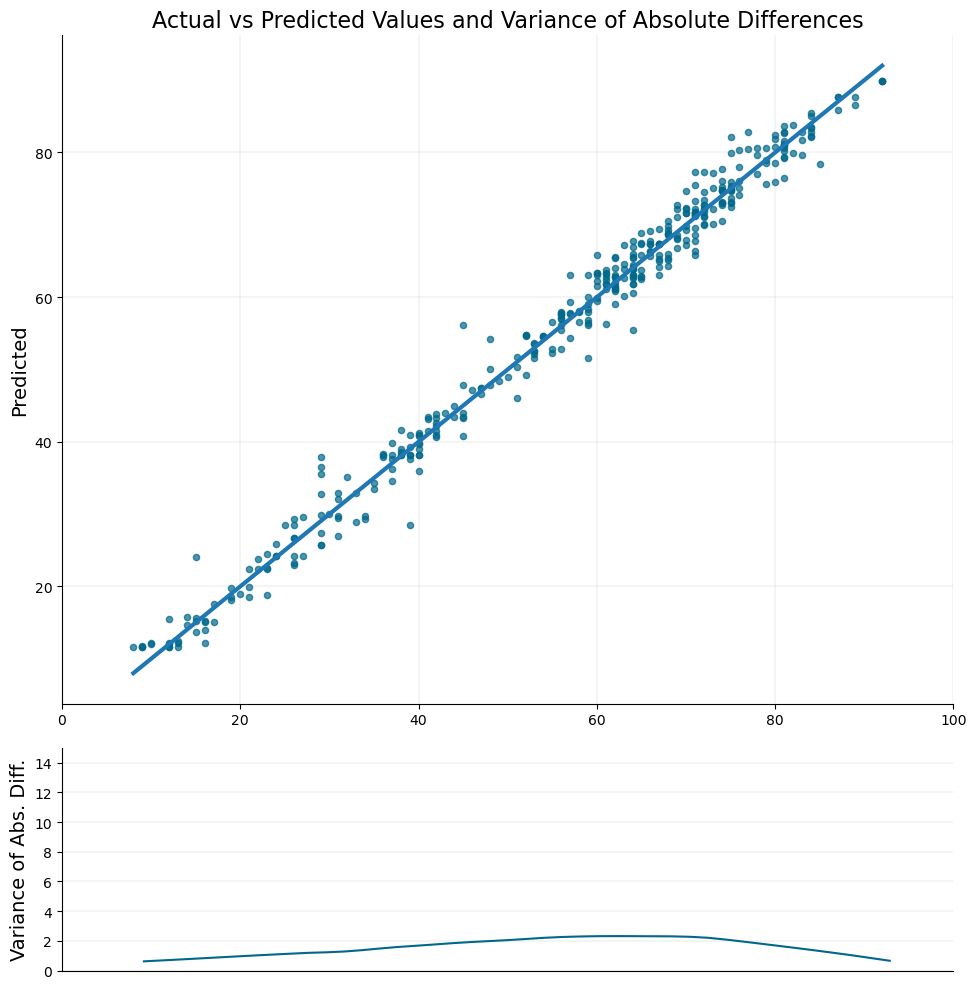

In [242]:
### TESTS FOR SELECTED VARIABLES


# Set the style to 'default' to make the background white
style.use('default')

# Manually selected variables
vars_selected = ['CPI_EST_avg', 'NY_GDP_PCAP_KD', 'NY_GDP_PCAP_CD', 'CPI_EST_prev']

if 'CPI_EST_prev' in vars_selected:
    vars_selected.remove('CPI_EST_prev')

results = build_and_evaluate_model(df, 'CPI_EST', vars_selected, n_leads=2)

print(f"\n Model with selected variables:")
print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
print(f"Mean cross-validation score: {results[4]}\n")
print(results[5])  # Feature importances
print('\n')
print(results[9][['country', 'year', 'CPI_EST']])

# Generate the graphs
y_test = results[8]
y_test_pred = results[7]

# Create a scatter plot for the actual vs predicted values
abs_diffs = np.abs(y_test - y_test_pred)

# Create a DataFrame with the actual values and absolute differences
df_plot = pd.DataFrame({'Actual': y_test, 'AbsDifference': abs_diffs})

# Define the bins for the actual values
bins = np.linspace(0, 100, 50)

# Calculate the mid-points of the bins
bin_midpoints = bins[:-1] + np.diff(bins) / 2

# Create a new column for the binned actual values
df_plot['ActualBin'] = pd.cut(df_plot['Actual'], bins, labels=bin_midpoints)

# Group by the binned actual values and calculate the variance of the absolute differences for each group
var_abs_diffs = df_plot.groupby('ActualBin')['AbsDifference'].var()

# Create a scatter plot for the actual vs predicted values
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
ax0 = plt.subplot(gs[0])
ax0.scatter(y_test, y_test_pred, alpha=0.7, color='#00688B', s=20)
ax0.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], lw=3)
ax0.set_xlim([0, 100])
ax0.set_ylabel('Predicted', fontsize=14)
ax0.set_title('Actual vs Predicted Values and Variance of Absolute Differences', fontsize=16)

# Hide the right and top spines
ax0.spines['right'].set_visible(False)
ax0.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax0.yaxis.set_ticks_position('left')
ax0.xaxis.set_ticks_position('bottom')

ax0.grid(True, color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

# Create a line plot for the binned actual values vs variance of the absolute differences
ax1 = plt.subplot(gs[1])

# Apply LOESS to smooth the variance curve
smoothed = lowess(var_abs_diffs, var_abs_diffs.index, frac=0.5)
index, data = zip(*smoothed)
ax1.plot(index, data, color='#00688B')

ax1.set_ylim([0, 15])
ax1.set_xlim([0, 100])
ax1.set_ylabel('Variance of Abs. Diff.', fontsize=14)

# Hide the right and top spines
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xticklabels([])
ax1.set_xticks([])

# Only show ticks on the left and bottom spines
ax1.yaxis.set_ticks_position('left')
ax1.xaxis.set_ticks_position('bottom')

ax1.grid(axis='y', color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

plt.tight_layout()
plt.show()

In [18]:
country_codes = {country.alpha_2: {'alpha-3': country.alpha_3, 'numeric': country.numeric} for country in pycountry.countries}

# Now you can use this dictionary in your code
df['iso3c'] = df['iso2c'].map(lambda x: country_codes.get(x, {}).get('alpha-3'))
df['iso3n'] = df['iso2c'].map(lambda x: country_codes.get(x, {}).get('numeric'))

In [19]:
## TAKES c.4 MINUTES TO RUN
### TESTS FOR ALL VARIABLES
# Get the unique country codes
countries = df['iso2c'].unique()

# Create a new dataframe to store the results
df_new = pd.DataFrame()

# Get the variables for the model
vars_full = df.columns.tolist()
vars_full.remove('iso3c')
vars_full.remove('iso3n')
vars_full.remove('year')

# Remove 'CC_EST_prev' from vars_full if it's already included
if 'CPI_EST_prev' in vars_full:
    vars_full.remove('CPI_EST_prev')

# Train the model before getting the feature names
results = build_and_evaluate_model(df, 'CPI_EST', vars_full)

# Get the trained model from the results
model = results[10]

# Get the feature names the model was trained on
model_features = model.get_booster().feature_names

# Iterate over each country
for country in tqdm(countries):
    # Get the data for the current country and create a copy of it
    df_country = df[df['iso2c'] == country].copy()

    # Add a new feature for the previous year's CC_EST value
    df_country['CPI_EST_prev'] = df_country.groupby('iso2c')['CPI_EST'].shift()

    # Sort the data in descending order of the year
    df_country = df_country.sort_values('year', ascending=False)

    # Get the latest year in the data
    latest_year = df_country['year'].max()

    # Skip the current country if all its 'year' values are NaN
    if np.isnan(latest_year):
        continue

    latest_year = int(latest_year)

    # Iterate from the latest year to 1970
    for year in range(latest_year, 1959, -1):
        # Check if CC_EST for the current year is NaN
        if df_country.loc[df_country['year'] == year, 'CPI_EST'].isna().any():
            # If it is NaN, use the model to predict CC_EST for that year based on other values
            X = df_country.loc[df_country['year'] == year, model_features]
            
            # Forward fill missing values in X
            X = X.ffill()
            
            y_pred = model.predict(X)

            # Update the data with the predicted value
            df_country.loc[df_country['year'] == year, 'CPI_EST'] = y_pred

    # Append the data for the current country to the new dataframe
    df_new = pd.concat([df_new, df_country])

0it [00:00, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
52it [00:02, 24.96it/s]
100%|██████████| 179/179 [02:42<00:00,  1.10it/s]


In [24]:
# print the results of the build and evaluate model:
print(f"Training+Validation R^2: {results[0]}, RMSE: {results[2]}")
print(f"Testing R^2: {results[1]}, RMSE: {results[3]}")
print(f"Mean cross-validation score: {results[4]}\n")
print(results[5])  # Feature importances

Training+Validation R^2: 0.99942, RMSE: 0.45797
Testing R^2: 0.98507, RMSE: 2.51129
Mean cross-validation score: 0.98424

                Feature  Importance
518         CPI_EST_avg      0.8700
521        CPI_EST_prev      0.0307
519  NY_GDP_PCAP_KD_rel      0.0049
415   SP_POP_1564_MA_IN      0.0025
119   EN_ATM_CO2E_GF_KT      0.0023
..                  ...         ...
256      NV_IND_TOTL_CD      0.0000
248      NV_AGR_TOTL_KN      0.0000
246      NV_AGR_TOTL_KD      0.0000
243      NE_TRD_GNFS_ZS      0.0000
261      NV_IND_TOTL_ZS      0.0000

[522 rows x 2 columns]


In [25]:
# Give a relative rank of CC_EST for each country in each year
df_new['CPI_EST_rank'] = df_new.groupby('year')['CPI_EST'].rank(pct=True)

# Give a rank of CC_EST for each country in each year as integers
df_new['CPI_EST_rank_int'] = df_new.groupby('year')['CPI_EST'].rank(method='dense', ascending=True)

In [45]:
# Append the new data of iso2c, year, CC_EST, CC_EST_rank, and CC_EST_rank_int to a new csv file
df_new[['iso2c', 'year', 'CPI_EST', 'CPI_EST_rank', 'CPI_EST_rank_int']].to_csv('backcasted_corruption_data.csv', index=False)

In [26]:
# Print the mean, median, and range of predicted values for CC_EST in 1960, with the countries that have the highest and lowest values
# Get the mean, median, and range of predicted values for CC_EST in 1960
mean_1960 = round(df_new[df_new['year'] == 1960]['CPI_EST'].mean(), 3)
median_1960 = round(df_new[df_new['year'] == 1960]['CPI_EST'].median(), 3)
range_1960 = round(df_new[df_new['year'] == 1960]['CPI_EST'].max() - df_new[df_new['year'] == 1960]['CPI_EST'].min(), 3)

# Get the countries with the highest and lowest predicted values for CC_EST in 1960
highest_1960 = df_new[df_new['year'] == 1960].sort_values('CPI_EST', ascending=False).iloc[0]['country']
lowest_1960 = df_new[df_new['year'] == 1960].sort_values('CPI_EST').iloc[0]['country']

print(f"The mean predicted value for CPI_EST in 1960 is {mean_1960}")
print(f"The median predicted value for CPI_EST in 1960 is {median_1960}")
print(f"The range of predicted values for CPI_EST in 1960 is {range_1960}")
print(f"The country with the highest predicted value for CPI_EST in 1960 is {highest_1960} with a value of {df_new[df_new['year'] == 1960].sort_values('CPI_EST', ascending=False).iloc[0]['CPI_EST']}")
print(f"The country with the lowest predicted value for CPI_EST in 1960 is {lowest_1960} with a value of {df_new[df_new['year'] == 1960].sort_values('CPI_EST').iloc[0]['CPI_EST']}")

The mean predicted value for CPI_EST in 1960 is 57.69
The median predicted value for CPI_EST in 1960 is 62.035
The range of predicted values for CPI_EST in 1960 is 67.717
The country with the highest predicted value for CPI_EST in 1960 is South Sudan with a value of 84.58109283447266
The country with the lowest predicted value for CPI_EST in 1960 is New Zealand with a value of 16.864179611206055


In [27]:
# Print the country that has gotten worse by the most and the country that has improved by the most
# Calculate the change in CC_EST for each country between 1960 and 2022
df_change = df_new.pivot(index='iso2c', columns='year', values='CPI_EST')
df_change['change'] = df_change[2022] - df_change[1960]

# Get the country that has gotten worse by the most and the country that has improved by the most
most_improved = df_change['change'].idxmax()
most_worsened = df_change['change'].idxmin()

print(f"The country that has improved the most between 1970 and 2022 is {df_new[df_new['iso2c'] == most_improved].iloc[0]['country']} with a change of {df_change.loc[most_improved, 'change']}")
print(f"The country that has worsened the most between 1970 and 2022 is {df_new[df_new['iso2c'] == most_worsened].iloc[0]['country']} with a change of {df_change.loc[most_worsened, 'change']}")

# List worst to best
# Create a mapping of country codes to country names
country_mapping = df_new.set_index('iso2c')['country'].drop_duplicates()

# Map the country codes in df_change to country names
df_change['country'] = df_change.index.map(country_mapping)
# Sort df_change by 'change' in descending order and display the top 10
df_change.sort_values('change', ascending=True)[['country', 'change']].head(10)

The country that has improved the most between 1970 and 2022 is Azerbaijan with a change of 11.751197814941406
The country that has worsened the most between 1970 and 2022 is Angola with a change of -11.129158020019531


year,country,change
iso2c,,
AO,Angola,-11.129158
DK,Denmark,-10.155420
IT,Italy,-9.794922
VN,Viet Nam,-9.566093
UZ,Uzbekistan,-9.026062
SC,Seychelles,-8.288765
GR,Greece,-7.994835
TL,Timor-Leste,-7.528000
AM,Armenia,-7.403732


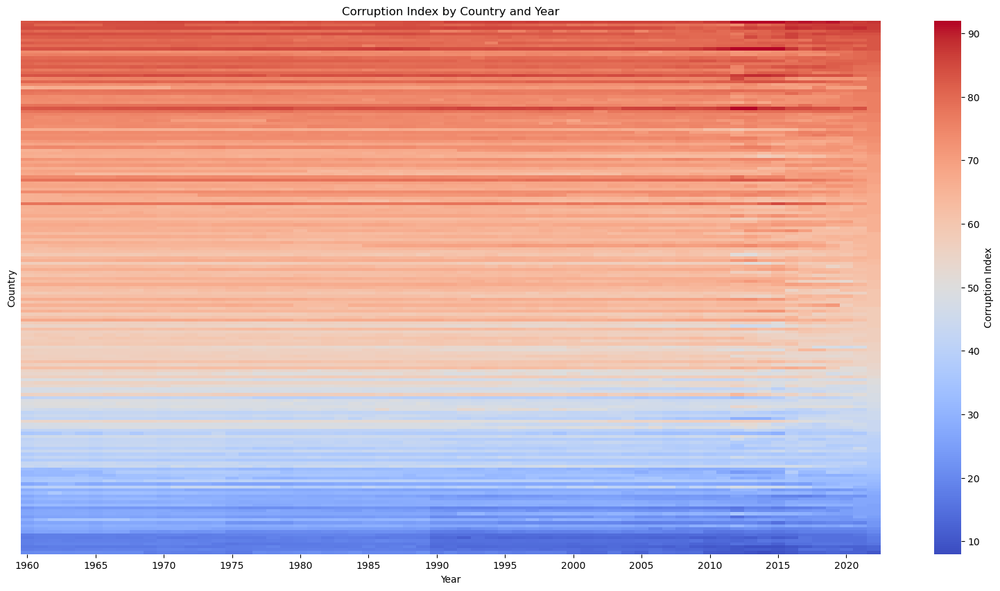

In [28]:
# Graphically illustrage the generale moves of country and corruption levels over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CPI_EST')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, dont show country labels, and 1970 to 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Corruption Index'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

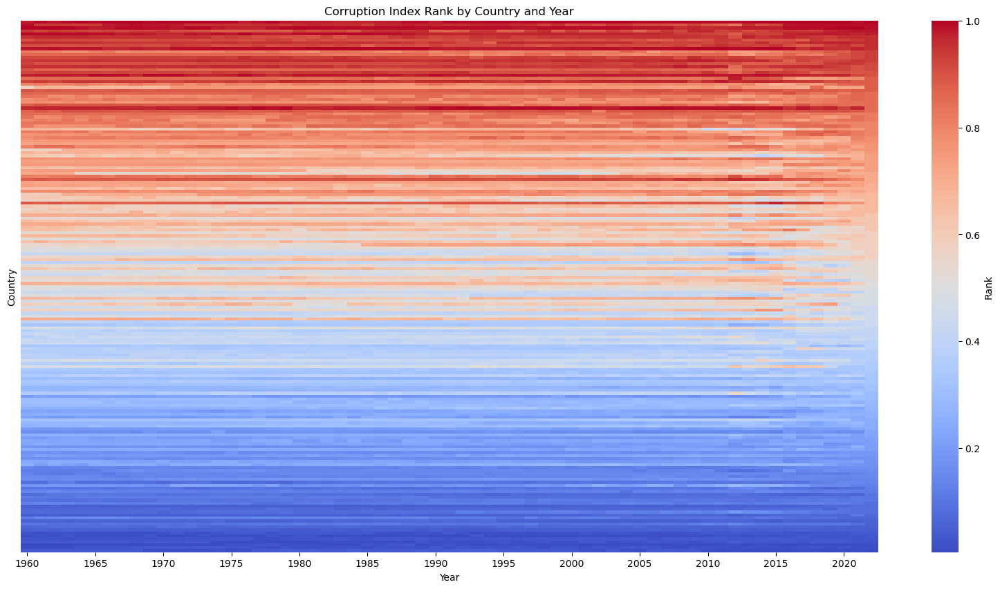

In [29]:
# Plot changes in country ranks over time
# Create a pivot table of the data for the heatmap
df_heatmap = df_new.pivot(index='country', columns='year', values='CPI_EST_rank')
df_heatmap = df_heatmap.sort_values(by=2022, ascending=False)

# Create a heatmap of the data, don't show country labels, and 1970 to 2022, ranking from lowest to highest in 2022
plt.figure(figsize=(20, 10))
sns.heatmap(df_heatmap, cmap='coolwarm', cbar_kws={'label': 'Rank'}, xticklabels=5, yticklabels=False)
plt.xlim(0, 63)
plt.title('Corruption Index Rank by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()


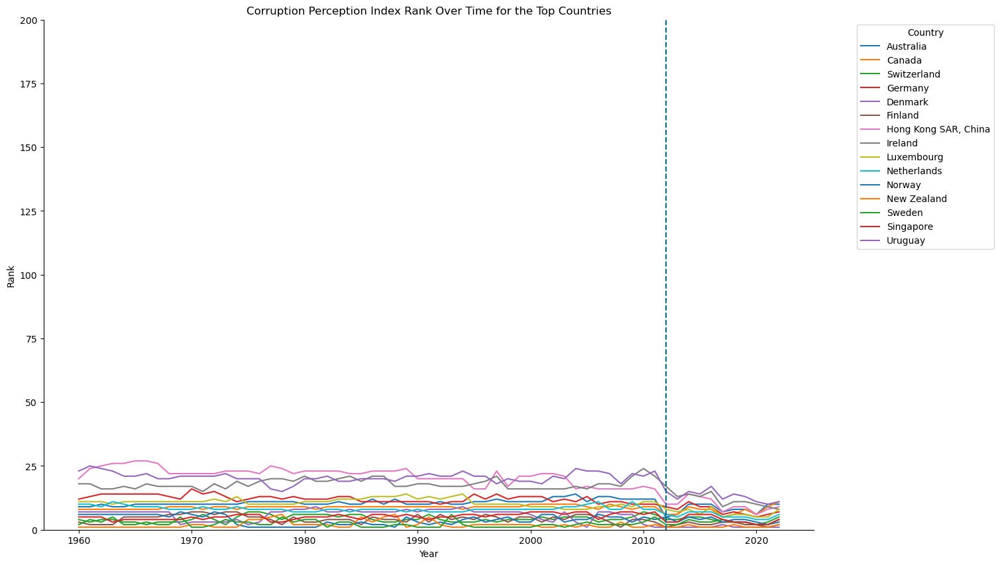

In [30]:
style.use('default')

# Plot graph of CC_EST_rank_int for the top 10 countries with the highest rank in 2022
# Get the 40 countryies around 150 countries with the highest rank in 2022
top_countries = df_heatmap[2022].sort_values(ascending=True).head(15).index

# Filter the data for the top 10 countries
df_top = df_new[df_new['country'].isin(top_countries)]

# Create a line plot of the rank over time for the top 10 countries
plt.figure(figsize=(15, 10))
sns.lineplot(data=df_top, x='year', y='CPI_EST_rank_int', hue='country', palette='tab10')
plt.axvline(x=2012, color='#00688B', linestyle='--')
plt.title('Corruption Perception Index Rank Over Time for the Top Countries')
plt.ylim(0, 200)
plt.xlabel('Year')
plt.ylabel('Rank')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
sns.despine()
plt.show()

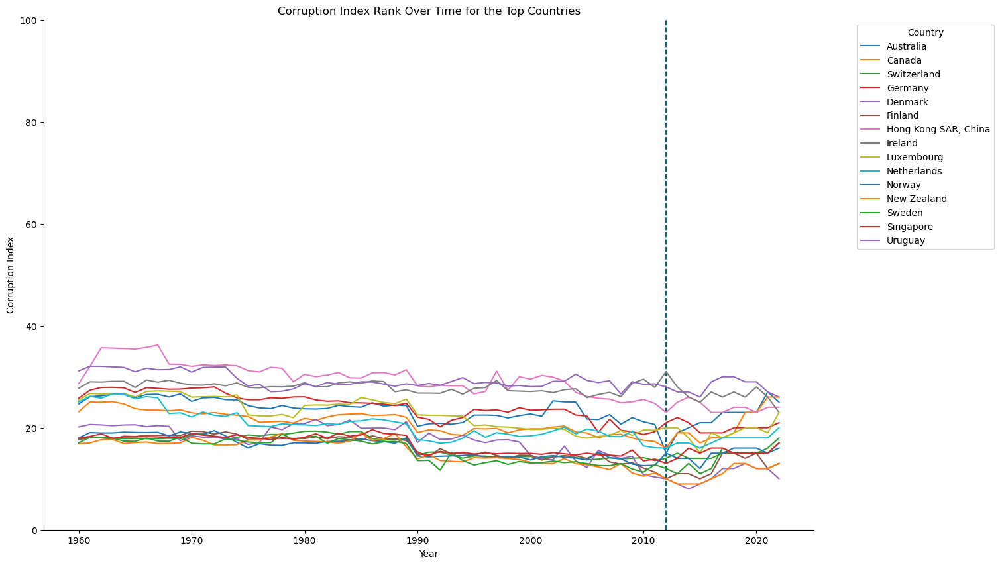

In [32]:
style.use('default')

# Plot graph of CC_EST_rank_int for the top 10 countries with the highest rank in 2022
# Get the top 10 countries with the highest rank in 2022
top_countries = df_heatmap[2022].sort_values(ascending=True).head(15).index

# Filter the data for the top 10 countries
df_top = df_new[df_new['country'].isin(top_countries)]

# Create a line plot of the rank over time for the top 10 countries
plt.figure(figsize=(15, 10))
plt.axvline(x=2012, color='#00688B', linestyle='--')
sns.lineplot(data=df_top, x='year', y='CPI_EST', hue='country', palette='tab10')
plt.ylim(0, 100)
plt.title('Corruption Index Rank Over Time for the Top Countries')
plt.xlabel('Year')
plt.ylabel('Corruption Index')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
sns.despine()

plt.show()

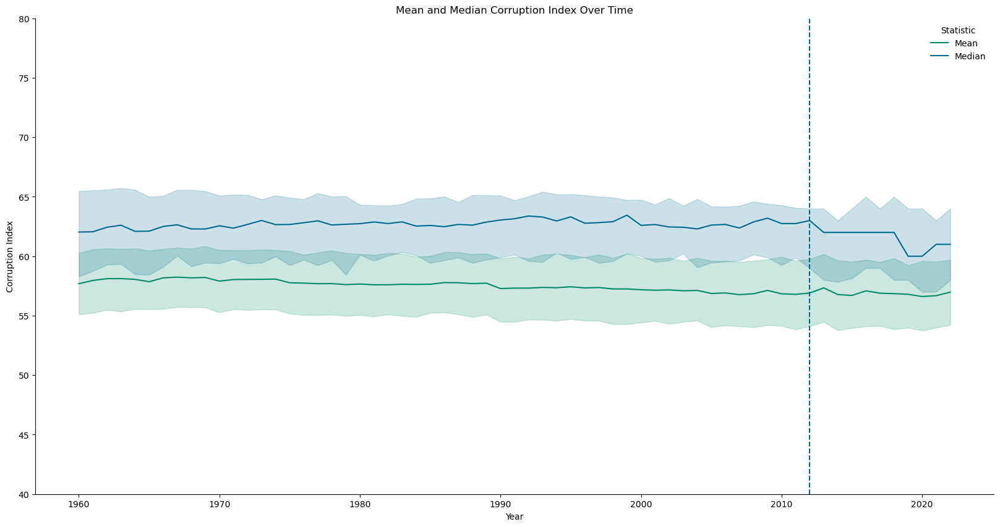

In [256]:
# Plot the aggregate mean and median CC_EST values (all countries together) over time in a line graph
# Create a line plot of the mean and median CC_EST values over time
plt.figure(figsize=(20, 10))
sns.lineplot(data=df_new, x='year', y='CPI_EST', estimator='mean', label='Mean', color = '#008B68')
sns.lineplot(data=df_new, x='year', y='CPI_EST', estimator='median', label='Median', color = '#00688B')
plt.axvline(x=2012, color='#00688B', linestyle='--')
plt.title('Mean and Median Corruption Index Over Time')
plt.ylim(40,80)
plt.xlabel('Year')
plt.ylabel('Corruption Index')
plt.legend(title='Statistic', frameon=False)
sns.despine()
plt.show()


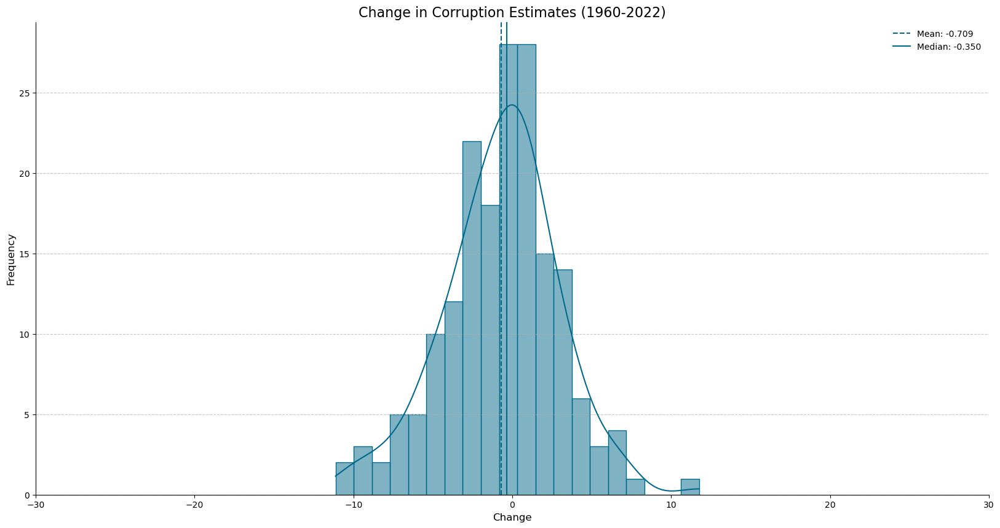

In [257]:
# Plot a histogram of the average yearly change in CC_EST
plt.figure(figsize=(20, 10))
sns.histplot(df_change['change'], bins=20,color='#00688B', edgecolor='#00688B', kde=True)

# Calculate the mean and median
mean = df_change['change'].mean()
median = df_change['change'].median()

# Add lines for the mean and median
plt.axvline(mean, color='#00688B', linestyle='--', label=f'Mean: {mean:.3f}')
plt.axvline(median, color='#00688B', linestyle='-', label=f'Median: {median:.3f}')

# Customize the title and labels
plt.title('Change in Corruption Estimates (1960-2022)', fontsize=16)
plt.xlabel('Change', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xlim(-30,30)

# Customize the grid
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(frameon=False)

# Remove the top and right spines
sns.despine()

plt.show()

/var/folders/1z/rmhh3bk123qg9411_qfj88580000gn/T/ipykernel_9509/3235363529.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_filtered = df_new[(df_new['year'] >= 1960) & (df['year'] < 2012)]


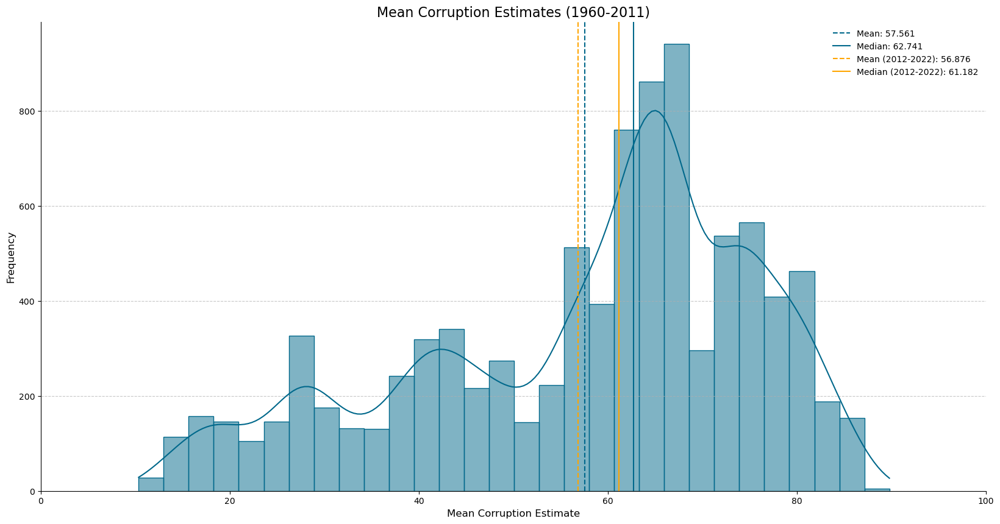

In [55]:
# Filter the DataFrame to include only the years between 1960 and 2011
df_filtered = df_new[(df_new['year'] >= 1960) & (df['year'] < 2012)]

plt.figure(figsize=(20, 10))
sns.histplot(df_filtered['CPI_EST'], bins=30, color='#00688B', edgecolor='#00688B', kde=True)

# calculate the means of the corruption estimates between 2012 and 2022
mean_cc_est_2012_2022 = df_new[(df_new['year'] >= 2012) & (df_new['year'] <= 2022)].groupby('iso2c')['CPI_EST'].mean()
median_cc_est_2012_2022 = df_new[(df_new['year'] >= 2012) & (df_new['year'] <= 2022)].groupby('iso2c')['CPI_EST'].median()

mean_2012_2022 = mean_cc_est_2012_2022.mean()
median_2012_2022 = mean_cc_est_2012_2022.median()

# Calculate the mean and median
mean = df_filtered['CPI_EST'].mean()
median = df_filtered['CPI_EST'].median()

# Add lines for the mean and median
plt.axvline(mean, color='#00688B', linestyle='--', label=f'Mean: {mean:.3f}')
plt.axvline(median, color='#00688B', linestyle='-', label=f'Median: {median:.3f}')
plt.axvline(mean_2012_2022, color='orange', linestyle='--', label=f'Mean (2012-2022): {mean_2012_2022:.3f}')
plt.axvline(median_2012_2022, color='orange', linestyle='-', label=f'Median (2012-2022): {median_2012_2022:.3f}')

# Customize the title and labels
plt.title('Mean Corruption Estimates (1960-2011)', fontsize=16)
plt.xlabel('Mean Corruption Estimate', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xlim(0,100)


# Customize the grid
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(frameon=False)

# Remove the top and right spines
sns.despine()

plt.show()

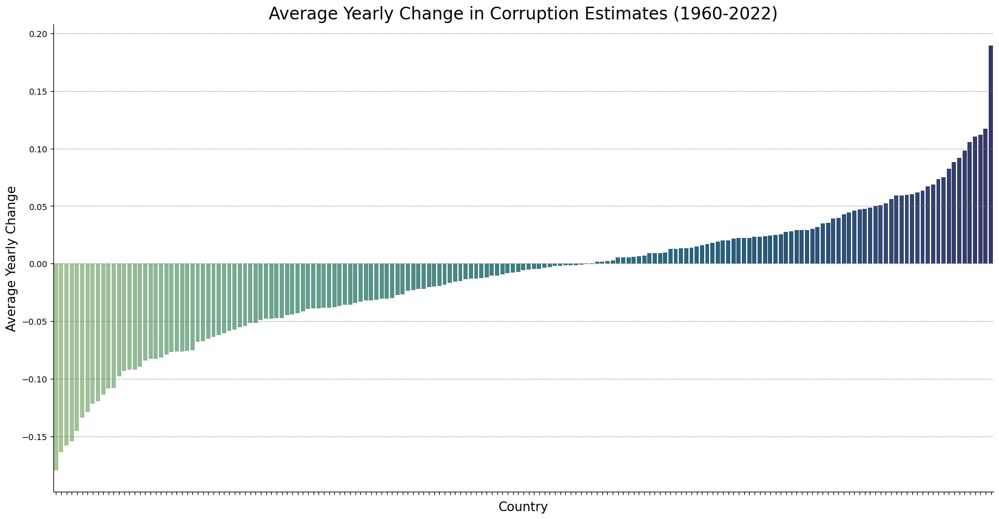

In [258]:
# Calculate the average change in CC_EST between years
df_change = df_new.pivot(index='iso2c', columns='year', values='CPI_EST')
df_change['change'] = (df_change[2022] - df_change[1960]) / (2022 - 1960)

# Sort the DataFrame in ascending order by 'change'
df_change = df_change.sort_values(by='change')

fig, ax = plt.subplots(figsize=(20, 10))

sns.barplot(x=df_change.index, y='change', data=df_change, ax=ax, palette='crest')

ax.set_title('Average Yearly Change in Corruption Estimates (1960-2022)', fontsize=20)
ax.set_xlabel('Country', fontsize=15)
ax.set_ylabel('Average Yearly Change', fontsize=15)

ax.set_xticklabels([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.grid(color='gray', linestyle='--', linewidth=0.5, axis='y')

plt.show()

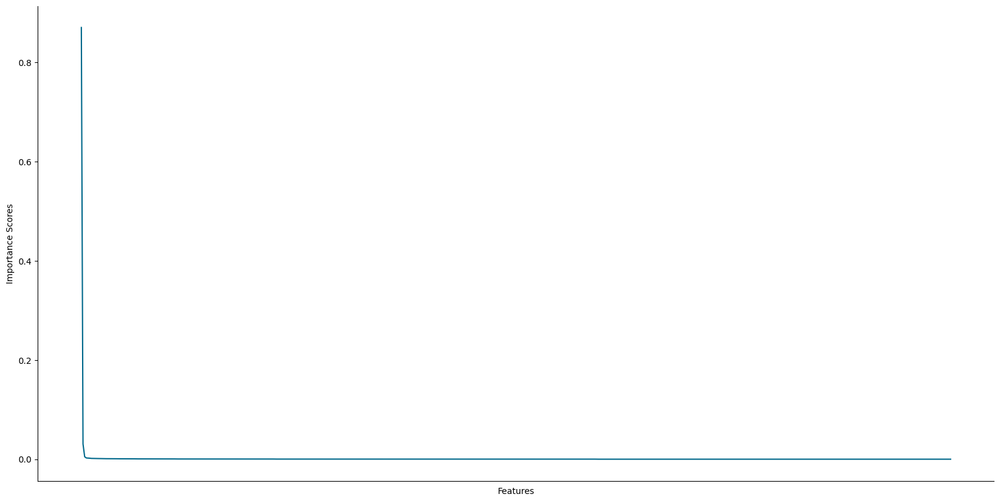

In [260]:
# Convert the list of tuples to a dictionary
importances_dict = results[5].set_index('Feature')['Importance'].to_dict()

# Extract feature names
features = list(importances_dict.keys())

# Since all values are already floats, there's no need to calculate the mean
importance_scores = list(importances_dict.values())

# Create a 2D line plot
fig, ax = plt.subplots(figsize=(20, 10))

# Create a sequence of numbers for the x-axis
x = np.arange(len(features))

# Create the 2D line plot
ax.plot(x, importance_scores, color='#00688B')

# Set the ticks on the x-axis to be the new labels and remove the lines (ticks)
ax.set_xticks(x, minor=False)
ax.set_xticklabels([])
ax.tick_params(axis='x', which='both', length=0)

# Set labels
ax.set_xlabel('Features')
ax.set_ylabel('Importance Scores')

sns.despine()

# Show the plot
plt.show()

In [56]:
# create df_new_morphed that is df with cc_est replaced with CC_EST from df_new
df_new_morphed = df.copy()
df_new_morphed['CPI_EST'] = df_new['CPI_EST']

# Add columns for CC_EST_rank and CC_EST_rank_int
df_new_morphed['CPI_EST_rank'] = df_new['CPI_EST_rank']
df_new_morphed['CPI_EST_rank_int'] = df_new['CPI_EST_rank_int']

# Save the morphed data to a new CSV file
df_new_morphed.to_csv('df_model4.csv', index=False)

In [262]:
### TAKES AROUND 12 MINUTES
# Calculate the absolute correlation of each variable with the target variable
df_numeric = df[vars_full].apply(pd.to_numeric, errors='coerce')

# Calculate the absolute correlation of each variable with the target variable
correl = df_numeric.corrwith(df['CPI_EST']).abs()

# Sort the variables by their correlation with the target variable
vars_sorted = correl.sort_values(ascending=False).index.tolist()

results = []
tree_depths = []
r2_scores = []

# Set the maximum number of variables to 10 or the total number of variables, whichever is smaller
max_vars = min(100, len(vars_sorted))


class TqdmCallback(xgb.callback.TrainingCallback):
    def __init__(self, bar):
        self._bar = bar

    def after_iteration(self, model, epoch, evals_log):
        self._bar.update(1)
        return False

# Create a progress bar
with tqdm(total=max_vars) as pbar:
    model = XGBRegressor(
        objective='reg:squarederror',
        random_state=0,
        alpha=1.0,
        reg_lambda=10.0,
        early_stopping_rounds=10,
        callbacks=[TqdmCallback(pbar)]
    )


# Create a progress bar
with tqdm(total=max_vars) as pbar:
    # Iterate over the number of variables to include in the model
    for i in range(1, max_vars + 1):
        # Select the top i variables
        vars_selected = vars_sorted[:i]

        # Build and evaluate the model with the selected variables
        try:
            result = build_and_evaluate_model(df, 'CPI_EST', vars_selected, n_leads=2)
        except Exception as e:
            print(f"Error while building model with variables {vars_selected}: {e}")
            continue

        # Store the result
        results.append(result)

        # Access the R^2 score for the test set
        r2_test = result[1]

        # Store the R^2 score
        r2_scores.append(r2_test)

        model = result[10]

        # Retrieve the 'max_depth' parameter from the model's parameters
        tree_depth = model.get_params().get('max_depth', 'Not set')

        # Store the tree depth
        tree_depths.append(tree_depth)

        # Update the progress bar description
        pbar.set_description(f"Number of variables: {i}, R^2: {r2_test:.2f}, Tree Depth: {tree_depth}")

        # Update the progress bar
        pbar.update()

  0%|          | 0/100 [00:00<?, ?it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
89it [00:00, 1283.27it/s]
Number of variables: 1, R^2: 0.90, Tree Depth: None:   1%|          | 1/100 [00:00<00:28,  3.53it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
31it [00:00, 682.85it/s]
Number of variables: 2, R^2: 0.99, Tree Depth: None:   2%|▏         | 2/100 [00:00<00:25,  3.91it/s]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` i

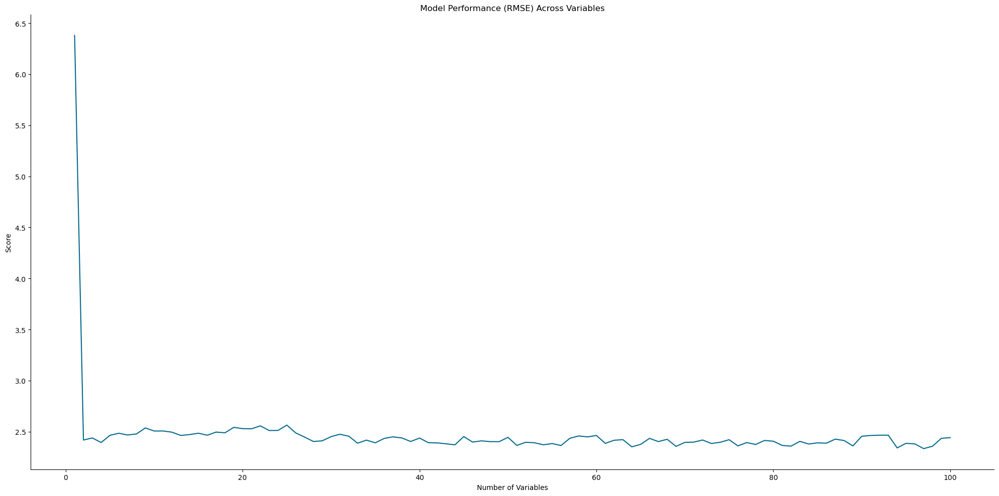

In [263]:
# Plot
fig, ax = plt.subplots(figsize=(20, 10))

# Line plot of R^2 and RMSE across different thresholds
r2_scores = [res[1] for res in results]
rmse_scores = [res[3] for res in results]
num_vars = range(1, max_vars + 1)
ax.plot(num_vars, rmse_scores,color='#00688B')
ax.set_xlabel('Number of Variables')
ax.set_ylabel('Score')
ax.set_title('Model Performance (RMSE) Across Variables')
sns.despine()

plt.tight_layout()
plt.show()

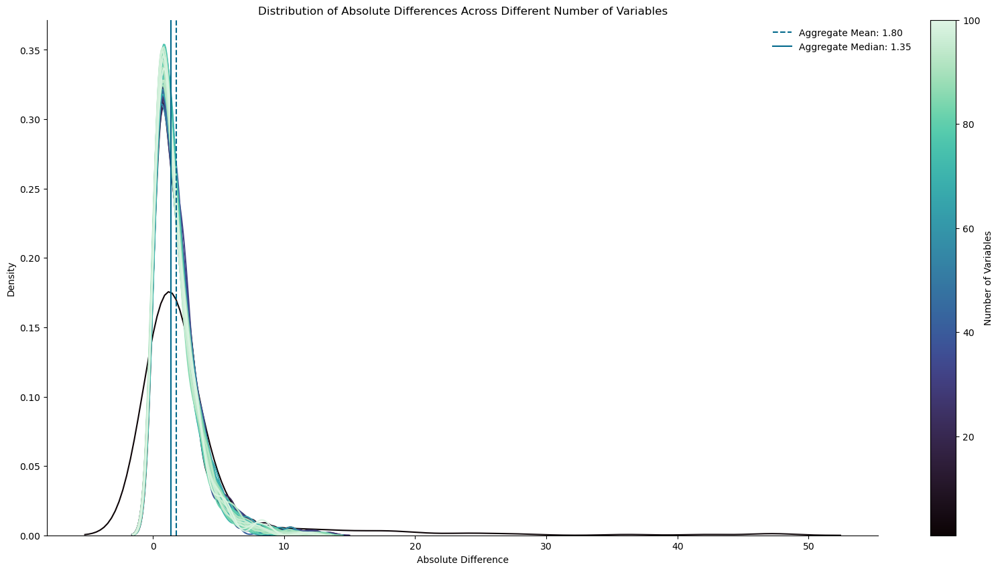

In [264]:
# Calculate the absolute differences for each model
abs_diffs = [abs(res[7] - res[8]) for res in results]

# Create a new subplot for the variance plot
fig, ax = plt.subplots(figsize=(20, 10))

# Get a color map
colors = sns.color_palette("mako", len(abs_diffs))

# KDE plot of the absolute differences for each model
for i, abs_diff in enumerate(abs_diffs):
    sns.kdeplot(abs_diff, color=colors[i], ax=ax)

# Calculate the aggregate mean and median of the absolute differences
mean_abs_diff = np.mean([np.mean(abs_diff) for abs_diff in abs_diffs])
median_abs_diff = np.median([np.median(abs_diff) for abs_diff in abs_diffs])

# Add a vertical line at the aggregate mean and median
ax.axvline(mean_abs_diff, color='#00688B', linestyle='--', label=f'Aggregate Mean: {mean_abs_diff:.2f}')
ax.axvline(median_abs_diff, color='#00688B', linestyle='-', label=f'Aggregate Median: {median_abs_diff:.2f}')

ax.set_xlabel('Absolute Difference')
ax.set_title('Distribution of Absolute Differences Across Different Number of Variables')

# Create a colorbar
norm = Normalize(vmin=1, vmax=len(abs_diffs))
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=sns.color_palette("mako", as_cmap=True)), ax=ax)
cbar.set_label('Number of Variables')

ax.legend(bbox_to_anchor=(1.05, 1), frameon=False)
sns.despine()

plt.show()

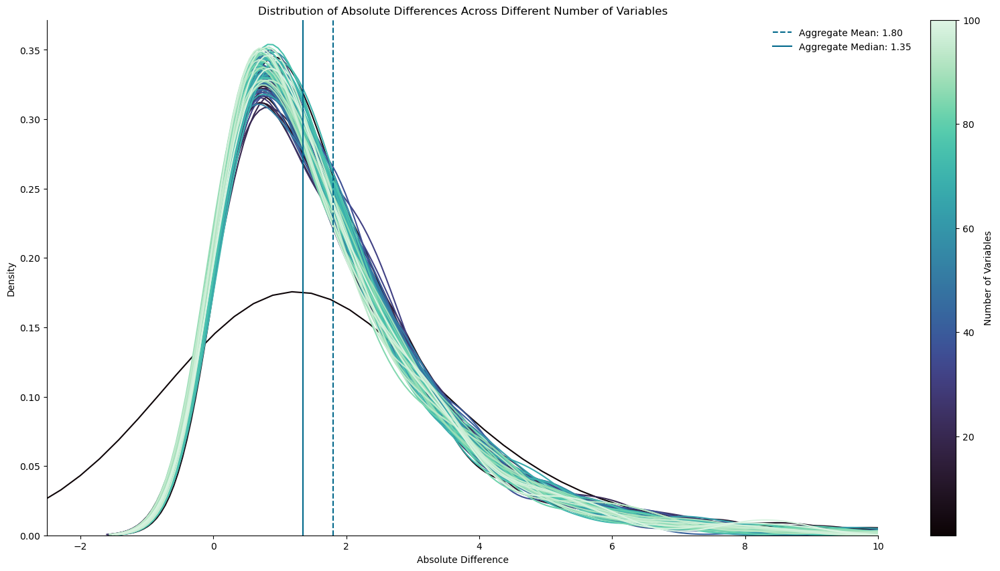

In [265]:
# Calculate the absolute differences for each model
abs_diffs = [abs(res[7] - res[8]) for res in results]

# Create a new subplot for the variance plot
fig, ax = plt.subplots(figsize=(20, 10))

# Get a color map
colors = sns.color_palette("mako", len(abs_diffs))

# KDE plot of the absolute differences for each model
for i, abs_diff in enumerate(abs_diffs):
    sns.kdeplot(abs_diff, color=colors[i], ax=ax)

# Calculate the aggregate mean and median of the absolute differences
mean_abs_diff = np.mean([np.mean(abs_diff) for abs_diff in abs_diffs])
median_abs_diff = np.median([np.median(abs_diff) for abs_diff in abs_diffs])

# Add a vertical line at the aggregate mean and median
ax.axvline(mean_abs_diff, color='#00688B', linestyle='--', label=f'Aggregate Mean: {mean_abs_diff:.2f}')
ax.axvline(median_abs_diff, color='#00688B', linestyle='-', label=f'Aggregate Median: {median_abs_diff:.2f}')

ax.set_xlabel('Absolute Difference')
ax.set_title('Distribution of Absolute Differences Across Different Number of Variables')
ax.set_xlim(-2.5,10)

# Create a colorbar
norm = Normalize(vmin=1, vmax=len(abs_diffs))
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=sns.color_palette("mako", as_cmap=True)), ax=ax)
cbar.set_label('Number of Variables')

ax.legend(bbox_to_anchor=(1.05, 1), frameon=False)
sns.despine()

plt.show()

/var/folders/1z/rmhh3bk123qg9411_qfj88580000gn/T/ipykernel_37400/1165927619.py:27: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Number of Variables')


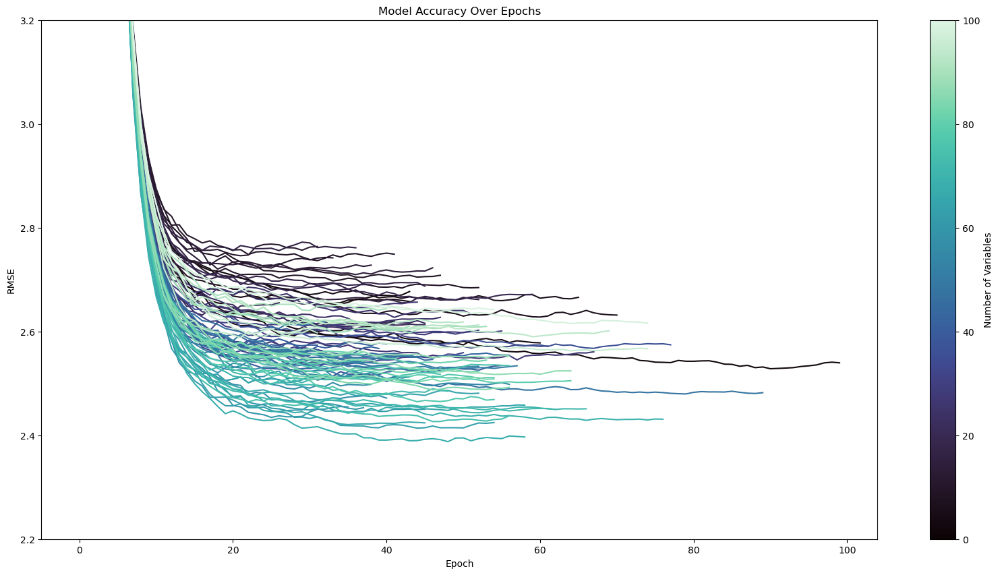

In [273]:
# Create a new subplot for the scatter plot
fig, ax = plt.subplots(figsize=(20, 10))

# Create a colormap
cmap = sns.color_palette("mako", as_cmap=True)

# Calculate the number of lines to plot
num_lines = len(results)

# Scatter plot of the model accuracy over epochs for all models
for i, res in enumerate(results):
    # Calculate the color for the current line
    color = cmap(i / num_lines)
    
    ax.plot(range(len(res[10].evals_result()['validation_0']['rmse'])), 
            res[10].evals_result()['validation_0']['rmse'], 
            label=f'{len(res[5])} variables', 
            color=color)
    
ax.set_xlabel('Epoch')
ax.set_ylabel('RMSE')
ax.set_title('Model Accuracy Over Epochs')
ax.set_ylim(2.2, 3.2)

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=num_lines))
plt.colorbar(sm, label='Number of Variables')

plt.show()

In [267]:
def custom_objective(y_true, y_pred):
    """
    Custom objective function that penalizes predictions close to or beyond the bounds of 0 and 100,
    penalizes large changes from the previous year's prediction, and penalizes an overall movement greater than 20 from the 2012 value.
    Also penalizes the overreliance on the 'CPI_EST_avg' feature.
    """
    # Convert y_true and y_pred to pandas Series
    y_true = pd.Series(y_true)
    y_pred = pd.Series(y_pred)
    
    # Calculate the squared error
    squared_error = (y_true - y_pred) ** 2
    
    # Calculate the penalty term for the overreliance on the 'CPI_EST_avg' feature
    penalty_CPI_EST_avg = np.abs(y_pred)
    
    # Increase the penalty for the overreliance on the 'CPI_EST_avg' feature
    penalty_CPI_EST_avg *= 100
    
    # Add the penalty terms to the squared error
    penalized_squared_error = squared_error + penalty_CPI_EST_avg
    
    # Calculate the first derivative (gradient) of the penalized squared error
    grad = -2 * (y_true - y_pred) + np.sign(y_pred)
    
    # Calculate the second derivative (Hessian) of the penalized squared error
    hess = np.ones_like(grad) * 2
    
    return grad, hess

class TqdmCallback(xgb.callback.TrainingCallback):
    def __init__(self, bar):
        self._bar = bar

    def after_iteration(self, model, epoch, evals_log):
        self._bar.update(1)
        return False

def build_and_evaluate_model(df, target_col_name, var_list, n_leads=2, max_depth=None):
    """
    Builds, evaluates, and returns results for an XGBoost model.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df = df.copy()

    # Exclude 'iso2c', 'country', target_col_name, and lead variables from var_list
    var_list = [var for var in var_list if var not in ['iso2c', 'country', target_col_name, 'year', 'iso3n'] + [f"{target_col_name}_lead{i}" for i in range(1, n_leads + 1)]]
    if 'CPI_EST_avg' not in var_list:
        var_list.append('CPI_EST_avg')
    
    # Remove rows with invalid values in the target column
    df = df[np.isfinite(df[target_col_name]) & (abs(df[target_col_name]) <= 1e30)]

    # Add a new feature for the previous year's target value
    df[target_col_name + '_prev'] = df.groupby('iso2c')[target_col_name].shift()
    var_list.append(target_col_name + '_prev')

    X = df[var_list]

    df_train_val, df_test = train_test_split(df, test_size=0.1, random_state=0)

    x_train_val, x_test, y_train_val, y_test = train_test_split(X, df[target_col_name], test_size=0.1, random_state=0)

    # Use the custom objective function in the XGBoost model
    model = XGBRegressor(
        objective=custom_objective,
        random_state=0,
        alpha=1.0,
        reg_lambda=10.0,
        early_stopping_rounds=10,
        max_depth=max_depth,
        gamma=2.0
    )

    with tqdm(total=model.get_params()['n_estimators']) as pbar:
        model.fit(
            x_train_val,
            y_train_val,
            eval_set=[(x_test, y_test)],
            verbose=False,
            callbacks=[TqdmCallback(pbar)]
        )

    y_train_val_pred = model.predict(x_train_val)
    y_test_pred = model.predict(x_test)

    # Clip the predictions to be within the desired range
    y_train_val_pred = np.clip(y_train_val_pred, 0, 100)
    y_test_pred = np.clip(y_test_pred, 0, 100)

    r2_train_val = round(r2_score(y_train_val, y_train_val_pred), 5)
    r2_test = round(r2_score(y_test, y_test_pred), 5)

    rmse_train_val = round(np.sqrt(mean_squared_error(y_train_val, y_train_val_pred)), 5)
    rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)), 5)

    cv_scores = custom_cross_val_score(model, x_train_val, y_train_val, cv=5)
    mean_cv_score = round(np.mean(cv_scores), 5)

    # Get the feature importances
    feature_importances = model.feature_importances_

    # Get the feature names from x_lead
    feature_names = x_train_val.columns.tolist()

    # Align feature importances with feature names
    feature_importances_aligned = pd.Series(feature_importances, index=feature_names)    

    # Create a DataFrame with the aligned feature importances
    feature_importances_df = pd.DataFrame({
        'Feature': feature_importances_aligned.index,
        'Importance': np.round(feature_importances_aligned.values, 4)
    }).sort_values(by='Importance', ascending=False)


    return r2_train_val, r2_test, rmse_train_val, rmse_test, mean_cv_score, feature_importances_df, x_test.index, y_test_pred, y_test, df, model

In [268]:
### TAKES c.12 minutes!

# Assuming df is your DataFrame and build_and_evaluate_model is a defined function
# Assuming vars_full is a list of column names in df

# Select the full set of variables
vars_selected = df[vars_full].columns.tolist()

# Define max depth values to test
max_depth_values = list(range(1, 21))

# Initialize lists to store R^2 scores for training and test sets
train_r2_scores = []
test_r2_scores = []

# Create a progress bar
with tqdm(total=len(max_depth_values)) as pbar:
    # Iterate over each max_depth value
    for max_depth in max_depth_values:
        # Build and evaluate the model with the full set of variables and current max_depth
        try:
            result = build_and_evaluate_model(df, 'CPI_EST', vars_selected, n_leads=2, max_depth=max_depth)
        except Exception as e:
            print(f"Error while building model at max_depth {max_depth}: {e}")
            continue

        # Access the R^2 scores for the training and test sets
        r2_train = result[0]
        r2_test = result[1]

        # Store the R^2 scores
        train_r2_scores.append(r2_train)
        test_r2_scores.append(r2_test)

        # Update the progress bar description
        pbar.set_description(f"Max Depth: {max_depth}, Train R^2: {r2_train:.2f}, Test R^2: {r2_test:.2f}")

        # Update the progress bar
        pbar.update()


  0%|          | 0/20 [00:00<?, ?it/s]

/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
100it [00:00, 122.56it/s]
Max Depth: 1, Train R^2: 0.98, Test R^2: 0.98:   5%|▌         | 1/20 [00:05<01:38,  5.20s/it]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
100it [00:00, 108.36it/s]
Max Depth: 2, Train R^2: 0.99, Test R^2: 0.98:  10%|█         | 2/20 [00:10<01:38,  5.46s/it]/Users/arthurjohnson/anaconda3/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.war

In [269]:
for result in results:
    print(f"Model with {len(result[5])} variables and max depth {result[10].get_params()['max_depth']}:")
    print(f"Training+Validation R^2: {result[0]}, RMSE: {result[2]}")
    print(f"Testing R^2: {result[1]}, RMSE: {result[3]}")
    print(f"Mean cross-validation score: {result[4]}\n")
    print(result[5])  # Feature importances
    print('\n')

Model with 1 variables and max depth None:
Training+Validation R^2: 0.89121, RMSE: 6.27465
Testing R^2: 0.90364, RMSE: 6.37987
Mean cross-validation score: 0.88905

        Feature  Importance
0  CPI_EST_prev         1.0


Model with 2 variables and max depth None:
Training+Validation R^2: 0.98971, RMSE: 1.92938
Testing R^2: 0.98616, RMSE: 2.41794
Mean cross-validation score: 0.98429

        Feature  Importance
0   CPI_EST_avg      0.9625
1  CPI_EST_prev      0.0375


Model with 3 variables and max depth None:
Training+Validation R^2: 0.99124, RMSE: 1.78045
Testing R^2: 0.98592, RMSE: 2.43862
Mean cross-validation score: 0.98456

             Feature  Importance
0        CPI_EST_avg      0.9669
2       CPI_EST_prev      0.0310
1  NE_CON_PRVT_PC_KD      0.0022


Model with 4 variables and max depth None:
Training+Validation R^2: 0.99309, RMSE: 1.58153
Testing R^2: 0.98644, RMSE: 2.39371
Mean cross-validation score: 0.98409

             Feature  Importance
0        CPI_EST_avg      0.9

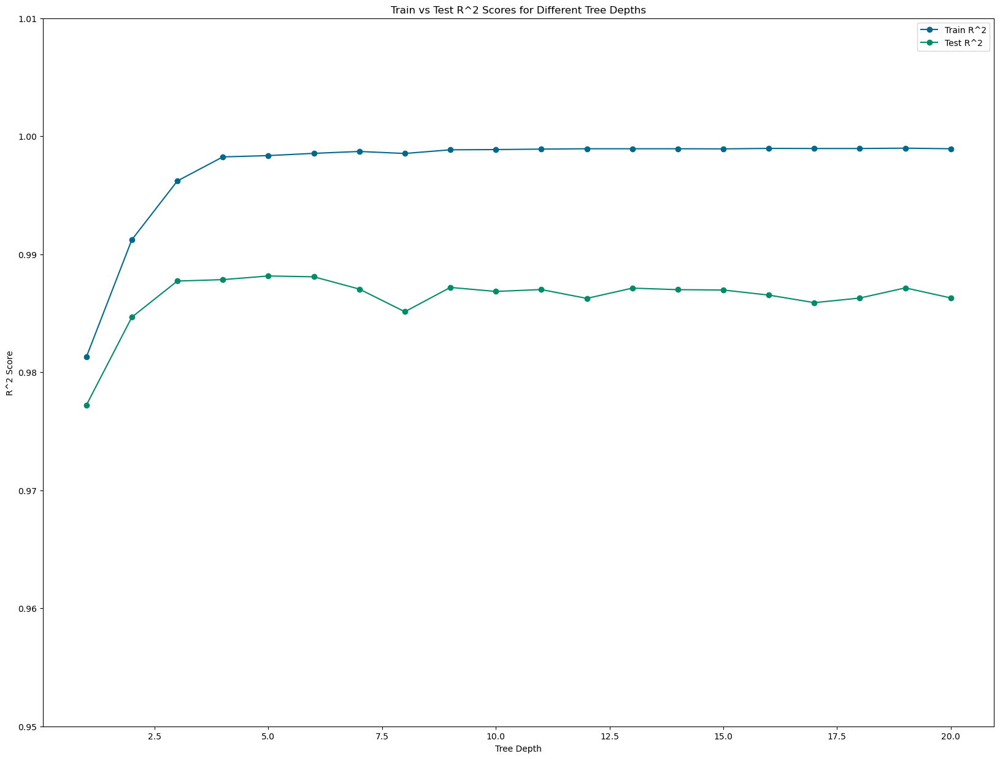

In [270]:

# Plotting
fig, ax = plt.subplots(figsize=(20, 15))

# Plot the R^2 scores for the training set
ax.plot(max_depth_values, train_r2_scores, marker='o', color='#00688B', label='Train R^2')

# Plot the R^2 scores for the test set
ax.plot(max_depth_values, test_r2_scores, marker='o', color='#008B68', label='Test R^2')

ax.set_xlabel('Tree Depth')
ax.set_ylabel('R^2 Score')
ax.set_title('Train vs Test R^2 Scores for Different Tree Depths')
ax.set_ylim(0.95,1.01)
ax.legend()

plt.show()

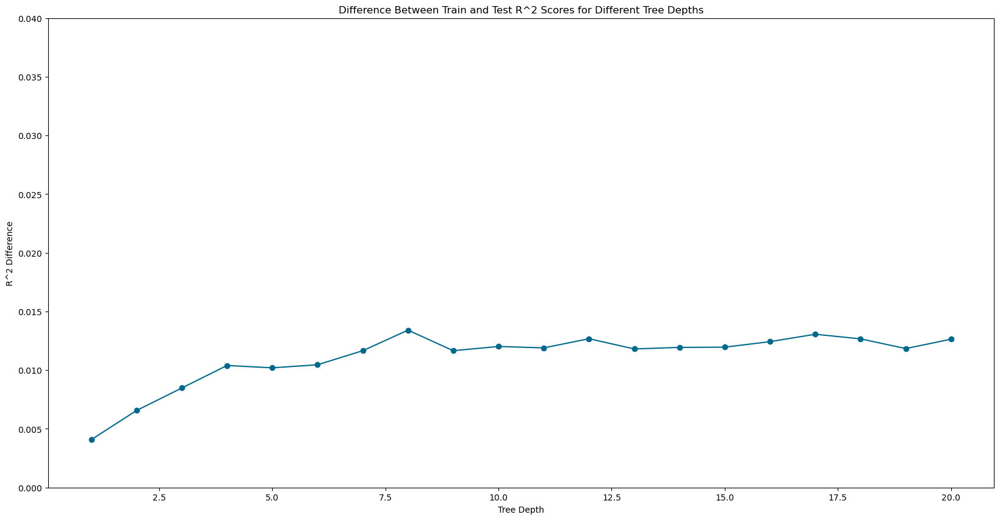

The maximum R^2 score for the test set is 0.98816 at a tree depth of 5


In [274]:
# Plot the difference between the training and test R^2 scores
fig, ax = plt.subplots(figsize=(20, 10))

# Calculate the difference between the training and test R^2 scores
r2_diff = np.array(train_r2_scores) - np.array(test_r2_scores)

# Plot the difference between the training and test R^2 scores
ax.plot(max_depth_values, r2_diff, marker='o', color='#00688B')

ax.set_xlabel('Tree Depth')
ax.set_ylabel('R^2 Difference')
ax.set_title('Difference Between Train and Test R^2 Scores for Different Tree Depths')
ax.set_ylim(0,0.04)

plt.show()

# Print the maximum R^2 score for the test set and the corresponding tree depth
max_r2_test = max(test_r2_scores)
max_r2_test_depth = max_depth_values[test_r2_scores.index(max_r2_test)]

print(f"The maximum R^2 score for the test set is {max_r2_test:.5f} at a tree depth of {max_r2_test_depth}")
